In [1]:
# -*- coding: utf-8 -*-
"""
Build 35 date-aligned datasets (last 100 days) from the workbook:
- Portfolios                -> Portfolio 1D return
- PeerGroups                -> Peer group 1D median return
- Portfolio_peerGroup_mapping (35 rows: code/name -> peer group)
- OAD_DTS_YTW               -> Portfolio OAD, Portfolio DTS
- Curve                     -> CAAA20YR BVLI Index, Spread A, Spread BBB
- Housing_spreads           -> Multi-Family Private & Workforce spreads

Output: one CSV per portfolio in ./output_datasets/
"""

import re
from pathlib import Path
import pandas as pd
import numpy as np
import math

# --------------- config ---------------
INPUT_XLSX = "Project.xlsx"     # <-- change me
OUTPUT_DIR = Path("output_datasets")
OUTPUT_DIR.mkdir(exist_ok=True)


In [2]:
# --------------- helpers ---------------
def _parse_date(s):
    """Parse dates as day-first (matches screenshots)."""
    return pd.to_datetime(s, dayfirst=True, errors="coerce")

def _norm_cols(df):
    """Trim and collapse whitespace in headers."""
    df = df.copy()
    df.columns = (
        pd.Index(df.columns)
        .map(lambda c: "" if pd.isna(c) else str(c))
        .map(lambda c: c.strip())
        .map(lambda c: re.sub(r"\s+", " ", c))
    )
    return df

def _pick_column_for_code(code, mapping_dict):
    """Return best matching column for a portfolio code from a dict {code: colname}."""
    if code in mapping_dict:
        return mapping_dict[code]
    # Fallback: trailing/leading digit overlaps
    for k, v in mapping_dict.items():
        if not k:
            continue
        if code.endswith(k) or k.endswith(code):
            return v
    return None

def _require_columns(df, needed, context):
    """Raise early if required columns are missing."""
    missing = [c for c in needed if c not in df.columns]
    if missing:
        raise ValueError(f"[{context}] Missing expected columns: {missing}")

def ensure_date_column(df, preferred=("Date", "Dates", "Row Labels")):
    """
    Guarantee a 'Date' column:
      1) Try common labels (case-insensitive).
      2) Else promote the first column to 'Date'.
    Then parse dates day-first.
    """
    df = df.copy()
    df.columns = [("" if pd.isna(c) else str(c)).strip() for c in df.columns]
    lower = {c.lower(): c for c in df.columns}
    for p in preferred:
        p_l = p.lower()
        if p_l in lower:
            if lower[p_l] != "Date":
                df = df.rename(columns={lower[p_l]: "Date"})
            break
    else:
        first_col = df.columns[0]
        if first_col != "Date":
            df = df.rename(columns={first_col: "Date"})
    df["Date"] = _parse_date(df["Date"])
    return df

# ---------- Curve helpers (kept; not used after the change) ----------
def find_20y_column(curve_df):
    """
    Find the 20Y tenor column:
      - Prefer exact numeric header '20' / '20.0'.
      - Fallback to textual variants (20YR / 20 YEAR / 20Y).
    """
    for c in curve_df.columns:
        try:
            if abs(float(str(c).strip()) - 20.0) < 1e-12:
                return c
        except Exception:
            continue
    rx_list = [r"^\s*20\s*$", r"^\s*20\.0+\s*$", r".*\b20\s*YR\b.*", r".*\b20\s*YEAR\b.*", r".*\b20Y\b.*"]
    for c in curve_df.columns:
        if any(re.search(rx, str(c), flags=re.IGNORECASE) for rx in rx_list):
            return c
    raise ValueError("[Curve] Could not locate a 20-year tenor column (header like 20 / 20.0).")

def find_spread_col(curve_df, which="A"):
    """
    Find Spread A / Spread BBB columns. Accepts 'A'/'BBB' or 'Spread A'/'Spread BBB'.
    """
    patterns = {
        "A":   [r"^\s*A\s*$", r".*\bSpread\s*A\b.*"],
        "BBB": [r"^\s*BBB\s*$", r".*\bSpread\s*B{3}\b.*"],
    }[which]
    matches = []
    for c in curve_df.columns:
        if any(re.search(rx, str(c), flags=re.IGNORECASE) for rx in patterns):
            matches.append(c)
    if not matches:
        raise ValueError(f"[Curve] Could not find a column for Spread {which} (try 'A' or 'Spread A').")
    return max(matches, key=lambda s: len(str(s)))  # prefer most explicit header
    

In [3]:
# --------------- load all sheets ---------------
with pd.ExcelFile(INPUT_XLSX) as xls:
    portfolios = pd.read_excel(xls, sheet_name="Portfolios")
    peergroups = pd.read_excel(xls, sheet_name="PeerGroups")
    mapping    = pd.read_excel(xls, sheet_name="Portfolio_peerGroup_mapping")
    # Two-row header: row 1 = metric (Muni_OAD/Muni_DTS/YTW), row 2 = code+suffix (e.g., 4316POSONLY)
    oad_dts    = pd.read_excel(xls, sheet_name="OAD_DTS_YTW", header=[0, 1])
    # curve      = pd.read_excel(xls, sheet_name="Curve")
    curve      = pd.read_excel(xls, sheet_name="Curve", header=[0, 1])
    housing    = pd.read_excel(xls, sheet_name="Housing_spreads")


In [4]:
# ---- Holidays: read once and build a normalized date set ----
def _read_holidays(path="Input_file.xlsx", sheet="Holidays"):
    df = pd.read_excel(path, sheet_name=sheet)
    # normalize headers a bit
    df.columns = [("" if pd.isna(c) else str(c)).strip() for c in df.columns]
    # find the 'Date' column case-insensitively
    lower = {c.lower(): c for c in df.columns}
    if "date" not in lower:
        raise ValueError("[Holidays] Could not find a 'Date' column in the Holidays sheet.")
    dcol = lower["date"]
    # parse as day-first; normalize to midnight
    d = pd.to_datetime(df[dcol], dayfirst=True, errors="coerce").dropna().dt.normalize()
    return set(d.unique())

HOLIDAYS = _read_holidays("Input_file.xlsx", "Holidays")
len(HOLIDAYS), list(sorted(HOLIDAYS))[:5]  # quick sanity peek


(35,
 [Timestamp('2023-01-02 00:00:00'),
  Timestamp('2023-01-16 00:00:00'),
  Timestamp('2023-02-20 00:00:00'),
  Timestamp('2023-04-07 00:00:00'),
  Timestamp('2023-05-29 00:00:00')])

In [5]:
def _drop_holidays(df, date_col="Date"):
    """
    Return df with rows removed where Date (normalized) is in HOLIDAYS.
    Safe if column is not present.
    """
    if date_col not in df.columns:
        return df
    out = df.copy()
    # parse/normalize without changing your original dtype flow
    tmp = pd.to_datetime(out[date_col], dayfirst=True, errors="coerce").dt.normalize()
    mask = ~tmp.isin(HOLIDAYS)
    return out.loc[mask].reset_index(drop=True)


In [6]:
portfolios = _drop_holidays(portfolios, "Date")
peergroups = _drop_holidays(peergroups, "Date")
oad_dts    = _drop_holidays(oad_dts,    "Date")
curve      = _drop_holidays(curve,      "Date")
housing    = _drop_holidays(housing,    "Date")


In [7]:

# --------------- normalize & prune ---------------
portfolios = _norm_cols(portfolios)
peergroups = _norm_cols(peergroups)
mapping    = _norm_cols(mapping)
# oad_dts    = _norm_cols(oad_dts)
# curve      = _norm_cols(curve)
housing    = _norm_cols(housing)


In [8]:
portfolios
peergroups
mapping
oad_dts
curve
housing
mapping


,Portfolio_code,Morningstar_name,PeerGroup_name
0,4316,Franklin Federal Tax Free Income Adv,US OE Muni National Long
1,26176,Franklin Municipal Green Bond ETF,US OE Muni National Long
2,4174,Franklin Federal Interm-Term T/F Inc Adv,US OE Muni National Interm
3,4363,Franklin VA Tax Free Income Adv,US OE Muni Single State Long
4,4360,Franklin MO Tax Free Income Adv,US OE Muni Single State Long
5,4319,Franklin MI Tax-Free Inc Adv,US OE Muni Single State Long
6,4364,Franklin Alabama Tax Free Income Advisor,US OE Muni Single State Long
7,4328,Franklin Georgia Tax Free Income Advisor,US OE Muni Single State Long
8,4327,Franklin CO Tax Free Income Adv,US OE Muni Single State Long
9,4370,Franklin NC Tax-Free Income Adv,US OE Muni Single State Long


In [9]:
# Parse dates & keys
portfolios["Date"] = _parse_date(portfolios["Date"])
peergroups["Date"] = _parse_date(peergroups["Date"])
mapping["Portfolio_code"] = mapping["Portfolio_code"].astype(str).str.strip()

# ---------- Standardize Date on Curve & Housing ----------
# curve   = ensure_date_column(curve,   preferred=("Date", "Dates"))
housing = ensure_date_column(housing, preferred=("Date", "Row Labels"))

# ---------- Filter 1D returns ----------
port_ret_1d = (
    portfolios
    .loc[portfolios["Period"].astype(str).str.upper().eq("1D"), ["Date", "Portfolio", "Return"]]
    .rename(columns={"Return": "Portfolio_Return_1D"})
    .dropna(subset=["Date"])
)
pg_ret_1d = (
    peergroups
    .loc[peergroups["Period"].astype(str).str.upper().eq("1D"), ["Date", "Portfolio", "Median_Return"]]
    .rename(columns={"Portfolio": "PeerGroup_name", "Median_Return": "PeerGroup_Return_1D"})
    .dropna(subset=["Date"])
)

# ---------- Housing spreads ----------
housing_cols_map = {
    "Multi-Family Private": "MF_Private_Spread",
    "Multi-Family Workforce": "MF_Workforce_Spread",
}
# tolerate small whitespace/case variations
for k in list(housing_cols_map.keys()):
    if k not in housing.columns:
        for c in housing.columns:
            if re.fullmatch(re.sub(r"\s+", r"\\s*", k), c, flags=re.IGNORECASE):
                housing_cols_map[c] = housing_cols_map.pop(k)
                break
housing_sel = ["Date"] + list(housing_cols_map.keys())
_require_columns(housing, housing_sel, "Housing_spreads")
housing_spreads = housing[housing_sel].rename(columns=housing_cols_map).dropna(subset=["Date"])


In [10]:

# ---------- Curve (two-row header): pick 20Y + Spread A/BBB from second header row ----------
def _clean(x):
    return "" if pd.isna(x) else str(x).strip()

# Ensure MultiIndex columns are clean strings
if not isinstance(curve.columns, pd.MultiIndex):
    curve.columns = pd.MultiIndex.from_tuples([(_clean(c), "") for c in curve.columns])
else:
    curve.columns = pd.MultiIndex.from_tuples([(_clean(a), _clean(b)) for a, b in curve.columns])

# Detect the Date column by content (either level may say 'Dates')
def _score_as_date_col(series, sample_n=200):
    s = pd.Series(series).dropna().astype(str)
    if sample_n and len(s) > sample_n:
        s = s.iloc[:sample_n]
    parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
    return 0.0 if len(s) == 0 else float(parsed.notna().mean())

candidates = []
for col in list(curve.columns):
    score = _score_as_date_col(curve[col])
    a, b = col
    if _clean(a).lower() in {"date","dates"} or _clean(b).lower() in {"date","dates"}:
        score += 0.5
    candidates.append((score, col))
candidates.sort(key=lambda x: x[0], reverse=True)
best_score, best_col = candidates[0]
if best_score < 0.25:
    best_col = curve.columns[0]

# Extract Date by position and flatten headers
date_idx = list(curve.columns).index(best_col)
curve_date = _parse_date(curve.iloc[:, date_idx])
curve_flat = curve.copy()
curve_flat.columns = [f"{_clean(a)}::{_clean(b)}" for (a, b) in curve.columns]
curve_flat.insert(0, "Date", curve_date)

curve_flat = _drop_holidays(curve_flat, "Date")

# Helper to find the 20Y tenor column from level-0 (numeric 20), else fallback to names
def _find_20y_column_from_mi(mi_cols):
    # Prefer exact numeric tenor in level-0
    for a, b in mi_cols:
        try:
            if abs(float(a) - 20.0) < 1e-12:
                return f"{_clean(a)}::{_clean(b)}"
        except Exception:
            pass
    # Fallback: textual variants in either level
    rx = re.compile(r"(?:^|\b)20\s*(?:YR|YEAR|Y)?\b", flags=re.IGNORECASE)
    for a, b in mi_cols:
        if rx.search(_clean(a)) or rx.search(_clean(b)):
            return f"{_clean(a)}::{_clean(b)}"
    raise ValueError("[Curve] Could not locate 20Y tenor column.")

# Find Spread A/BBB explicitly from the *second* header row (level-1)
def _find_spread_from_second_header(mi_cols, target):
    # target is 'Spread A' or 'Spread BBB' (case-insensitive, trim spaces)
    for a, b in mi_cols:
        if _clean(b).lower() == target.lower():
            return f"{_clean(a)}::{_clean(b)}"
    # light fallback: also accept exact 'A'/'BBB' in second header
    short = "A" if target.endswith("A") else "BBB"
    for a, b in mi_cols:
        if _clean(b).upper() == short:
            return f"{_clean(a)}::{_clean(b)}"
    return None

mi_cols = list(curve.columns)

c20_col_flat = _find_20y_column_from_mi(mi_cols)
spreadA_flat = _find_spread_from_second_header(mi_cols, "Spread A")
spreadB_flat = _find_spread_from_second_header(mi_cols, "Spread BBB")

# Optional fallback to tickers if those names aren't present in row-2
if spreadA_flat is None:
    for a, b in mi_cols:
        if _clean(b) == "I13971US Index":
            spreadA_flat = f"{_clean(a)}::{_clean(b)}"; break
if spreadB_flat is None:
    for a, b in mi_cols:
        if _clean(b) == "LMB1TR Index":
            spreadB_flat = f"{_clean(a)}::{_clean(b)}"; break

missing = []
if c20_col_flat is None: missing.append("20Y tenor")
if spreadA_flat is None: missing.append("Spread A (second header)")
if spreadB_flat is None: missing.append("Spread BBB (second header)")
if missing:
    raise ValueError(f"[Curve] Missing columns: {', '.join(missing)}")


############################### NEW FOR 4 FACTORS
def _find_tenor_from_mi(mi_cols, tenor_target):
    # Prefer exact numeric in level-0
    for a, b in mi_cols:
        try:
            if abs(float(str(a).strip()) - float(tenor_target)) < 1e-12:
                return f"{_clean(a)}::{_clean(b)}"
        except Exception:
            pass
    # Fallback: textual variants (e.g., "10Y", "30 YEAR")
    rx = re.compile(rf"(?:^|\b){int(tenor_target)}\s*(?:YR|YEAR|Y)?\b", flags=re.IGNORECASE)
    for a, b in mi_cols:
        if rx.search(_clean(a)) or rx.search(_clean(b)):
            return f"{_clean(a)}::{_clean(b)}"
    return None

c10_flat = _find_tenor_from_mi(mi_cols, 10.0)
c30_flat = _find_tenor_from_mi(mi_cols, 30.0)
c12_flat = _find_tenor_from_mi(mi_cols, 12.0)
missing = []
if c10_flat is None: missing.append("10Y tenor")
if c12_flat is None: missing.append("12Y tenor")
if c30_flat is None: missing.append("30Y tenor")
if missing:
    raise ValueError(f"[Curve] Missing columns: {', '.join(missing)}")

###################################################


curve_sel = (
    curve_flat.loc[:, ["Date", c20_col_flat, c10_flat, c12_flat, c30_flat, spreadA_flat, spreadB_flat]]
    .rename(columns={
        c20_col_flat: "CAAA20YR_BVLI",
        c10_flat:     "Y10",
        c12_flat:     "CAAA12YR_BVLI",
        c30_flat:     "Y30",        
        spreadA_flat: "Spread_A",
        spreadB_flat: "Spread_BBB",
    })
    .dropna(subset=["Date"])
)

# Daily slope (level), then its daily change
curve_sel["Slope_30_10"]  = curve_sel["Y30"] - curve_sel["Y10"]
curve_sel["d_Slope_30_10"] = curve_sel["Slope_30_10"].diff()

curve_sel["d_CAAA12YR_BVLI"] = curve_sel["CAAA12YR_BVLI"].diff()


C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\3047280827.py:16: UserWarning: Parsing dates in %Y-%m-%d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\3047280827.py:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\3047280827.py:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\3047280827.py:16: UserWarning: Could not infer f

In [11]:

# ---------- OAD/DTS (two-row header flattening + mapping, robust Date extraction) ----------
def _clean(x):
    return "" if pd.isna(x) else str(x).strip()

# Ensure columns are a clean MultiIndex (metric in level 0, id/suffix in level 1)
if isinstance(oad_dts.columns, pd.MultiIndex):
    oad_dts.columns = pd.MultiIndex.from_tuples([(_clean(a), _clean(b)) for a, b in oad_dts.columns])
else:
    # If reloaded differently, coerce to two levels to keep the rest of logic unified
    oad_dts.columns = pd.MultiIndex.from_tuples([(_clean(c), "") for c in oad_dts.columns])

# --- detect which column is actually the Date column (by contents, not name) ---
def _score_as_date_col(series, sample_n=200):
    s = pd.Series(series).dropna().astype(str)
    if sample_n and len(s) > sample_n:
        s = s.iloc[:sample_n]
    parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
    return 0.0 if len(s) == 0 else float(parsed.notna().mean())

candidates = []
for col in list(oad_dts.columns):
    score = _score_as_date_col(oad_dts[col])
    # small name bonus if either level literally says 'date'
    a, b = col
    if _clean(a).lower() == "date" or _clean(b).lower() == "date":
        score += 0.5
    candidates.append((score, col))

candidates.sort(key=lambda x: x[0], reverse=True)
best_score, best_col = candidates[0]
# if nothing looks like dates, fall back to the first column
if best_score < 0.25:
    best_col = oad_dts.columns[0]

# --- extract the detected date series by position (avoid label indexing entirely) ---
best_idx = list(oad_dts.columns).index(best_col)
date_series = _parse_date(oad_dts.iloc[:, best_idx])

# --- flatten headers to single level BEFORE we add our own 'Date' column ---
flat_cols = [f"{_clean(a)}::{_clean(b)}" for (a, b) in oad_dts.columns]
oad_dts_flat = oad_dts.copy()
oad_dts_flat.columns = flat_cols

# Insert a fresh single-level 'Date' column (first position)
oad_dts_flat.insert(0, "Date", date_series)

oad_dts_flat = _drop_holidays(oad_dts_flat, "Date")

# Build code->column maps from flattened headers
oad_map, dts_map = {}, {}
for col in oad_dts_flat.columns:
    if col == "Date":
        continue
    # expect "metric::id"; tolerate missing '::'
    parts = col.split("::", 1)
    metric = parts[0].lower()
    id_part = parts[1] if len(parts) == 2 else ""
    codes = re.findall(r"\d{3,6}", id_part)
    if not codes:
        continue
    code = codes[-1]  # prefer last if multiple
    if "oad" in metric:  # e.g., 'Muni_OAD'
        oad_map[code] = col
    if re.search(r"\b(dts|muni[_\s]*dts)\b", metric):
        dts_map[code] = col

# From here on, use 'oad_dts_flat' instead of 'oad_dts'


C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\1303004347.py:17: UserWarning: Parsing dates in %m/%d/%Y format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\1303004347.py:17: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\1303004347.py:17: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\1303004347.py:17: UserWarning: Could not infer f

In [12]:

# --------------- per-portfolio build ---------------
def build_dataset(row):
    """
    Build one portfolio dataset (last 100 aligned dates).
    """
    code  = str(row["Portfolio_code"]).strip()
    pname = str(row["Morningstar_name"]).strip()
    gname = str(row["PeerGroup_name"]).strip()

    # Portfolio 1D return
    p1 = port_ret_1d.loc[port_ret_1d["Portfolio"] == pname, ["Date", "Portfolio_Return_1D"]]
    # Peer group 1D return (median)
    p2 = pg_ret_1d.loc[pg_ret_1d["PeerGroup_name"] == gname, ["Date", "PeerGroup_Return_1D"]]

    # OAD / DTS columns via maps
    oad_col = _pick_column_for_code(code, oad_map)
    dts_col = _pick_column_for_code(code, dts_map)

    # Fallback: try regex where both metric and code appear (either order)
    if oad_col is None or dts_col is None:
        def loose_find(metric_patterns):
            code_rx = re.compile(re.escape(code), re.IGNORECASE)
            for c in oad_dts_flat.columns:
            # for c in oad_dts.columns:
                h = str(c)
                if c == "Date":
                    continue
                if code_rx.search(h) and metric_patterns.search(h):
                    return c
                if metric_patterns.search(h) and code_rx.search(h):
                    return c
            return None
        if oad_col is None:
            oad_col = loose_find(re.compile(r"\bOAD\b", re.IGNORECASE))
        if dts_col is None:
            dts_col = loose_find(re.compile(r"\b(DTS|Muni[_\s]*DTS)\b", re.IGNORECASE))

    if oad_col is None or dts_col is None:
        missing = []
        if oad_col is None: missing.append("OAD")
        if dts_col is None: missing.append("DTS")
        raise KeyError(f"[OAD_DTS_YTW] Could not find {missing} column(s) for portfolio code {code}")

    p3 = (
        oad_dts_flat.loc[:, ["Date", oad_col, dts_col]]
               .rename(columns={oad_col: "OAD", dts_col: "DTS"})
               .dropna(subset=["Date"])
    )

    # Global series (same for all portfolios)
    p4 = housing_spreads.copy()
    p5 = curve_sel.copy()

    # Strict alignment: inner joins on Date
    dfs = [p1, p2, p3, p4, p5]
    dfs_sorted = sorted(dfs, key=lambda d: d.shape[0])
    merged = dfs_sorted[0]
    for d in dfs_sorted[1:]:
        merged = merged.merge(d, on="Date", how="inner")

    # Last 100 aligned dates
    merged = merged.sort_values("Date").tail(100).reset_index(drop=True)

    # Add identity columns
    merged.insert(1, "Portfolio_Name", pname)
    merged.insert(2, "Portfolio_Code", code)
    merged.insert(3, "PeerGroup_Name", gname)

    # --- NEW: add daily changes (first differences) for the requested series ---
    # We compute ΔX_t = X_t - X_{t-1} on the already date-sorted, aligned data.
    # These deltas will be used by the one-factor model (default factor = ΔSpread_A).
    change_cols = [
        ("MF_Private_Spread",   "d_MF_Private_Spread"),
        ("MF_Workforce_Spread", "d_MF_Workforce_Spread"),
        ("CAAA20YR_BVLI",       "d_CAAA20YR_BVLI"),
        ("Spread_A",            "d_Spread_A"),
        ("Spread_BBB",          "d_Spread_BBB"),
        ("CAAA12YR_BVLI",       "d_CAAA12YR_BVLI"),
    ]
    for base, delta in change_cols:
        if base in merged.columns:
            merged[delta] = merged[base].diff()
        else:
            merged[delta] = np.nan

    # x1 = (-1) * OAD_{t-1} * d_CAAA20YR_BVLI
    # x2 = (-1) * DTS_{t-1} * 0.5*(d_Spread_A + d_Spread_BBB)
    # x3 = (-1) * 0.5*(d_MF_Private_Spread + d_MF_Workforce_Spread)

    merged["OAD_lag1"] = merged["OAD"].shift(1)
    merged["DTS_lag1"] = merged["DTS"].shift(1)

    merged["credit_mix"] = 0.5 * (merged["d_Spread_A"] + merged["d_Spread_BBB"])
    merged["mf_mix"]     = 0.5 * (merged["d_MF_Private_Spread"] + merged["d_MF_Workforce_Spread"])

    # merged["x1_rate"]   = - merged["OAD_lag1"] * merged["d_CAAA20YR_BVLI"]
    # merged["x1_rate12"]  = - merged["OAD_lag1"] * merged["d_CAAA12YR_BVLI"]
    merged["x1_rate"]   = - merged["OAD_lag1"] * merged["d_CAAA12YR_BVLI"]
    merged["x2_credit"] = - merged["DTS_lag1"] * merged["credit_mix"]
    merged["x3_mf"]     = - merged["mf_mix"]

    # --- NEW: robust percent changes for factors (audit-ready) ---
    EPS = 1e-6  # small floor to avoid division blowups

    def _pct_change(curr, prev, eps=EPS):
        denom = np.where(np.abs(prev) < eps, eps, prev)
        return (curr - prev) / denom

    # Create lagged levels for denominators
    merged["CAAA20YR_BVLI_lag1"]       = merged["CAAA20YR_BVLI"].shift(1)
    merged["Spread_A_lag1"]            = merged["Spread_A"].shift(1)
    merged["Spread_BBB_lag1"]          = merged["Spread_BBB"].shift(1)
    merged["MF_Private_Spread_lag1"]   = merged["MF_Private_Spread"].shift(1)
    merged["MF_Workforce_Spread_lag1"] = merged["MF_Workforce_Spread"].shift(1)

    # Percent changes
    merged["pc_CAAA20YR_BVLI"]       = _pct_change(merged["CAAA20YR_BVLI"],       merged["CAAA20YR_BVLI_lag1"])
    merged["pc_Spread_A"]            = _pct_change(merged["Spread_A"],            merged["Spread_A_lag1"])
    merged["pc_Spread_BBB"]          = _pct_change(merged["Spread_BBB"],          merged["Spread_BBB_lag1"])
    merged["pc_MF_Private_Spread"]   = _pct_change(merged["MF_Private_Spread"],   merged["MF_Private_Spread_lag1"])
    merged["pc_MF_Workforce_Spread"] = _pct_change(merged["MF_Workforce_Spread"], merged["MF_Workforce_Spread_lag1"])

    # Pct-change mixes
    merged["pc_credit_mix"] = 0.5 * (merged["pc_Spread_A"] + merged["pc_Spread_BBB"])
    merged["pc_mf_mix"]     = 0.5 * (merged["pc_MF_Private_Spread"] + merged["pc_MF_Workforce_Spread"])

    # Audited pct-change regressors (parallel to Δ-based ones)
    # x1_rate_pct = - OAD_{t-1} * pc_CAAA20YR_BVLI
    # x2_credit_pct = - DTS_{t-1} * pc_credit_mix
    # x3_mf_pct = - pc_mf_mix
    merged["x1_rate_pct"]   = - merged["OAD_lag1"] * merged["pc_CAAA20YR_BVLI"]
    merged["x2_credit_pct"] = - merged["DTS_lag1"] * merged["pc_credit_mix"]
    merged["x3_mf_pct"]     = - merged["pc_mf_mix"]


    # already have: merged includes Y10, Y30, Slope_30_10 from curve_sel merge
    # ensure Δ(slope) exists (safe if already computed upstream)
    if "d_Slope_30_10" not in merged.columns and "Slope_30_10" in merged.columns:
        merged["d_Slope_30_10"] = merged["Slope_30_10"].diff()

    # Factors:
    # x1 (unchanged): -OAD_{t-1} * Δ20Y
    # merged["x1_rate"] = - merged["OAD_lag1"] * merged["d_CAAA20YR_BVLI"]
    # merged["x1_rate12"]  = - merged["OAD_lag1"] * merged["d_CAAA12YR_BVLI"]
    merged["x1_rate"] = - merged["OAD_lag1"] * merged["d_CAAA12YR_BVLI"]

    # NEW x2: change in curve slope (30Y – 10Y), simple daily difference
    # No scaling by OAD/DTS per spec
    merged["x2_slope"] = merged["d_Slope_30_10"]

    # You already created %Δ versions:
    #   merged["x2_credit_pct"] = - DTS_{t-1} * pc_credit_mix
    #   merged["x3_mf_pct"]     = - pc_mf_mix
    # We’ll reuse those as X3 and X4 in the 4-factor spec.



    # Final column order
    final_cols = [
        "Date",
        "Portfolio_Name", "Portfolio_Code", "PeerGroup_Name",
        "Portfolio_Return_1D", "PeerGroup_Return_1D",
        "OAD", "DTS",
        "Y10", "Y30", "Slope_30_10", "d_Slope_30_10",        # <-- NEW (audit)
        "MF_Private_Spread", "d_MF_Private_Spread",
        "MF_Workforce_Spread", "d_MF_Workforce_Spread",
        "CAAA20YR_BVLI","d_CAAA20YR_BVLI",
        "CAAA12YR_BVLI","d_CAAA12YR_BVLI",
        "Spread_A", "d_Spread_A",
        "Spread_BBB", "d_Spread_BBB",
        "x1_rate",
        # "x1_rate12",
        "x2_credit", "x3_mf",
        "x2_slope",               # Δ slope(30–10)  <-- NEW
            
        "pc_CAAA20YR_BVLI", "pc_Spread_A", "pc_Spread_BBB",
        "pc_MF_Private_Spread", "pc_MF_Workforce_Spread",
        "pc_credit_mix", "pc_mf_mix",
        "x1_rate_pct", "x2_credit_pct", "x3_mf_pct"
    ]
    merged = merged[final_cols]

    # Filename-safe
    safe_name = re.sub(r"[^A-Za-z0-9._-]+", "_", pname).strip("_")
    return safe_name, merged
    

In [13]:

def _ols_one_factor(y: pd.Series, x: pd.Series):
    """
    Simple OLS: y = alpha + beta * x + ε
    Returns dict(alpha, beta, r2, t_alpha, t_beta, n)
    No external dependencies; uses numpy only.
    """
    # Drop rows with NaNs in either series
    df = pd.concat({"y": y, "x": x}, axis=1).dropna()
    n = len(df)
    if n < 5:
        return {"alpha": np.nan, "beta": np.nan, "r2": np.nan,
                "t_alpha": np.nan, "t_beta": np.nan,
                "p_alpha": np.nan, "p_beta": np.nan, "n": n}
    
    Y = df["y"].to_numpy(dtype=float)
    X = df["x"].to_numpy(dtype=float)
    # Design matrix with intercept
    Xmat = np.column_stack([np.ones(n), X])

    # OLS via least squares
    coef, residuals, rank, s = np.linalg.lstsq(Xmat, Y, rcond=None)
    alpha, beta = coef

    # Compute fitted, residuals, R^2
    yhat = Xmat @ coef
    resid = Y - yhat
    ss_res = float(np.sum(resid**2))
    ss_tot = float(np.sum((Y - Y.mean())**2))
    r2 = 1.0 - ss_res / ss_tot if ss_tot > 0 else np.nan

    # Robust std errors (homoskedastic OLS)
    dof = max(n - 2, 1)
    sigma2 = ss_res / dof
    XtX_inv = np.linalg.inv(Xmat.T @ Xmat)
    se_alpha = np.sqrt(sigma2 * XtX_inv[0, 0])
    se_beta  = np.sqrt(sigma2 * XtX_inv[1, 1])

    t_alpha = alpha / se_alpha if se_alpha > 0 else np.nan
    t_beta  = beta  / se_beta  if se_beta  > 0 else np.nan

    # p-values: try exact Student-t; else normal approximation fallback
    p_alpha = np.nan
    p_beta  = np.nan
    try:
        from scipy.stats import t as student_t  # optional
        if np.isfinite(t_alpha):
            p_alpha = 2.0 * student_t.sf(abs(t_alpha), df=dof)
        if np.isfinite(t_beta):
            p_beta  = 2.0 * student_t.sf(abs(t_beta), df=dof)
    except Exception:
        # Normal approx: p ≈ 2 * (1 - Φ(|t|))
        # Φ via erfc: 1 - Φ(z) = 0.5 * erfc(z / sqrt(2))
        def normal_two_sided_p(t):
            if not np.isfinite(t):
                return np.nan
            return 2.0 * 0.5 * math.erfc(abs(t) / math.sqrt(2.0))
        p_alpha = normal_two_sided_p(t_alpha)
        p_beta  = normal_two_sided_p(t_beta)    

    return {"alpha": alpha, "beta": beta, "r2": r2,
            "t_alpha": t_alpha, "t_beta": t_beta,
            "p_alpha": p_alpha, "p_beta": p_beta,
            "n": n}

In [14]:
def _ols_multifactor(y: pd.Series, X: np.ndarray, colnames):
    """
    OLS: y = b0 + X @ b + eps
    Returns coef, t-stats, p-values, R^2, n.
    colnames: list of regressor names matching X columns (for labeling)
    """
    import math
    df = pd.concat({"y": y}, axis=1).dropna()
    # align X to y after the dropna above:
    # Build a mask over the original y index to select corresponding X rows
    mask = ~pd.isna(y)
    # However we already dropped NaNs in a pre-constructed dataframe in the run loop.
    # So assume X already matches y length/order there.
    n = len(y)
    k = X.shape[1] if n > 0 else 0
    if n < (k + 5):  # need some dof
        res = {"n": n, "r2": np.nan}
        res.update({f"b{i}": np.nan for i in range(k+1)})
        res.update({f"t_b{i}": np.nan for i in range(k+1)})
        res.update({f"p_b{i}": np.nan for i in range(k+1)})
        return res

    # Design with intercept
    Xmat = np.column_stack([np.ones(n), X])  # n x (k+1)
    Y = y.to_numpy(dtype=float)

    coef, residuals, rank, s = np.linalg.lstsq(Xmat, Y, rcond=None)
    yhat = Xmat @ coef
    resid = Y - yhat
    ss_res = float(np.sum(resid**2))
    ss_tot = float(np.sum((Y - Y.mean())**2))
    r2 = 1.0 - ss_res/ss_tot if ss_tot > 0 else np.nan

    dof = max(n - (k+1), 1)
    sigma2 = ss_res / dof
    XtX_inv = np.linalg.inv(Xmat.T @ Xmat)
    se = np.sqrt(np.clip(np.diag(XtX_inv) * sigma2, 0, np.inf))  # (k+1,)

    tvals = np.where(se > 0, coef / se, np.nan)

    # p-values: Student-t if available, else normal approx
    pvals = np.full_like(tvals, np.nan, dtype=float)
    try:
        from scipy.stats import t as student_t
        pvals = 2.0 * student_t.sf(np.abs(tvals), df=dof)
    except Exception:
        pvals = 2.0 * 0.5 * np.vectorize(math.erfc)(np.abs(tvals)/math.sqrt(2.0))

    # pack results
    out = {"n": n, "r2": r2}
    # b0 then b1..bk
    for i in range(k+1):
        out[f"b{i}"] = coef[i]
        out[f"t_b{i}"] = tvals[i]
        out[f"p_b{i}"] = pvals[i]
    # nice labels for columns
    out["_labels"] = ["Intercept"] + list(colnames)
    return out


In [15]:

# --------------- run for all portfolios and write one Excel ---------------
datasets = {}
errors = []

one_factor_rows = []
FACTOR_COLS = [
    "d_MF_Private_Spread",
    "d_MF_Workforce_Spread",
    "d_CAAA20YR_BVLI",
    "d_Spread_A",
    "d_Spread_BBB",
]

multi_factor_rows = []  # to write MultiFactor_Summary


for idx, row in mapping.iterrows():
    try:
        safe_name, dfp = build_dataset(row)
        code_key = str(row["Portfolio_code"]).strip()
        gname = str(row["PeerGroup_name"]).strip()
        datasets[code_key] = dfp

        # ---------------- One-factor models ----------------
        for fac in FACTOR_COLS:
            if fac not in dfp.columns:
                one_factor_rows.append({
                    "Portfolio_Code": code_key,
                    "Portfolio_Name": safe_name,
                    "Factor": fac,
                    "alpha": np.nan, "beta": np.nan, "r2": np.nan,
                    # "t_alpha": np.nan, "t_beta": np.nan, "n": 0
                    "n": 0
                })
                continue

            df_latest = (
                dfp[["Date", "Portfolio_Return_1D", fac]]
                .dropna()
                .sort_values("Date")
                .tail(50)
            )
            y = df_latest["Portfolio_Return_1D"]
            x = df_latest[fac]

            stats = _ols_one_factor(y, x)
            stats["n"] = len(df_latest)

            one_factor_rows.append({
                "Portfolio_Code": code_key,
                "Portfolio_Name": safe_name,
                "Factor": fac,
                **stats
            })

        # ---------------- Multi-factor model (latest 50 obs) ----------------
        # dfm = dfp.sort_values("Date").copy()
        # dfm["OAD_lag1"] = dfm["OAD"].shift(1)
        # dfm["DTS_lag1"] = dfm["DTS"].shift(1)
        # dfm["credit_mix"] = 0.5 * (dfm["d_Spread_A"] + dfm["d_Spread_BBB"])
        # dfm["mf_mix"]     = 0.5 * (dfm["d_MF_Private_Spread"] + dfm["d_MF_Workforce_Spread"])

        # dfm["x1"] = - dfm["OAD_lag1"] * dfm["d_CAAA20YR_BVLI"]
        # dfm["x2"] = - dfm["DTS_lag1"] * dfm["credit_mix"]
        # dfm["x3"] = - dfm["mf_mix"]

        # For portfolio regression
        # df_reg = dfm[["Portfolio_Return_1D", "x1", "x2", "x3"]].dropna().tail(50)
        # For peer group regression
        # df_reg_pct = dfm[["PeerGroup_Return_1D", "x1", "x2", "x3"]].dropna().tail(50)

        # ---------------- Multi-factor model (latest 50 obs) ----------------
        df_reg_port     = dfp[["Portfolio_Return_1D", "x1_rate", "x2_credit", "x3_mf"]].dropna().tail(50)
        df_reg_peer     = dfp[["PeerGroup_Return_1D", "x1_rate", "x2_credit", "x3_mf"]].dropna().tail(50)

        # Portfolio regression
        if len(df_reg_port) >= 8:
            y_port = df_reg_port["Portfolio_Return_1D"]
            # X_port = df_reg_port[["x1", "x2", "x3"]].to_numpy(dtype=float)
            X_port = df_reg_port[["x1_rate", "x2_credit", "x3_mf"]].to_numpy(dtype=float)
            res_port = _ols_multifactor(y_port, X_port, ["-OAD*Δ20Y", "-DTS*Δ(A+BBB)/2", "-ΔMFmix/1"])
        else:
            res_port = {k: np.nan for k in ["b0","b1","t_b1","p_b1","b2","t_b2","p_b2","b3","t_b3","p_b3","r2","n"]}
            res_port["n"] = len(df_reg_port)

        # Peer group regression
        if len(df_reg_peer) >= 8:
            y_peer = df_reg_peer["PeerGroup_Return_1D"]
            # X_peer = df_reg_peer[["x1", "x2", "x3"]].to_numpy(dtype=float)
            X_peer = df_reg_peer[["x1_rate", "x2_credit", "x3_mf"]].to_numpy(dtype=float)
            res_peer = _ols_multifactor(y_peer, X_peer, ["-OAD*Δ20Y", "-DTS*Δ(A+BBB)/2", "-ΔMFmix/1"])
        else:
            res_peer = {k: np.nan for k in ["b0","b1","t_b1","p_b1","b2","t_b2","p_b2","b3","t_b3","p_b3","r2","n"]}
            res_peer["n"] = len(df_reg_peer)




        # ---------------- Multi-factor model with PCT-CHANGE (latest 50 obs) ----------------
        df_pct_port = dfp[["Portfolio_Return_1D", "x1_rate_pct", "x2_credit_pct", "x3_mf_pct"]].dropna().tail(50)
        df_pct_peer = dfp[["PeerGroup_Return_1D", "x1_rate_pct", "x2_credit_pct", "x3_mf_pct"]].dropna().tail(50)

        # Portfolio (pct)
        if len(df_pct_port) >= 8:
            y_port_pct = df_pct_port["Portfolio_Return_1D"]
            X_port_pct = df_pct_port[["x1_rate_pct","x2_credit_pct","x3_mf_pct"]].to_numpy(dtype=float)
            res_port_pct = _ols_multifactor(y_port_pct, X_port_pct, ["-OAD*%Δ20Y", "-DTS*%Δ(A+BBB)/2", "-%ΔMFmix/1"])
        else:
            res_port_pct = {k: np.nan for k in ["b0","b1","t_b1","p_b1","b2","t_b2","p_b2","b3","t_b3","p_b3","r2","n"]}
            res_port_pct["n"] = len(df_pct_port)

        # Peer group (pct)
        if len(df_pct_peer) >= 8:
            y_peer_pct = df_pct_peer["PeerGroup_Return_1D"]
            X_peer_pct = df_pct_peer[["x1_rate_pct","x2_credit_pct","x3_mf_pct"]].to_numpy(dtype=float)
            res_peer_pct = _ols_multifactor(y_peer_pct, X_peer_pct, ["-OAD*%Δ20Y", "-DTS*%Δ(A+BBB)/2", "-%ΔMFmix/1"])
        else:
            res_peer_pct = {k: np.nan for k in ["b0","b1","t_b1","p_b1","b2","t_b2","p_b2","b3","t_b3","p_b3","r2","n"]}
            res_peer_pct["n"] = len(df_pct_peer)




        # ---------------- Multi-factor model with MIX-PCT-CHANGE (latest 50 obs) ----------------
        df_mix_port = dfp[["Portfolio_Return_1D", "x1_rate", "x2_credit_pct", "x3_mf_pct"]].dropna().tail(50)
        df_mix_peer = dfp[["PeerGroup_Return_1D", "x1_rate", "x2_credit_pct", "x3_mf_pct"]].dropna().tail(50)

        # Portfolio (pct)
        if len(df_mix_port) >= 8:
            y_port_mix = df_mix_port["Portfolio_Return_1D"]
            X_port_mix = df_mix_port[["x1_rate","x2_credit_pct","x3_mf_pct"]].to_numpy(dtype=float)
            res_port_mix = _ols_multifactor(y_port_mix, X_port_mix, ["-OAD*Δ20Y", "-DTS*%Δ(A+BBB)/2", "-%ΔMFmix/1"])
        else:
            res_port_mix = {k: np.nan for k in ["b0","b1","t_b1","p_b1","b2","t_b2","p_b2","b3","t_b3","p_b3","r2","n"]}
            res_port_mix["n"] = len(df_mix_port)

        # Peer group (pct)
        if len(df_mix_peer) >= 8:
            y_peer_mix = df_mix_peer["PeerGroup_Return_1D"]
            X_peer_mix = df_mix_peer[["x1_rate","x2_credit_pct","x3_mf_pct"]].to_numpy(dtype=float)
            res_peer_mix = _ols_multifactor(y_peer_mix, X_peer_mix, ["-OAD*Δ20Y", "-DTS*%Δ(A+BBB)/2", "-%ΔMFmix/1"])
        else:
            res_peer_mix = {k: np.nan for k in ["b0","b1","t_b1","p_b1","b2","t_b2","p_b2","b3","t_b3","p_b3","r2","n"]}
            res_peer_mix["n"] = len(df_mix_peer)





        # --------------- New 4-factor spec: x1=Δrate, x2=Δ(30–10), x3=%Δ credit, x4=%Δ MF ---------------
        # df4_port = dfp[["Portfolio_Return_1D", "x1_rate", "x2_slope", "x2_credit_pct", "x3_mf_pct"]].dropna().tail(50)
        # df4_peer = dfp[["PeerGroup_Return_1D", "x1_rate", "x2_slope", "x2_credit_pct", "x3_mf_pct"]].dropna().tail(50)

        # if len(df4_port) >= 10:
        #     y4p = df4_port["Portfolio_Return_1D"]
        #     X4p = df4_port[["x1_rate","x2_slope","x2_credit_pct","x3_mf_pct"]].to_numpy(float)
        #     res4_port = _ols_multifactor(y4p, X4p, ["-OAD*Δ20Y", "Δ(30Y-10Y)", "-DTS*%Δ(A+BBB)/2", "-%ΔMFmix"])
        # else:
        #     res4_port = {k: np.nan for k in ["b0","b1","b2","b3","b4","r2","n"]}; res4_port["n"] = len(df4_port)

        # if len(df4_peer) >= 10:
        #     y4g = df4_peer["PeerGroup_Return_1D"]
        #     X4g = df4_peer[["x1_rate","x2_slope","x2_credit_pct","x3_mf_pct"]].to_numpy(float)
        #     res4_peer = _ols_multifactor(y4g, X4g, ["-OAD*Δ20Y", "Δ(30Y-10Y)", "-DTS*%Δ(A+BBB)/2", "-%ΔMFmix"])
        # else:
        #     res4_peer = {k: np.nan for k in ["b0","b1","b2","b3","b4","r2","n"]}; res4_peer["n"] = len(df4_peer)






        # --------------- New 4-factor spec: x1=Δrate, x2=Δ(30–10), x3=%Δ credit, x4=%Δ MF ---------------
        df4_port = dfp[["Portfolio_Return_1D", "x1_rate", "x2_slope", "x2_credit_pct", "x3_mf_pct"]].dropna().tail(50)
        df4_peer = dfp[["PeerGroup_Return_1D", "x1_rate", "x2_slope", "x2_credit_pct", "x3_mf_pct"]].dropna().tail(50)

        if len(df4_port) >= 10:
            y4p = df4_port["Portfolio_Return_1D"]
            X4p = df4_port[["x1_rate","x2_slope","x2_credit_pct","x3_mf_pct"]].to_numpy(float)
            # X4p = df4_port[["x1_rate12","x2_slope","x2_credit_pct","x3_mf_pct"]].to_numpy(float)
            # res4_port = _ols_multifactor(y4p, X4p, ["-OAD*Δ20Y", "Δ(30Y-10Y)", "-DTS*%Δ(A+BBB)/2", "-%ΔMFmix"])
            res4_port = _ols_multifactor(y4p, X4p, ["-OAD*Δ12Y", "Δ(30Y-10Y)", "-DTS*%Δ(A+BBB)/2", "-%ΔMFmix"])
        else:
            res4_port = {k: np.nan for k in ["b0","b1","b2","b3","b4","r2","n"]}; res4_port["n"] = len(df4_port)

        if len(df4_peer) >= 10:
            y4g = df4_peer["PeerGroup_Return_1D"]
            X4g = df4_peer[["x1_rate","x2_slope","x2_credit_pct","x3_mf_pct"]].to_numpy(float)
            # X4g = df4_peer[["x1_rate12","x2_slope","x2_credit_pct","x3_mf_pct"]].to_numpy(float)
            # res4_peer = _ols_multifactor(y4g, X4g, ["-OAD*Δ20Y", "Δ(30Y-10Y)", "-DTS*%Δ(A+BBB)/2", "-%ΔMFmix"])
            res4_peer = _ols_multifactor(y4g, X4g, ["-OAD*Δ12Y", "Δ(30Y-10Y)", "-DTS*%Δ(A+BBB)/2", "-%ΔMFmix"])
        else:
            res4_peer = {k: np.nan for k in ["b0","b1","b2","b3","b4","r2","n"]}; res4_peer["n"] = len(df4_peer)







        # Combine both sets in one row
        multi_factor_rows.append({
            "Portfolio_Code": code_key,
            "Portfolio_Name": safe_name,
            "PeerGroup_Name": gname,

            # Portfolio regression results
            "b0": res_port.get("b0"),
            "b1": res_port.get("b1"), "t_b1": res_port.get("t_b1"), "p_b1": res_port.get("p_b1"),
            "b2": res_port.get("b2"), "t_b2": res_port.get("t_b2"), "p_b2": res_port.get("p_b2"),
            "b3": res_port.get("b3"), "t_b3": res_port.get("t_b3"), "p_b3": res_port.get("p_b3"),
            "r2": res_port.get("r2"), "n": res_port.get("n"),

            # Peer group regression results
            "b0_pg": res_peer.get("b0"),
            "b1_pg": res_peer.get("b1"), "t_b1_pg": res_peer.get("t_b1"), "p_b1_pg": res_peer.get("p_b1"),
            "b2_pg": res_peer.get("b2"), "t_b2_pg": res_peer.get("t_b2"), "p_b2_pg": res_peer.get("p_b2"),
            "b3_pg": res_peer.get("b3"), "t_b3_pg": res_peer.get("t_b3"), "p_b3_pg": res_peer.get("p_b3"),
            "r2_pg": res_peer.get("r2"), "n_pg": res_peer.get("n"),



            # %Δ-based (NEW)
            "b0_pct":   res_port_pct.get("b0"),
            "b1_pct":   res_port_pct.get("b1"), "t_b1_pct": res_port_pct.get("t_b1"), "p_b1_pct": res_port_pct.get("p_b1"),
            "b2_pct":   res_port_pct.get("b2"), "t_b2_pct": res_port_pct.get("t_b2"), "p_b2_pct": res_port_pct.get("p_b2"),
            "b3_pct":   res_port_pct.get("b3"), "t_b3_pct": res_port_pct.get("t_b3"), "p_b3_pct": res_port_pct.get("p_b3"),
            "r2_pct":   res_port_pct.get("r2"), "n_pct":   res_port_pct.get("n"),

            "b0_pg_pct": res_peer_pct.get("b0"),
            "b1_pg_pct": res_peer_pct.get("b1"), "t_b1_pg_pct": res_peer_pct.get("t_b1"), "p_b1_pg_pct": res_peer_pct.get("p_b1"),
            "b2_pg_pct": res_peer_pct.get("b2"), "t_b2_pg_pct": res_peer_pct.get("t_b2"), "p_b2_pg_pct": res_peer_pct.get("p_b2"),
            "b3_pg_pct": res_peer_pct.get("b3"), "t_b3_pg_pct": res_peer_pct.get("t_b3"), "p_b3_pg_pct": res_peer_pct.get("p_b3"),
            "r2_pg_pct": res_peer_pct.get("r2"), "n_pg_pct": res_peer_pct.get("n"),



            # %Δ-based MIXED (NEW)
            "b0_mix":   res_port_mix.get("b0"),
            "b1_mix":   res_port_mix.get("b1"), "t_b1_mix": res_port_mix.get("t_b1"), "p_b1_mix": res_port_mix.get("p_b1"),
            "b2_mix":   res_port_mix.get("b2"), "t_b2_mix": res_port_mix.get("t_b2"), "p_b2_mix": res_port_mix.get("p_b2"),
            "b3_mix":   res_port_mix.get("b3"), "t_b3_mix": res_port_mix.get("t_b3"), "p_b3_mix": res_port_mix.get("p_b3"),
            "r2_mix":   res_port_mix.get("r2"), "n_mix":   res_port_mix.get("n"),

            "b0_pg_mix": res_peer_mix.get("b0"),
            "b1_pg_mix": res_peer_mix.get("b1"), "t_b1_pg_mix": res_peer_mix.get("t_b1"), "p_b1_pg_mix": res_peer_mix.get("p_b1"),
            "b2_pg_mix": res_peer_mix.get("b2"), "t_b2_pg_mix": res_peer_mix.get("t_b2"), "p_b2_pg_mix": res_peer_mix.get("p_b2"),
            "b3_pg_mix": res_peer_mix.get("b3"), "t_b3_pg_mix": res_peer_mix.get("t_b3"), "p_b3_pg_mix": res_peer_mix.get("p_b3"),
            "r2_pg_mix": res_peer_mix.get("r2"), "n_pg_mix": res_peer_mix.get("n"),



            # 4 factors (NEW)
            "b0_4f":   res4_port.get("b0"),
            "b1_4f":   res4_port.get("b1"), "t_b1_4f": res4_port.get("t_b1"), "p_b1_4f": res4_port.get("p_b1"),
            "b2_4f":   res4_port.get("b2"), "t_b2_4f": res4_port.get("t_b2"), "p_b2_4f": res4_port.get("p_b2"),
            "b3_4f":   res4_port.get("b3"), "t_b3_4f": res4_port.get("t_b3"), "p_b3_4f": res4_port.get("p_b3"),
            "b4_4f":   res4_port.get("b4"), "t_b4_4f": res4_port.get("t_b4"), "p_b4_4f": res4_port.get("p_b4"),
            "r2_4f":   res4_port.get("r2"), "n_4f":   res4_port.get("n"),

            "b0_pg_4f": res4_peer.get("b0"),
            "b1_pg_4f": res4_peer.get("b1"), "t_b1_pg_4f": res4_peer.get("t_b1"), "p_b1_pg_4f": res4_peer.get("p_b1"),
            "b2_pg_4f": res4_peer.get("b2"), "t_b2_pg_4f": res4_peer.get("t_b2"), "p_b2_pg_4f": res4_peer.get("p_b2"),
            "b3_pg_4f": res4_peer.get("b3"), "t_b3_pg_4f": res4_peer.get("t_b3"), "p_b3_pg_4f": res4_peer.get("p_b3"),
            "b4_pg_4f": res4_peer.get("b4"), "t_b4_pg_4f": res4_peer.get("t_b4"), "p_b4_pg_4f": res4_peer.get("p_b4"),
            "r2_pg_4f": res4_peer.get("r2"), "n_pg_4f": res4_peer.get("n"),





        })

        print(f"✓ Built {safe_name} {code_key} ({len(dfp)} rows)")

    except Exception as e:
        errors.append((row.get("Morningstar_name"), str(e)))
        print(f"✗ Failed for {row.get('Morningstar_name')}: {e}")

print("\nSummary:")
print(f"Datasets built: {len(datasets)} / {len(mapping)}")
if errors:
    print("Failures:")
    for name, msg in errors:
        print(f" - {name}: {msg}")


✓ Built Franklin_Federal_Tax_Free_Income_Adv 4316 (100 rows)
✓ Built Franklin_Municipal_Green_Bond_ETF 26176 (100 rows)
✓ Built Franklin_Federal_Interm-Term_T_F_Inc_Adv 4174 (100 rows)
✓ Built Franklin_VA_Tax_Free_Income_Adv 4363 (100 rows)
✓ Built Franklin_MO_Tax_Free_Income_Adv 4360 (100 rows)
✓ Built Franklin_MI_Tax-Free_Inc_Adv 4319 (100 rows)
✓ Built Franklin_Alabama_Tax_Free_Income_Advisor 4364 (100 rows)
✓ Built Franklin_Georgia_Tax_Free_Income_Advisor 4328 (100 rows)
✓ Built Franklin_CO_Tax_Free_Income_Adv 4327 (100 rows)
✓ Built Franklin_NC_Tax-Free_Income_Adv 4370 (100 rows)
✓ Built Franklin_MD_Tax_Free_Income_Adv 4369 (100 rows)
✓ Built Franklin_CT_Tax-Free_Income_Adv 4366 (100 rows)
✓ Built Franklin_OR_Tax_Free_Income_Adv 4361 (100 rows)
✓ Built Franklin_AZ_Tax_Free_Income_Adv 4726 (100 rows)
✓ Built Franklin_Louisiana_Tax_Free_Income_Adv 4368 (100 rows)
✓ Built Franklin_NY_Tax_Free_Income_Adv 4315 (100 rows)
✓ Built Franklin_CA_Tax_Free_Income_Adv 4312 (100 rows)
✓ Built F

In [16]:
# -------- Correlation matrices for Curve/Housing factors (latest 50 aligned dates) --------
# Factors: 20Y (CAAA20YR_BVLI), Spread_A, Spread_BBB, MF_Private_Spread, MF_Workforce_Spread

# 1) Build a globally aligned factor frame
factor_cols_curve   = ["Date", "CAAA20YR_BVLI", "Spread_A", "Spread_BBB"]
factor_cols_housing = ["Date", "MF_Private_Spread", "MF_Workforce_Spread"]

factors_all = (
    curve_sel[factor_cols_curve]
    .merge(housing_spreads[factor_cols_housing], on="Date", how="inner")
    .sort_values("Date")
)

# 2) Restrict to latest 50 aligned dates
factors_50 = factors_all.tail(50).reset_index(drop=True)


In [17]:
factors_50.tail(5)


,Date,CAAA20YR_BVLI,Spread_A,Spread_BBB,MF_Private_Spread,MF_Workforce_Spread
45,2025-10-20,3.8122,0.562848,0.897931,2.343517,1.511358
46,2025-10-21,3.8012,0.594061,0.913894,2.347029,1.519070
47,2025-10-22,3.7802,0.611274,0.921223,2.360088,1.527864
48,2025-10-23,3.7815,0.618998,0.922438,2.363703,1.526782
49,2025-10-24,3.7813,0.622011,0.928044,2.364280,1.528018


In [18]:
# 3) Correlation on levels (drop Date)
corr_levels_50 = factors_50.drop(columns=["Date"]).corr()

# 4) Correlation on daily changes (first differences)
factors_50_d = factors_50.copy()
for c in ["CAAA20YR_BVLI", "Spread_A", "Spread_BBB", "MF_Private_Spread", "MF_Workforce_Spread"]:
    factors_50_d["d_" + c] = factors_50_d[c].diff()

# Drop the first NaN row after diff
corr_deltas_50 = factors_50_d.filter(regex=r"^d_").dropna().corr()


In [19]:
corr_levels_50


,CAAA20YR_BVLI,Spread_A,Spread_BBB,MF_Private_Spread,MF_Workforce_Spread
CAAA20YR_BVLI,1.000000,-0.816868,-0.888395,-0.708313,-0.984978
Spread_A,-0.816868,1.000000,0.986664,0.315713,0.739360
Spread_BBB,-0.888395,0.986664,1.000000,0.402319,0.825345
MF_Private_Spread,-0.708313,0.315713,0.402319,1.000000,0.760785
MF_Workforce_Spread,-0.984978,0.739360,0.825345,0.760785,1.000000


In [20]:
corr_deltas_50


,d_CAAA20YR_BVLI,d_Spread_A,d_Spread_BBB,d_MF_Private_Spread,d_MF_Workforce_Spread
d_CAAA20YR_BVLI,1.000000,-0.380114,-0.527494,-0.542716,-0.602412
d_Spread_A,-0.380114,1.000000,0.850406,0.174502,0.262248
d_Spread_BBB,-0.527494,0.850406,1.000000,0.204300,0.381223
d_MF_Private_Spread,-0.542716,0.174502,0.204300,1.000000,0.625231
d_MF_Workforce_Spread,-0.602412,0.262248,0.381223,0.625231,1.000000


In [21]:
# -------- Correlation of deltas: 20Y, avg(A,BBB), MF_Private, MF_Workforce (latest 50) --------
# Build globally aligned factor frame from existing, cleaned tables
_factor_cols_curve   = ["Date", "CAAA20YR_BVLI", "Spread_A", "Spread_BBB"]
_factor_cols_housing = ["Date", "MF_Private_Spread", "MF_Workforce_Spread"]

_factors_all = (
    curve_sel[_factor_cols_curve]
    .merge(housing_spreads[_factor_cols_housing], on="Date", how="inner")
    .sort_values("Date")
)

# Compute daily differences (amount changes)
_df = _factors_all.copy()
_df["d_CAAA20YR_BVLI"]       = _df["CAAA20YR_BVLI"].diff()
_df["d_Spread_A"]            = _df["Spread_A"].diff()
_df["d_Spread_BBB"]          = _df["Spread_BBB"].diff()
_df["d_MF_Private_Spread"]   = _df["MF_Private_Spread"].diff()
_df["d_MF_Workforce_Spread"] = _df["MF_Workforce_Spread"].diff()

# Combined IG credit shock: simple average of A & BBB deltas
_df["d_Spread_IG_avg"] = 0.5 * (_df["d_Spread_A"] + _df["d_Spread_BBB"])

# Keep latest 50 aligned observations with no NaNs across the chosen set
_cols_for_corr = ["d_CAAA20YR_BVLI", "d_Spread_IG_avg", "d_MF_Private_Spread", "d_MF_Workforce_Spread"]
_df50 = (
    _df[["Date"] + _cols_for_corr]
    .dropna()
    .sort_values("Date")
    .tail(50)
)

corr_deltas_50_igavg = _df50[_cols_for_corr].corr()


In [22]:
corr_deltas_50_igavg


,d_CAAA20YR_BVLI,d_Spread_IG_avg,d_MF_Private_Spread,d_MF_Workforce_Spread
d_CAAA20YR_BVLI,1.000000,-0.468913,-0.532923,-0.592560
d_Spread_IG_avg,-0.468913,1.000000,0.187293,0.320888
d_MF_Private_Spread,-0.532923,0.187293,1.000000,0.628443
d_MF_Workforce_Spread,-0.592560,0.320888,0.628443,1.000000


In [23]:
# if datasets:
#     excel_path = OUTPUT_DIR / "all_portfolios_100d.xlsx"
#     with pd.ExcelWriter(excel_path, engine="xlsxwriter") as writer:
#         # ---- NEW: sheet names by code ----
#         for code_key, dfp in datasets.items():
#             sheet = (code_key[:31])  # Excel sheet name limit is 31
#             dfp.to_excel(writer, index=False, sheet_name=sheet)

#         # One-factor summary sheet including Portfolio_Code
#         if one_factor_rows:
#             summary_df = pd.DataFrame(one_factor_rows)
#             summary_df = (
#                 summary_df
#                 .sort_values(["Factor", "Portfolio_Code"])
#                 .reset_index(drop=True)
#             )
#             # ---- NEW: include Portfolio_Code in summary columns ----
#             col_order = ["Portfolio_Code", "Portfolio_Name", "Factor",
#                         "alpha", "beta", "r2", "p_alpha", "p_beta", "n"]
#             summary_df[col_order].to_excel(writer, index=False, sheet_name="OneFactor_Summary")


#         # ---------------- Multi-factor summary sheet ----------------
#         if multi_factor_rows:
#             mf_df = pd.DataFrame(multi_factor_rows)
#             mf_df = (
#                 mf_df
#                 .sort_values(["Portfolio_Code"])
#                 .reset_index(drop=True)
#             )
#             col_order = ["Portfolio_Code", "Portfolio_Name", "PeerGroup_Name",
#                          "b0", "b1", "p_b1", "b2", "p_b2", "b3", "p_b3", "r2", "n",
#                          "b0_pg", "b1_pg", "p_b1_pg", "b2_pg", "p_b2_pg", "b3_pg", "p_b3_pg", "r2_pg", "n_pg",
#                          "b0_pct", "b1_pct", "p_b1_pct", "b2_pct", "p_b2_pct", "b3_pct", "p_b3_pct", "r2_pct", "n_pct",
#                          "b0_pg_pct", "b1_pg_pct", "p_b1_pg_pct", "b2_pg_pct", "p_b2_pg_pct", "b3_pg_pct", "p_b3_pg_pct", "r2_pg_pct", "n_pg_pct",
#                          "b0_mix", "b1_mix", "p_b1_mix", "b2_mix", "p_b2_mix", "b3_mix", "p_b3_mix", "r2_mix", "n_mix",
#                          "b0_pg_mix", "b1_pg_mix", "p_b1_pg_mix", "b2_pg_mix", "p_b2_pg_mix", "b3_pg_mix", "p_b3_pg_mix", "r2_pg_mix", "n_pg_mix",

#                          "b0_4f", "b1_4f", "p_b1_4f", "b2_4f", "p_b2_4f", "b3_4f", "p_b3_4f", "b4_4f", "p_b4_4f", "r2_4f", "n_4f",
#                          "b0_pg_4f", "b1_pg_4f", "p_b1_pg_4f", "b2_pg_4f", "p_b2_pg_4f", "b3_pg_4f", "p_b3_pg_4f", "b4_pg_4f", "p_b4_pg_4f", "r2_pg_4f", "n_pg_4f"
#                         ]
#             mf_df[col_order].to_excel(writer, index=False, sheet_name="MultiFactor_Summary")

#         corr_deltas_50_igavg.to_excel(writer, sheet_name="Corr_Deltas_50_IGavg")


In [24]:
# ---------- Factor diagnostics: level-diff vs %Δ vs slope ----------
import numpy as np
import pandas as pd

FACTOR_LIST = [
    # rate factor: level diff vs pct diff
    ("x1_rate",        "Δ-rate ( -OAD_{t-1} * Δ20Y )"),
    ("x1_rate_pct",    "%Δ-rate ( -OAD_{t-1} * %Δ20Y )"),
    # slope factor: level diff
    ("x2_slope",       "Δ-slope ( Δ(30Y-10Y) )"),
    # credit and MF: %Δ versions (your production set)
    ("x2_credit_pct",  "credit %Δ ( -DTS_{t-1} * %Δ(A+BBB)/2 )"),
    ("x3_mf_pct",      "MF %Δ ( -%Δ MF mix )"),
]

def _ac1(x):
    x = pd.Series(x).dropna().to_numpy()
    if len(x) < 3: return np.nan
    return np.corrcoef(x[:-1], x[1:])[0,1]

def _univariate_r2(y, x):
    df = pd.concat([y, x], axis=1).dropna()
    if len(df) < 8: return np.nan
    Y = df.iloc[:,0].to_numpy(float)
    X = df.iloc[:,1].to_numpy(float)
    Xmat = np.column_stack([np.ones(len(X)), X])
    coef, _, _, _ = np.linalg.lstsq(Xmat, Y, rcond=None)
    yhat = Xmat @ coef
    ss_res = float(np.sum((Y - yhat)**2))
    ss_tot = float(np.sum((Y - Y.mean())**2))
    return np.nan if ss_tot <= 0 else 1.0 - ss_res/ss_tot

def _summarize_factor(s: pd.Series, y_port: pd.Series, y_pg: pd.Series):
    s = pd.to_numeric(s, errors="coerce")
    desc = s.describe(percentiles=[.01,.05,.5,.95,.99])
    mad = (s - s.median()).abs().median()
    out = {
        "count": desc.get("count", np.nan),
        "missing": int(s.isna().sum()),
        "mean": desc.get("mean", np.nan),
        "std": desc.get("std", np.nan),
        "abs_mean_over_std": (abs(desc.get("mean", np.nan))/desc.get("std", np.nan)) if desc.get("std", np.nan) not in [0,np.nan] else np.nan,
        "median": desc.get("50%", np.nan),
        "mad": mad,
        "p01": desc.get("1%", np.nan),
        "p05": desc.get("5%", np.nan),
        "p95": desc.get("95%", np.nan),
        "p99": desc.get("99%", np.nan),
        "min": desc.get("min", np.nan),
        "max": desc.get("max", np.nan),
        "frac_zeros": float((s==0).mean()) if len(s.dropna()) else np.nan,
        "ac1": _ac1(s),
        "corr_port": pd.concat([s, y_port], axis=1).dropna().corr().iloc[0,1] if pd.concat([s, y_port], axis=1).dropna().shape[0] >= 8 else np.nan,
        "corr_peer": pd.concat([s, y_pg], axis=1).dropna().corr().iloc[0,1] if pd.concat([s, y_pg], axis=1).dropna().shape[0] >= 8 else np.nan,
        "r2_port_uni": _univariate_r2(y_port, s),
        "r2_peer_uni": _univariate_r2(y_pg, s),
    }
    return out

# per-portfolio table, then a cross-portfolio rollup
diag_rows = []
for code_key, dfp in datasets.items():
    dfp2 = dfp.sort_values("Date").copy()
    # limit to the same 50-day estimation horizon you use for betas (optional)
    dfp2 = dfp2.tail(50)

    for col, label in FACTOR_LIST:
        if col not in dfp2.columns: 
            continue
        stats = _summarize_factor(
            dfp2[col],
            dfp2["Portfolio_Return_1D"],
            dfp2["PeerGroup_Return_1D"]
        )
        stats.update({
            "Portfolio_Code": code_key,
            "Portfolio_Name": dfp2["Portfolio_Name"].iloc[0] if len(dfp2) else "",
            "Factor": col,
            "Factor_Label": label
        })
        diag_rows.append(stats)

diag_df = pd.DataFrame(diag_rows)

# cross-portfolio summary: median across portfolios for each factor
diag_summary = (
    diag_df
    .groupby(["Factor","Factor_Label"], as_index=False)
    .agg({
        "count":"sum",
        #   "missing":"sum",
        "mean":"median","std":"median","abs_mean_over_std":"median",
        "median":"median","mad":"median",
        # "p01":"median",
        "p05":"median","p95":"median",
        # "p99":"median",
        "min":"median","max":"median",
        "frac_zeros":"median",
        # "ac1":"median",
        "corr_port":"median","corr_peer":"median",
        "r2_port_uni":"median","r2_peer_uni":"median"
    })
    .sort_values("Factor")
)


In [25]:
diag_summary

,Factor,Factor_Label,count,mean,std,abs_mean_over_std,median,mad,p05,p95,min,max,frac_zeros,corr_port,corr_peer,r2_port_uni,r2_peer_uni
0,x1_rate,Δ-rate ( -OAD_{t-1} * Δ20Y ),1750.0,0.079034,0.190460,0.416195,2.380442e-02,0.100999,-0.190337,0.425206,-0.243670,0.754920,0.02,0.874444,0.913238,0.764652,0.834004
1,x1_rate_pct,%Δ-rate ( -OAD_{t-1} * %Δ20Y ),1750.0,0.018883,0.048488,0.391098,5.132407e-03,0.024064,-0.043707,0.110965,-0.062876,0.193897,0.02,0.892874,0.930059,0.797224,0.865009
2,x2_credit_pct,credit %Δ ( -DTS_{t-1} * %Δ(A+BBB)/2 ),1750.0,-0.025391,0.065167,0.400088,-1.612367e-02,0.030649,-0.150141,0.034483,-0.203456,0.191273,0.00,-0.357713,-0.372488,0.127959,0.138747
3,x2_slope,Δ-slope ( Δ(30Y-10Y) ),1750.0,-0.001366,0.007974,0.171298,-2.220446e-16,0.002650,-0.018335,0.009325,-0.025000,0.020000,0.02,-0.386583,-0.393263,0.149446,0.154656
4,x3_mf_pct,MF %Δ ( -%Δ MF mix ),1750.0,-0.001456,0.006383,0.228139,-9.620285e-04,0.003203,-0.012972,0.008514,-0.021748,0.011434,0.00,-0.350292,-0.400966,0.122704,0.160774


C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\1954582096.py:49: UserWarning: Parsing dates in %Y-%m-%d format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\1954582096.py:49: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\1954582096.py:49: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
C:\Users\wilso\AppData\Local\Temp\ipykernel_29832\1954582096.py:49: UserWarning: Could not infer f

[Full] built 35 / 35 datasets


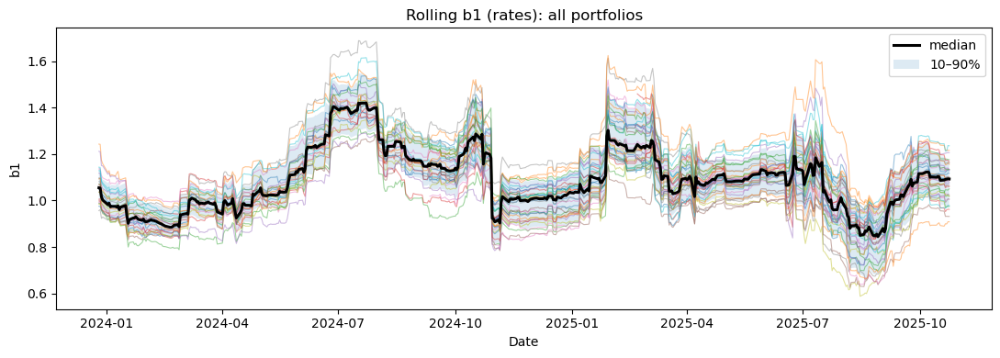

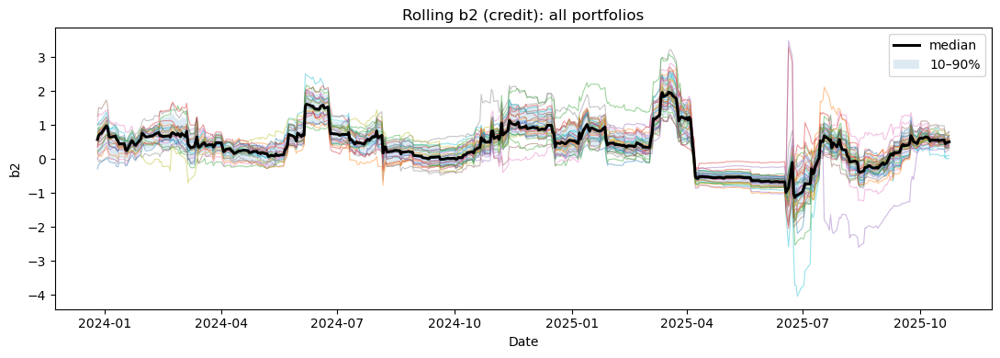

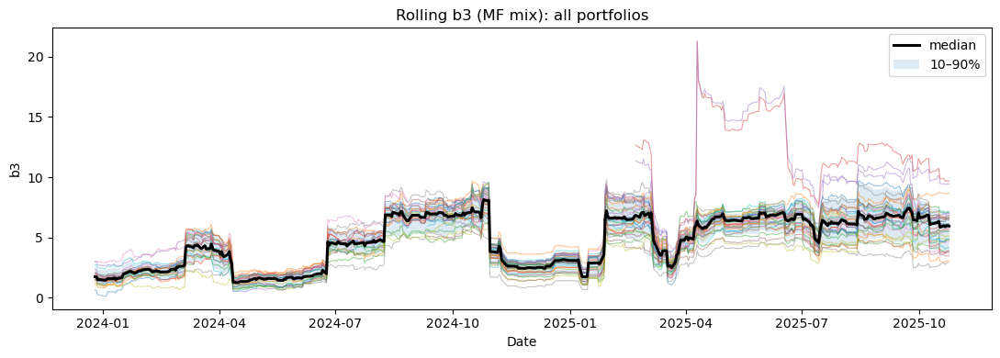

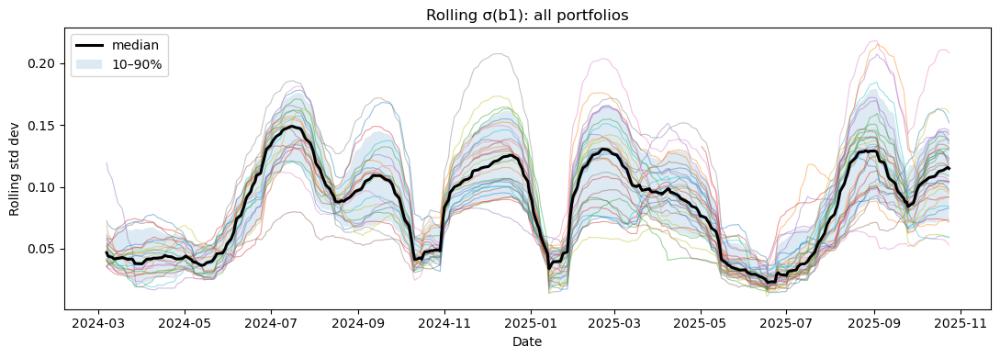

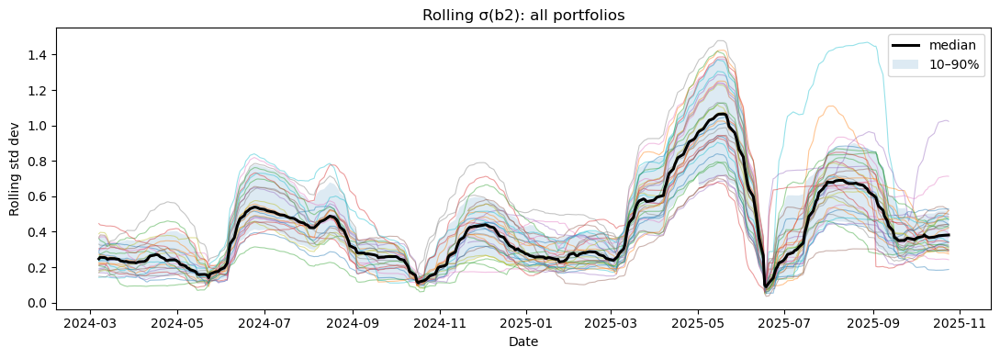

...

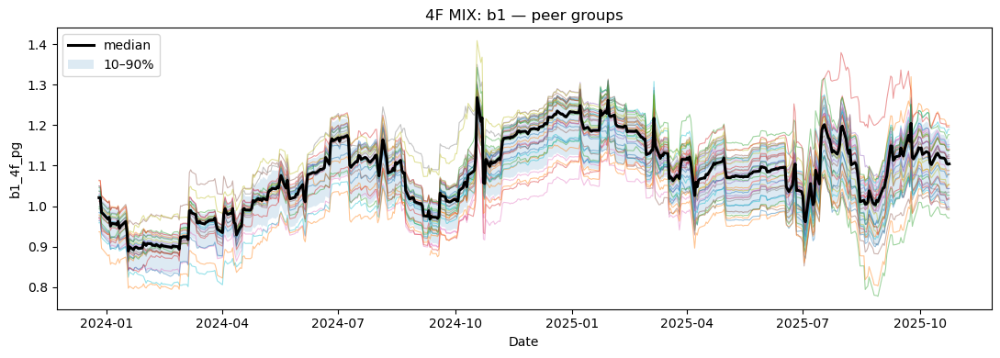

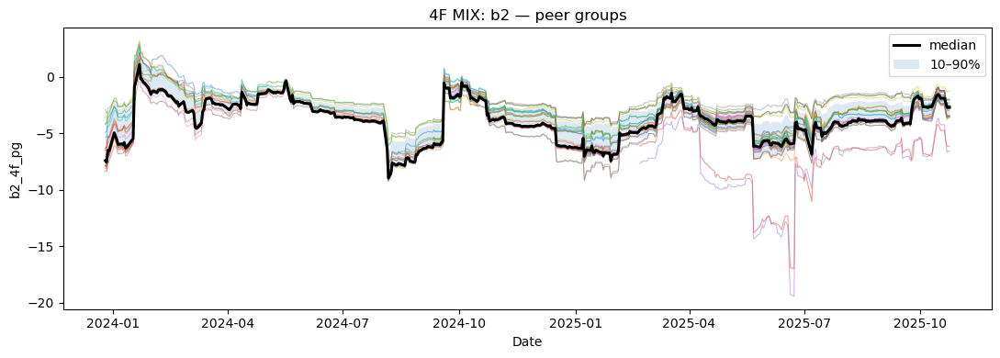

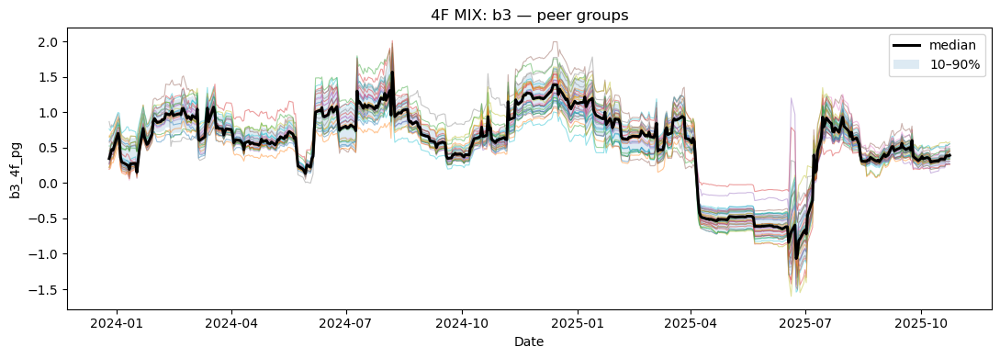

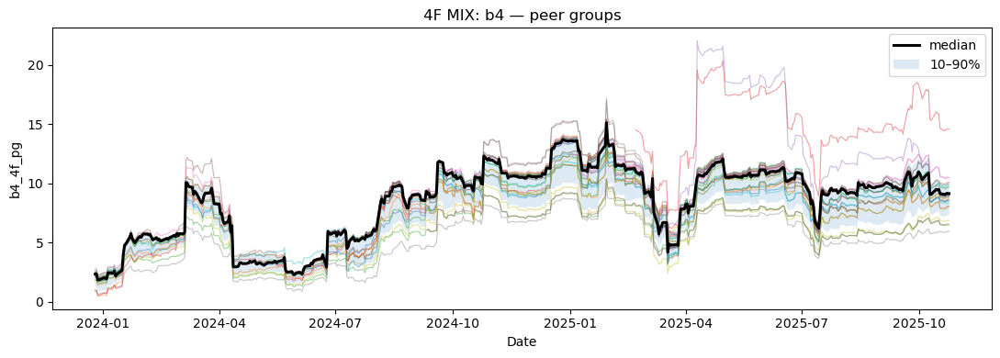

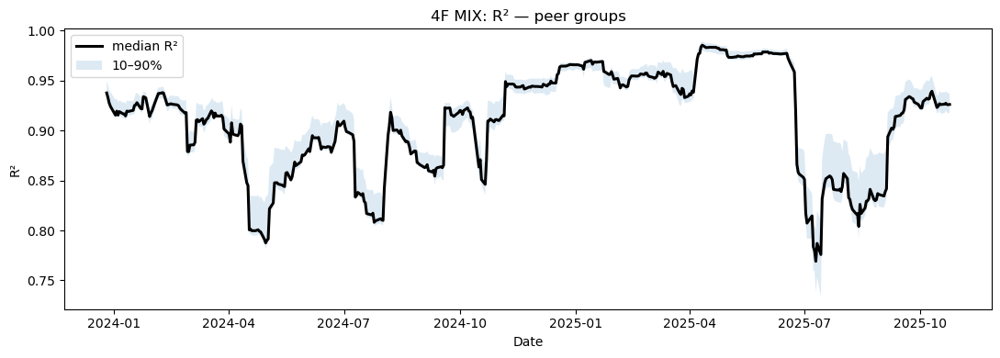

In [26]:
# =========================================================
# Full pipeline: load -> build datasets -> rolling betas -> rolling PCA -> plots
# =========================================================
import re
import math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# ------------------- Config -------------------
INPUT_XLSX = "Project.xlsx"
OUTPUT_DIR = Path("output_datasets")
OUTPUT_DIR.mkdir(exist_ok=True)
ROLL_WIN = 50            # rolling window for betas & PCA
ROLL_STD_WIN = 50        # window for rolling std dev of betas
TARGET_GROUP = "US OE Muni Single State Long"

START_DT = pd.Timestamp("2023-10-15")

# ------------------- Helpers -------------------
def _parse_date(s):
    return pd.to_datetime(s, dayfirst=True, errors="coerce")

def _norm_cols(df):
    df = df.copy()
    df.columns = (
        pd.Index(df.columns)
        .map(lambda c: "" if pd.isna(c) else str(c))
        .map(str.strip)
        .map(lambda c: re.sub(r"\s+", " ", c))
    )
    return df

def _require_columns(df, needed, ctx):
    miss = [c for c in needed if c not in df.columns]
    if miss:
        raise ValueError(f"[{ctx}] Missing columns: {miss}")

def _clean(x):  # safe header cleaner
    return "" if pd.isna(x) else str(x).strip()

def _score_as_date_col(series, sample_n=200):
    s = pd.Series(series).dropna().astype(str)
    if sample_n and len(s) > sample_n:
        s = s.iloc[:sample_n]
    parsed = pd.to_datetime(s, dayfirst=True, errors="coerce")
    return 0.0 if len(s) == 0 else float(parsed.notna().mean())

def _pick_column_for_code(code, mapping_dict):
    if code in mapping_dict:
        return mapping_dict[code]
    for k, v in mapping_dict.items():
        if not k:
            continue
        if code.endswith(k) or k.endswith(code):
            return v
    return None

# ------------------- Load sheets -------------------
with pd.ExcelFile(INPUT_XLSX) as xls:
    portfolios = pd.read_excel(xls, sheet_name="Portfolios")
    peergroups = pd.read_excel(xls, sheet_name="PeerGroups")
    mapping    = pd.read_excel(xls, sheet_name="Portfolio_peerGroup_mapping")
    oad_dts    = pd.read_excel(xls, sheet_name="OAD_DTS_YTW", header=[0, 1])  # 2-row header
    curve      = pd.read_excel(xls, sheet_name="Curve",       header=[0, 1])  # 2-row header
    housing    = pd.read_excel(xls, sheet_name="Housing_spreads")

# ------------------- Normalize & keys -------------------
portfolios = _norm_cols(portfolios)
peergroups = _norm_cols(peergroups)
mapping    = _norm_cols(mapping)
housing    = _norm_cols(housing)

portfolios["Date"] = _parse_date(portfolios["Date"])
peergroups["Date"] = _parse_date(peergroups["Date"])
mapping["Portfolio_code"] = mapping["Portfolio_code"].astype(str).str.strip()

# ------------------- 1D returns -------------------
_require_columns(portfolios, ["Date", "Portfolio", "Period", "Return"], "Portfolios")
_require_columns(peergroups, ["Date", "Portfolio", "Period", "Median_Return"], "PeerGroups")

port_ret_1d = (
    portfolios.loc[portfolios["Period"].astype(str).str.upper().eq("1D"),
                   ["Date", "Portfolio", "Return"]]
    .rename(columns={"Return": "Portfolio_Return_1D"})
    .dropna(subset=["Date"])
)
pg_ret_1d = (
    peergroups.loc[peergroups["Period"].astype(str).str.upper().eq("1D"),
                   ["Date", "Portfolio", "Median_Return"]]
    .rename(columns={"Portfolio": "PeerGroup_name", "Median_Return": "PeerGroup_Return_1D"})
    .dropna(subset=["Date"])
)

# ---------- Housing spreads ----------
# Coerce/parse the date column even if it's labeled "Row Labels", "Dates", etc.
housing = housing.copy()
housing.columns = [("" if pd.isna(c) else str(c)).strip() for c in housing.columns]
lower = {c.lower(): c for c in housing.columns}
for cand in ("Date", "Dates", "Row Labels"):
    if cand.lower() in lower:
        if lower[cand.lower()] != "Date":
            housing.rename(columns={lower[cand.lower()]: "Date"}, inplace=True)
        break
else:
    # fallback: promote the first column to Date
    housing.rename(columns={housing.columns[0]: "Date"}, inplace=True)

housing["Date"] = _parse_date(housing["Date"])

housing_cols_map = {
    "Multi-Family Private": "MF_Private_Spread",
    "Multi-Family Workforce": "MF_Workforce_Spread",
}
# tolerate small whitespace/case variations
for k in list(housing_cols_map.keys()):
    if k not in housing.columns:
        for c in housing.columns:
            if re.fullmatch(re.sub(r"\s+", r"\\s*", k), c, flags=re.IGNORECASE):
                housing_cols_map[c] = housing_cols_map.pop(k)
                break

housing_sel = ["Date"] + list(housing_cols_map.keys())
_require_columns(housing, housing_sel, "Housing_spreads")

housing_spreads = (
    housing[housing_sel]
    .rename(columns=housing_cols_map)
    .dropna(subset=["Date"])
)

# ------------------- Curve (2-row header): Date + 20Y + Spread A + Spread BBB -------------------
# Ensure MultiIndex clean
curve.columns = pd.MultiIndex.from_tuples([(_clean(a), _clean(b)) for a, b in curve.columns])
# detect Date column by content (either level may say Date/Dates)
cands = []
for col in list(curve.columns):
    score = _score_as_date_col(curve[col])
    a, b = col
    if _clean(a).lower() in {"date", "dates"} or _clean(b).lower() in {"date", "dates"}:
        score += 0.5
    cands.append((score, col))
cands.sort(key=lambda x: x[0], reverse=True)
best_col = cands[0][1] if cands else curve.columns[0]
curve_date = _parse_date(curve[best_col])

# find 20Y tenor by numeric first-level header
def _find_20y(mi_cols):
    for a, b in mi_cols:
        try:
            if abs(float(a) - 20.0) < 1e-12:
                return f"{_clean(a)}::{_clean(b)}"
        except Exception:
            pass
    # textual fallback
    rx = re.compile(r"(?:^|\b)20\s*(?:YR|YEAR|Y)?\b", flags=re.IGNORECASE)
    for a, b in mi_cols:
        if rx.search(_clean(a)) or rx.search(_clean(b)):
            return f"{_clean(a)}::{_clean(b)}"
    return None

# find Spread A/BBB from second header (exact "Spread A"/"Spread BBB"), fallback tickers if needed
def _find_spread_second(mi_cols, target):
    for a, b in mi_cols:
        if _clean(b).lower() == target.lower():
            return f"{_clean(a)}::{_clean(b)}"
    short = "A" if target.endswith("A") else "BBB"
    for a, b in mi_cols:
        if _clean(b).upper() == short:
            return f"{_clean(a)}::{_clean(b)}"
    return None

mi_cols = list(curve.columns)
curve_flat = curve.copy()
curve_flat.columns = [f"{_clean(a)}::{_clean(b)}" for (a, b) in mi_cols]
curve_flat.insert(0, "Date", curve_date)

curve_flat = _drop_holidays(curve_flat, "Date")

c20 = _find_20y(mi_cols)
sa  = _find_spread_second(mi_cols, "Spread A")
sbbb= _find_spread_second(mi_cols, "Spread BBB")
# optional ticker fallback (if your sheet uses these)
if sa is None:
    for a,b in mi_cols:
        if _clean(b) == "I13971US Index":
            sa = f"{_clean(a)}::{_clean(b)}"; break
if sbbb is None:
    for a,b in mi_cols:
        if _clean(b) == "LMB1TR Index":
            sbbb = f"{_clean(a)}::{_clean(b)}"; break

missing = [name for name,val in [("20Y",c20),("Spread A",sa),("Spread BBB",sbbb)] if val is None]
if missing:
    raise ValueError(f"[Curve] Could not find: {missing}")



# ADDED FOR 4 FACTORS
# --- Find 10Y & 30Y tenors (similar to 20Y finder) ---
def _find_tenor_from_mi(mi_cols, tenor_target):
    for a, b in mi_cols:
        try:
            if abs(float(str(a).strip()) - float(tenor_target)) < 1e-12:
                return f"{_clean(a)}::{_clean(b)}"
        except Exception:
            pass
    rx = re.compile(rf"(?:^|\b){int(tenor_target)}\s*(?:YR|YEAR|Y)?\b", flags=re.IGNORECASE)
    for a, b in mi_cols:
        if rx.search(_clean(a)) or rx.search(_clean(b)):
            return f"{_clean(a)}::{_clean(b)}"
    return None

c10 = _find_tenor_from_mi(mi_cols, 10.0)
c30 = _find_tenor_from_mi(mi_cols, 30.0)
if c10 is None or c30 is None:
    miss = []
    if c10 is None: miss.append("10Y")
    if c30 is None: miss.append("30Y")
    raise ValueError(f"[Curve] Could not find: {miss}")
c12 = _find_tenor_from_mi(mi_cols, 12.0)
if c12 is None:
    raise ValueError("[Curve] Could not find: 12Y")
###########################################

curve_sel = (
    curve_flat.loc[:, ["Date", c20, c10, c12, c30, sa, sbbb]]
    .rename(columns={c20:"CAAA20YR_BVLI", c10:"Y10", c12: "CAAA12YR_BVLI", c30:"Y30", sa:"Spread_A", sbbb:"Spread_BBB"})
    .dropna(subset=["Date"])
)

# Slope (level) and daily change
curve_sel["Slope_30_10"]   = curve_sel["Y30"] - curve_sel["Y10"]
curve_sel["d_Slope_30_10"] = curve_sel["Slope_30_10"].diff()

curve_sel["d_CAAA12YR_BVLI"] = curve_sel["CAAA12YR_BVLI"].diff()

# ------------------- OAD/DTS (2-row header -> flatten & map) -------------------
oad_dts.columns = pd.MultiIndex.from_tuples([(_clean(a), _clean(b)) for a,b in oad_dts.columns])
# detect Date col by content
cands = []
for col in list(oad_dts.columns):
    score = _score_as_date_col(oad_dts[col])
    a,b = col
    if _clean(a).lower()=="date" or _clean(b).lower()=="date":
        score += 0.5
    cands.append((score, col))
cands.sort(key=lambda x: x[0], reverse=True)
best_col = cands[0][1] if cands else oad_dts.columns[0]
date_series = _parse_date(oad_dts[best_col])

oad_dts_flat = oad_dts.copy()
oad_dts_flat.columns = [f"{_clean(a)}::{_clean(b)}" for a,b in oad_dts.columns]
oad_dts_flat.insert(0, "Date", date_series)

oad_dts_flat = _drop_holidays(oad_dts_flat, "Date")

# code -> columns
oad_map, dts_map = {}, {}
for col in oad_dts_flat.columns:
    if col == "Date": continue
    parts = col.split("::", 1)
    metric = parts[0].lower()
    id_part = parts[1] if len(parts)==2 else ""
    codes = re.findall(r"\d{3,6}", id_part)
    if not codes: continue
    code = codes[-1]
    if "oad" in metric:
        oad_map[code] = col
    if re.search(r"\b(dts|muni[_\s]*dts)\b", metric):
        dts_map[code] = col

# ------------------- Build full-history dataset per portfolio -------------------
def build_dataset_full(row):
    code  = str(row["Portfolio_code"]).strip()
    pname = str(row["Morningstar_name"]).strip()
    gname = str(row["PeerGroup_name"]).strip()

    p1 = port_ret_1d.loc[port_ret_1d["Portfolio"] == pname, ["Date","Portfolio_Return_1D"]]
    p2 = pg_ret_1d.loc[pg_ret_1d["PeerGroup_name"] == gname, ["Date","PeerGroup_Return_1D"]]

    oad_col = _pick_column_for_code(code, oad_map)
    dts_col = _pick_column_for_code(code, dts_map)
    if (oad_col is None) or (dts_col is None):
        raise KeyError(f"[OAD/DTS] Columns not found for code {code}")

    p3 = (
        oad_dts_flat.loc[:, ["Date", oad_col, dts_col]]
        .rename(columns={oad_col:"OAD", dts_col:"DTS"})
        .dropna(subset=["Date"])
    )
    p4 = housing_spreads.copy()
    p5 = curve_sel.copy()

    dfs = [p1,p2,p3,p4,p5]
    dfs_sorted = sorted(dfs, key=lambda d: d.shape[0])
    merged = dfs_sorted[0]
    for d in dfs_sorted[1:]:
        merged = merged.merge(d, on="Date", how="inner")

    merged = merged.sort_values("Date").reset_index(drop=True)
    # deltas for factors
    for base, delta in [
        ("MF_Private_Spread","d_MF_Private_Spread"),
        ("MF_Workforce_Spread","d_MF_Workforce_Spread"),
        ("CAAA20YR_BVLI","d_CAAA20YR_BVLI"),
        ("CAAA12YR_BVLI","d_CAAA12YR_BVLI"),
        ("Spread_A","d_Spread_A"),
        ("Spread_BBB","d_Spread_BBB"),
    ]:
        merged[delta] = merged[base].diff()

    merged.insert(1, "Portfolio_Name", re.sub(r"[^A-Za-z0-9._-]+","_",pname).strip("_"))
    merged.insert(2, "Portfolio_Code", code)
    merged.insert(3, "PeerGroup_Name", gname)
    return merged

datasets_full = {}
for _, row in mapping.iterrows():
    try:
        df_full = build_dataset_full(row)
        code_key = str(row["Portfolio_code"]).strip()
        datasets_full[code_key] = df_full
    except Exception as e:
        print(f"[Full] {row.get('Morningstar_name')}: {e}")

print(f"[Full] built {len(datasets_full)} / {len(mapping)} datasets")

# ------------------- Rolling multi-factor betas (50d) -------------------
def design_multifactor(df):
    d = df.sort_values("Date").copy()
    d["OAD_lag1"] = d["OAD"].shift(1)
    d["DTS_lag1"] = d["DTS"].shift(1)
    d["credit_mix"] = 0.5*(d["d_Spread_A"] + d["d_Spread_BBB"])
    d["mf_mix"]     = 0.5*(d["d_MF_Private_Spread"] + d["d_MF_Workforce_Spread"])
    d["x1"] = - d["OAD_lag1"] * d["d_CAAA20YR_BVLI"]
    d["x2"] = - d["DTS_lag1"] * d["credit_mix"]
    d["x3"] = - d["mf_mix"]
    return d


############### MULTI FACTOR USING PCT CHANGE
EPS = 1e-6  # to avoid division blow-ups on tiny denominators

def _pct_change(curr, prev, eps=EPS):
    denom = np.where(np.abs(prev) < eps, eps, prev)
    return (curr - prev) / denom

def design_multifactor_pct(df):
    d = df.sort_values("Date").copy()
    # lags for scaling
    d["OAD_lag1"] = d["OAD"].shift(1)
    d["DTS_lag1"] = d["DTS"].shift(1)

    # build lagged levels for %Δ denominators
    d["CAAA20YR_BVLI_lag1"]       = d["CAAA20YR_BVLI"].shift(1)
    d["Spread_A_lag1"]            = d["Spread_A"].shift(1)
    d["Spread_BBB_lag1"]          = d["Spread_BBB"].shift(1)
    d["MF_Private_Spread_lag1"]   = d["MF_Private_Spread"].shift(1)
    d["MF_Workforce_Spread_lag1"] = d["MF_Workforce_Spread"].shift(1)

    # % changes
    d["pc_CAAA20YR_BVLI"]       = _pct_change(d["CAAA20YR_BVLI"],       d["CAAA20YR_BVLI_lag1"])
    d["pc_Spread_A"]            = _pct_change(d["Spread_A"],            d["Spread_A_lag1"])
    d["pc_Spread_BBB"]          = _pct_change(d["Spread_BBB"],          d["Spread_BBB_lag1"])
    d["pc_MF_Private_Spread"]   = _pct_change(d["MF_Private_Spread"],   d["MF_Private_Spread_lag1"])
    d["pc_MF_Workforce_Spread"] = _pct_change(d["MF_Workforce_Spread"], d["MF_Workforce_Spread_lag1"])

    # mixes
    d["pc_credit_mix"] = 0.5 * (d["pc_Spread_A"] + d["pc_Spread_BBB"])
    d["pc_mf_mix"]     = 0.5 * (d["pc_MF_Private_Spread"] + d["pc_MF_Workforce_Spread"])

    # regressors
    d["x1_pct"] = - d["OAD_lag1"] * d["pc_CAAA20YR_BVLI"]
    d["x2_pct"] = - d["DTS_lag1"] * d["pc_credit_mix"]
    d["x3_pct"] = - d["pc_mf_mix"]
    return d
################################################################

############### MULTI FACTOR USING PCT CHANGE
def design_multifactor_mix(df):
    d = df.sort_values("Date").copy()
    # lags for scaling
    d["OAD_lag1"] = d["OAD"].shift(1)
    d["DTS_lag1"] = d["DTS"].shift(1)

    # build lagged levels for %Δ denominators
    # d["CAAA20YR_BVLI_lag1"]       = d["CAAA20YR_BVLI"].shift(1)
    d["Spread_A_lag1"]            = d["Spread_A"].shift(1)
    d["Spread_BBB_lag1"]          = d["Spread_BBB"].shift(1)
    d["MF_Private_Spread_lag1"]   = d["MF_Private_Spread"].shift(1)
    d["MF_Workforce_Spread_lag1"] = d["MF_Workforce_Spread"].shift(1)

    # % changes
    # d["pc_CAAA20YR_BVLI"]       = _pct_change(d["CAAA20YR_BVLI"],       d["CAAA20YR_BVLI_lag1"])
    d["pc_Spread_A"]            = _pct_change(d["Spread_A"],            d["Spread_A_lag1"])
    d["pc_Spread_BBB"]          = _pct_change(d["Spread_BBB"],          d["Spread_BBB_lag1"])
    d["pc_MF_Private_Spread"]   = _pct_change(d["MF_Private_Spread"],   d["MF_Private_Spread_lag1"])
    d["pc_MF_Workforce_Spread"] = _pct_change(d["MF_Workforce_Spread"], d["MF_Workforce_Spread_lag1"])

    # mixes
    d["pc_credit_mix"] = 0.5 * (d["pc_Spread_A"] + d["pc_Spread_BBB"])
    d["pc_mf_mix"]     = 0.5 * (d["pc_MF_Private_Spread"] + d["pc_MF_Workforce_Spread"])

    # regressors
    d["x1_mix"] = - d["OAD_lag1"] * d["d_CAAA20YR_BVLI"]
    d["x2_mix"] = - d["DTS_lag1"] * d["pc_credit_mix"]
    d["x3_mix"] = - d["pc_mf_mix"]
    return d
################################################################

############### 4 FACTOR
def design_multifactor_4f_mix(df):
    d = df.sort_values("Date").copy()

    # lags for scaling
    d["OAD_lag1"] = d["OAD"].shift(1)
    d["DTS_lag1"] = d["DTS"].shift(1)

    # percent-change denominators
    d["Spread_A_lag1"]            = d["Spread_A"].shift(1)
    d["Spread_BBB_lag1"]          = d["Spread_BBB"].shift(1)
    d["MF_Private_Spread_lag1"]   = d["MF_Private_Spread"].shift(1)
    d["MF_Workforce_Spread_lag1"] = d["MF_Workforce_Spread"].shift(1)

    # % changes
    d["pc_Spread_A"]            = _pct_change(d["Spread_A"],            d["Spread_A_lag1"])
    d["pc_Spread_BBB"]          = _pct_change(d["Spread_BBB"],          d["Spread_BBB_lag1"])
    d["pc_MF_Private_Spread"]   = _pct_change(d["MF_Private_Spread"],   d["MF_Private_Spread_lag1"])
    d["pc_MF_Workforce_Spread"] = _pct_change(d["MF_Workforce_Spread"], d["MF_Workforce_Spread_lag1"])

    # mixes
    d["pc_credit_mix"] = 0.5 * (d["pc_Spread_A"] + d["pc_Spread_BBB"])
    d["pc_mf_mix"]     = 0.5 * (d["pc_MF_Private_Spread"] + d["pc_MF_Workforce_Spread"])

    # regressors per spec
    # d["x1_rate"]        = - d["OAD_lag1"] * d["d_CAAA20YR_BVLI"]
    d["x1_rate"]        = - d["OAD_lag1"] * d["d_CAAA12YR_BVLI"]
    d["x2_slope"]       = d["d_Slope_30_10"]            # simple diff of slope
    d["x3_credit_pct"]  = - d["DTS_lag1"] * d["pc_credit_mix"]
    d["x4_mf_pct"]      = - d["pc_mf_mix"]

    # # --- override x4 on the specified dates ---
    # override_dates = pd.to_datetime(["2024-10-30", "2024-11-08"])
    # m = d["Date"].isin(override_dates)
    # # set x4 equal to pc_MF_Workforce_Spread (no minus sign, per your request)
    # d.loc[m, "x4_mf_pct"] = d.loc[m, "pc_MF_Workforce_Spread"]

    # Normalize Date to pure date (no time)
    d["Date"] = pd.to_datetime(d["Date"]).dt.normalize()

    # Dates that should use the negative of Workforce Spread
    _override_neg = {
        pd.Timestamp("2024-10-30"),
        pd.Timestamp("2024-11-08"),
        pd.Timestamp("2024-11-12"),
    }

    mask_neg = d["Date"].isin(_override_neg)

    if "pc_MF_Workforce_Spread" in d.columns:
        d.loc[mask_neg, "x4_mf_pct"] = -d.loc[mask_neg, "pc_MF_Workforce_Spread"]

    return d
################################################################

def window_ols(y, X):   # returns (b0,b1,b2,b3,r2)
    Xmat = np.column_stack([np.ones(len(X)), X])
    coef, _, _, _ = np.linalg.lstsq(Xmat, y, rcond=None)
    yhat = Xmat @ coef
    ss_res = float(np.sum((y - yhat)**2))
    ss_tot = float(np.sum((y - y.mean())**2))
    r2 = 1.0 - ss_res/ss_tot if ss_tot > 0 else np.nan
    return (*coef, r2)

def rolling_multifactor(df_full, win=ROLL_WIN):
    d = design_multifactor(df_full)
    d = d[["Date","Portfolio_Return_1D","x1","x2","x3"]].dropna().reset_index(drop=True)

    d = d[d["Date"] >= START_DT].reset_index(drop=True)

    if len(d) < win:
        return pd.DataFrame(columns=["Date","b0","b1","b2","b3","r2"])
    rows = []
    for i in range(win, len(d)+1):
        sl = d.iloc[i-win:i]
        y = sl["Portfolio_Return_1D"].to_numpy(dtype=float)
        X = sl[["x1","x2","x3"]].to_numpy(dtype=float)
        b0,b1,b2,b3,r2 = window_ols(y, X)
        rows.append({"Date": sl["Date"].iloc[-1], "b0":b0,"b1":b1,"b2":b2,"b3":b3,"r2":r2})
    return pd.DataFrame(rows)


############### MULTI FACTOR USING PCT CHANGE
def rolling_multifactor_pct(df_full, win=ROLL_WIN):
    d = design_multifactor_pct(df_full)
    d = d[["Date","Portfolio_Return_1D","x1_pct","x2_pct","x3_pct"]].dropna().reset_index(drop=True)

    # Optional: restrict to 2024+
    d = d[d["Date"] >= START_DT].reset_index(drop=True)

    if len(d) < win:
        return pd.DataFrame(columns=["Date","b0","b1","b2","b3","r2"])
    rows = []
    for i in range(win, len(d)+1):
        sl = d.iloc[i-win:i]
        y = sl["Portfolio_Return_1D"].to_numpy(dtype=float)
        X = sl[["x1_pct","x2_pct","x3_pct"]].to_numpy(dtype=float)
        b0,b1,b2,b3,r2 = window_ols(y, X)
        rows.append({"Date": sl["Date"].iloc[-1], "b0":b0,"b1":b1,"b2":b2,"b3":b3,"r2":r2})
    return pd.DataFrame(rows)
################################################################


# ------------- MULTI-FACTOR (MIXED): x1 = Δ, x2 = %Δ, x3 = %Δ -------------
def rolling_multifactor_mix(df_full, win=ROLL_WIN):
    d = design_multifactor_mix(df_full)
    d = d[["Date","Portfolio_Return_1D","x1_mix","x2_mix","x3_mix"]].dropna().reset_index(drop=True)

    # Optional: restrict to 2024+
    d = d[d["Date"] >= START_DT].reset_index(drop=True)

    if len(d) < win:
        return pd.DataFrame(columns=["Date","b0","b1","b2","b3","r2"])
    rows = []
    for i in range(win, len(d)+1):
        sl = d.iloc[i-win:i]
        y = sl["Portfolio_Return_1D"].to_numpy(dtype=float)
        X = sl[["x1_mix","x2_mix","x3_mix"]].to_numpy(dtype=float)
        b0,b1,b2,b3,r2 = window_ols(y, X)
        rows.append({"Date": sl["Date"].iloc[-1], "b0":b0,"b1":b1,"b2":b2,"b3":b3,"r2":r2})
    return pd.DataFrame(rows)
################################################################

# ------------- MULTI-FACTOR (MIXED): x1 = Δ, x2 = %Δ, x3 = %Δ - PEER -------------
def rolling_multifactor_mix_pg(df_full, win=ROLL_WIN):
    d = design_multifactor_mix(df_full)
    d = d[["Date","PeerGroup_Return_1D","x1_mix","x2_mix","x3_mix"]].dropna().reset_index(drop=True)
    d = d[d["Date"] >= START_DT].reset_index(drop=True)
    if len(d) < win:
        return pd.DataFrame(columns=["Date","b0","b1","b2","b3","r2"])
    rows = []
    for i in range(win, len(d)+1):
        sl = d.iloc[i-win:i]
        y = sl["PeerGroup_Return_1D"].to_numpy(dtype=float)
        X = sl[["x1_mix","x2_mix","x3_mix"]].to_numpy(dtype=float)
        b0,b1,b2,b3,r2 = window_ols(y, X)
        rows.append({"Date": sl["Date"].iloc[-1], "b0":b0,"b1":b1,"b2":b2,"b3":b3,"r2":r2})
    return pd.DataFrame(rows)
################################################################

# ------------- 4-FACTOR (MIXED): x1 = Δ, x3 = %Δ, x4 = %Δ -------------
def rolling_multifactor_4f_mix_port(df_full, win=ROLL_WIN):
    d = design_multifactor_4f_mix(df_full)
    d = d[["Date","Portfolio_Return_1D","x1_rate","x2_slope","x3_credit_pct","x4_mf_pct"]].dropna().reset_index(drop=True)
    d = d[d["Date"] >= START_DT].reset_index(drop=True)
    if len(d) < win:
        return pd.DataFrame(columns=["Date","b0","b1","b2","b3","b4","r2"])
    rows = []
    for i in range(win, len(d)+1):
        sl = d.iloc[i-win:i]
        y = sl["Portfolio_Return_1D"].to_numpy(float)
        X = sl[["x1_rate","x2_slope","x3_credit_pct","x4_mf_pct"]].to_numpy(float)
        # X = sl[["x1_rate12","x2_slope","x3_credit_pct","x4_mf_pct"]].to_numpy(float)
        b0,b1,b2,b3,r2_tmp = window_ols(y, X[:, :3])  # placeholder to reuse; we need 4 betas
        # Recompute with 4 columns (can’t reuse window_ols signature). Do full OLS here:
        Xmat = np.column_stack([np.ones(len(X)), X])
        coef, _, _, _ = np.linalg.lstsq(Xmat, y, rcond=None)
        yhat = Xmat @ coef
        ss_res = float(np.sum((y - yhat)**2))
        ss_tot = float(np.sum((y - y.mean())**2))
        r2 = 1.0 - ss_res/ss_tot if ss_tot > 0 else np.nan
        rows.append({"Date": sl["Date"].iloc[-1],
                     "b0": coef[0], "b1": coef[1], "b2": coef[2], "b3": coef[3], "b4": coef[4],
                     "r2": r2})
    return pd.DataFrame(rows)

def rolling_multifactor_4f_mix_pg(df_full, win=ROLL_WIN):
    d = design_multifactor_4f_mix(df_full)
    d = d[["Date","PeerGroup_Return_1D","x1_rate","x2_slope","x3_credit_pct","x4_mf_pct"]].dropna().reset_index(drop=True)
    d = d[d["Date"] >= START_DT].reset_index(drop=True)
    if len(d) < win:
        return pd.DataFrame(columns=["Date","b0","b1","b2","b3","b4","r2"])
    rows = []
    for i in range(win, len(d)+1):
        sl = d.iloc[i-win:i]
        y = sl["PeerGroup_Return_1D"].to_numpy(float)
        X = sl[["x1_rate","x2_slope","x3_credit_pct","x4_mf_pct"]].to_numpy(float)
        # X = sl[["x1_rate12","x2_slope","x3_credit_pct","x4_mf_pct"]].to_numpy(float)
        Xmat = np.column_stack([np.ones(len(X)), X])
        coef, _, _, _ = np.linalg.lstsq(Xmat, y, rcond=None)
        yhat = Xmat @ coef
        ss_res = float(np.sum((y - yhat)**2))
        ss_tot = float(np.sum((y - y.mean())**2))
        r2 = 1.0 - ss_res/ss_tot if ss_tot > 0 else np.nan
        rows.append({"Date": sl["Date"].iloc[-1],
                     "b0": coef[0], "b1": coef[1], "b2": coef[2], "b3": coef[3], "b4": coef[4],
                     "r2": r2})
    return pd.DataFrame(rows)
################################################################

rolling_beta_panels = {}   # code -> DataFrame(Date, b0..b3, r2)
for code, df in datasets_full.items():
    try:
        rolling_beta_panels[code] = rolling_multifactor(df, win=ROLL_WIN)
    except Exception as e:
        print(f"[Roll] {code}: {e}")

# ------------------- Wide panels + rolling std -------------------
def _wide_from_panels(panels, col, allowed_codes=None):
    mats = []
    for code, rb in panels.items():
        if allowed_codes is not None and code not in allowed_codes:
            continue
        if col in rb.columns and len(rb):
            mats.append(rb[["Date", col]].set_index("Date").rename(columns={col: code}))
    if not mats:
        return pd.DataFrame()
    return pd.concat(mats, axis=1).sort_index().dropna(how="all")

def _rolling_std(wide_df, win=ROLL_STD_WIN):
    if wide_df.empty:
        return wide_df
    return wide_df.rolling(win, min_periods=win).std()

# All portfolios
wide_b1 = _wide_from_panels(rolling_beta_panels, "b1")
wide_b2 = _wide_from_panels(rolling_beta_panels, "b2")
wide_b3 = _wide_from_panels(rolling_beta_panels, "b3")
rollstd_b1 = _rolling_std(wide_b1, ROLL_STD_WIN)
rollstd_b2 = _rolling_std(wide_b2, ROLL_STD_WIN)
rollstd_b3 = _rolling_std(wide_b3, ROLL_STD_WIN)

# R² wide (for stability plot)
wide_r2 = _wide_from_panels(rolling_beta_panels, "r2")

# Peer-group = Single State Long (combined view)
group_map = (
    mapping.assign(Portfolio_code=mapping["Portfolio_code"].astype(str).str.strip(),
                   PeerGroup_name=mapping["PeerGroup_name"].astype(str).str.strip())
            .set_index("Portfolio_code")["PeerGroup_name"].to_dict()
)
# codes_in_group = {code for code in rolling_beta_panels if group_map.get(str(code), "") == TARGET_GROUP}
# wide_b1_pg = _wide_from_panels(rolling_beta_panels, "b1", allowed_codes=codes_in_group)
# wide_b2_pg = _wide_from_panels(rolling_beta_panels, "b2", allowed_codes=codes_in_group)
# wide_b3_pg = _wide_from_panels(rolling_beta_panels, "b3", allowed_codes=codes_in_group)



############### MULTI FACTOR USING PCT CHANGE
# --- Build rolling panels for %Δ-based regressors ---
rolling_beta_panels_pct = {}
for code, df in datasets_full.items():
    try:
        rolling_beta_panels_pct[code] = rolling_multifactor_pct(df, win=ROLL_WIN)
    except Exception as e:
        print(f"[Roll %] {code}: {e}")

# --- Wide matrices (percent-change betas) ---
wide_b1_pct = _wide_from_panels(rolling_beta_panels_pct, "b1")
wide_b2_pct = _wide_from_panels(rolling_beta_panels_pct, "b2")
wide_b3_pct = _wide_from_panels(rolling_beta_panels_pct, "b3")
wide_r2_pct = _wide_from_panels(rolling_beta_panels_pct, "r2")

# Optional: group subset too
# wide_b1_pg_pct = _wide_from_panels(rolling_beta_panels_pct, "b1", allowed_codes=codes_in_group)
# wide_b2_pg_pct = _wide_from_panels(rolling_beta_panels_pct, "b2", allowed_codes=codes_in_group)
# wide_b3_pg_pct = _wide_from_panels(rolling_beta_panels_pct, "b3", allowed_codes=codes_in_group)
################################################################



############### MULTI FACTOR USING MIX PCT CHANGE
# --- Build rolling panels for %Δ-based regressors ---
rolling_beta_panels_mix = {}
for code, df in datasets_full.items():
    try:
        rolling_beta_panels_mix[code] = rolling_multifactor_mix(df, win=ROLL_WIN)
    except Exception as e:
        print(f"[Roll %] {code}: {e}")

# --- Wide matrices (percent-change betas) ---
wide_b1_mix = _wide_from_panels(rolling_beta_panels_mix, "b1")
wide_b2_mix = _wide_from_panels(rolling_beta_panels_mix, "b2")
wide_b3_mix = _wide_from_panels(rolling_beta_panels_mix, "b3")
wide_r2_mix = _wide_from_panels(rolling_beta_panels_mix, "r2")

# Optional: group subset too
# wide_b1_pg_mix = _wide_from_panels(rolling_beta_panels_mix, "b1", allowed_codes=codes_in_group)
# wide_b2_pg_mix = _wide_from_panels(rolling_beta_panels_mix, "b2", allowed_codes=codes_in_group)
# wide_b3_pg_mix = _wide_from_panels(rolling_beta_panels_mix, "b3", allowed_codes=codes_in_group)
################################################################



############### MULTI FACTOR USING MIX PCT CHANGE - PEER
rolling_beta_panels_mix_pg = {}
for code, df in datasets_full.items():
    try:
        rolling_beta_panels_mix_pg[code] = rolling_multifactor_mix_pg(df, win=ROLL_WIN)
    except Exception as e:
        print(f"[Roll mix PG] {code}: {e}")
wide_b1_mix_pg = _wide_from_panels(rolling_beta_panels_mix_pg, "b1")
wide_b2_mix_pg = _wide_from_panels(rolling_beta_panels_mix_pg, "b2")
wide_b3_mix_pg = _wide_from_panels(rolling_beta_panels_mix_pg, "b3")
wide_r2_mix_pg = _wide_from_panels(rolling_beta_panels_mix_pg, "r2")
################################################################



############### 4 FACTOR USING 
# --- 4-factor MIX (portfolio target) ---
rolling_beta_panels_4f = {}
for code, df in datasets_full.items():
    try:
        rolling_beta_panels_4f[code] = rolling_multifactor_4f_mix_port(df, win=ROLL_WIN)
    except Exception as e:
        print(f"[Roll 4F] {code}: {e}")

wide_b1_4f = _wide_from_panels(rolling_beta_panels_4f, "b1")
wide_b2_4f = _wide_from_panels(rolling_beta_panels_4f, "b2")
wide_b3_4f = _wide_from_panels(rolling_beta_panels_4f, "b3")
wide_b4_4f = _wide_from_panels(rolling_beta_panels_4f, "b4")
wide_r2_4f = _wide_from_panels(rolling_beta_panels_4f, "r2")

# optional stdev bands
rollstd_b1_4f = _rolling_std(wide_b1_4f, ROLL_STD_WIN)
rollstd_b2_4f = _rolling_std(wide_b2_4f, ROLL_STD_WIN)
rollstd_b3_4f = _rolling_std(wide_b3_4f, ROLL_STD_WIN)
rollstd_b4_4f = _rolling_std(wide_b4_4f, ROLL_STD_WIN)

# --- 4-factor MIX (peer group target) ---
rolling_beta_panels_4f_pg = {}
for code, df in datasets_full.items():
    try:
        rolling_beta_panels_4f_pg[code] = rolling_multifactor_4f_mix_pg(df, win=ROLL_WIN)
    except Exception as e:
        print(f"[Roll 4F PG] {code}: {e}")

wide_b1_4f_pg = _wide_from_panels(rolling_beta_panels_4f_pg, "b1")
wide_b2_4f_pg = _wide_from_panels(rolling_beta_panels_4f_pg, "b2")
wide_b3_4f_pg = _wide_from_panels(rolling_beta_panels_4f_pg, "b3")
wide_b4_4f_pg = _wide_from_panels(rolling_beta_panels_4f_pg, "b4")
wide_r2_4f_pg = _wide_from_panels(rolling_beta_panels_4f_pg, "r2")

################################################################




# ------------------- Rolling PCA (50d) on ΔY across maturities -------------------
# Extract tenor yields from curve (first-level numeric = tenor)
def extract_maturity_yields(curve_mi, date_series):
    cols = []
    for a,b in curve_mi.columns:
        try:
            tenor = float(str(a).strip())
            cols.append((a,b,str(tenor)))
        except Exception:
            pass
    if not cols:
        raise ValueError("No numeric tenor columns found in Curve.")
    out = pd.DataFrame({"Date": date_series})
    for a,b,colname in cols:
        out[colname] = curve_mi[(a,b)].values
    return out.dropna(subset=["Date"]).sort_values("Date").reset_index(drop=True)

yields_by_tenor = extract_maturity_yields(curve, curve_date)
dy = yields_by_tenor.copy()
tenor_cols = [c for c in dy.columns if c != "Date"]
for c in tenor_cols: dy[c] = dy[c].diff()
dy = dy.dropna().reset_index(drop=True)

dy = dy[dy["Date"] >= START_DT].reset_index(drop=True)

def rolling_pca_explained(dy_df, tenors, win=ROLL_WIN):
    if len(dy_df) < win:
        return pd.DataFrame(columns=["Date","PC1_var","PC2_var","PC3_var"])    
    rows = []
    Xall = dy_df[tenors].to_numpy(float)
    dates = dy_df["Date"].to_list()
    for i in range(win, len(dy_df)+1):
        Xw = Xall[i-win:i]
        Xw_mc = Xw - Xw.mean(axis=0, keepdims=True)  # mean-centered, no z-score
        p = PCA(n_components=3).fit(Xw_mc)
        rows.append({
            "Date": dates[i-1],
            "PC1_var": p.explained_variance_ratio_[0],
            "PC2_var": p.explained_variance_ratio_[1],
            "PC3_var": p.explained_variance_ratio_[2],
        })
    return pd.DataFrame(rows)

rolling_pca_var = rolling_pca_explained(dy, tenor_cols, win=ROLL_WIN)

# ------------------- Plot helpers -------------------
def _plot_many_lines(wide_df, title, ylabel=None, show_median=True, band=True):
    if wide_df.empty:
        print(f"[plot] {title}: nothing to plot"); return
    fig, ax = plt.subplots(figsize=(11, 4))
    for col in wide_df.columns:
        ax.plot(wide_df.index, wide_df[col].values, lw=0.8, alpha=0.45)
    if show_median:
        med = wide_df.median(axis=1)
        ax.plot(med.index, med.values, lw=2.2, color="black", label="median")
        if band:
            p10 = wide_df.quantile(0.10, axis=1)
            p90 = wide_df.quantile(0.90, axis=1)
            ax.fill_between(med.index, p10.values, p90.values, alpha=0.15, label="10–90%")
    ax.set_title(title); ax.set_xlabel("Date")
    if ylabel: ax.set_ylabel(ylabel)
    if show_median: ax.legend()
    plt.tight_layout(); plt.show()

def _plot_stability_r2(wide_r2_df, title="Rolling model stability: R² (median + 10–90%)"):
    if wide_r2_df.empty:
        print(f"[plot] {title}: nothing to plot"); return
    med = wide_r2_df.median(axis=1)
    p10 = wide_r2_df.quantile(0.10, axis=1)
    p90 = wide_r2_df.quantile(0.90, axis=1)
    fig, ax = plt.subplots(figsize=(11, 4))
    ax.plot(med.index, med.values, lw=2.2, color="black", label="median R²")
    ax.fill_between(med.index, p10.values, p90.values, alpha=0.15, label="10–90%")
    ax.set_title(title); ax.set_xlabel("Date"); ax.set_ylabel("R²")
    ax.legend(); plt.tight_layout(); plt.show()

def _plot_rolling_pca_var(df_var):
    if df_var is None or df_var.empty:
        print("[plot] Rolling PCA: nothing to plot"); return
    fig, ax = plt.subplots(figsize=(11, 4))
    ax.plot(df_var["Date"], df_var["PC1_var"], label="PC1")
    ax.plot(df_var["Date"], df_var["PC2_var"], label="PC2")
    ax.plot(df_var["Date"], df_var["PC3_var"], label="PC3")
    ax.set_title(f"Rolling PCA (window={ROLL_WIN}) – EVR PC1–PC3")
    ax.set_xlabel("Date"); ax.set_ylabel("Explained variance ratio")
    ax.legend(); plt.tight_layout(); plt.show()

# ------------------- PLOTS (the 11 charts) -------------------
# 1–3) Rolling b1/b2/b3: all portfolios
_plot_many_lines(wide_b1, "Rolling b1 (rates): all portfolios", ylabel="b1")
_plot_many_lines(wide_b2, "Rolling b2 (credit): all portfolios", ylabel="b2")
_plot_many_lines(wide_b3, "Rolling b3 (MF mix): all portfolios", ylabel="b3")

# 4–6) Rolling b1/b2/b3: group = Single State Long (all lines + median + band)
# _plot_many_lines(wide_b1_pg, f"Rolling b1 (rates): group = {TARGET_GROUP}", ylabel="b1")
# _plot_many_lines(wide_b2_pg, f"Rolling b2 (credit): group = {TARGET_GROUP}", ylabel="b2")
# _plot_many_lines(wide_b3_pg, f"Rolling b3 (MF mix): group = {TARGET_GROUP}", ylabel="b3")

# 7–9) Rolling σ(b1/b2/b3): all portfolios
_plot_many_lines(rollstd_b1, "Rolling σ(b1): all portfolios", ylabel="Rolling std dev")
_plot_many_lines(rollstd_b2, "Rolling σ(b2): all portfolios", ylabel="Rolling std dev")
_plot_many_lines(rollstd_b3, "Rolling σ(b3): all portfolios", ylabel="Rolling std dev")

# 10) Rolling model stability: R² (median + 10–90%)
_plot_stability_r2(wide_r2)

# 11) Rolling PCA EVR (PC1–PC3)
_plot_rolling_pca_var(rolling_pca_var)




_plot_many_lines(wide_b1_pct, "Rolling b1 (rates, %Δ factors): all portfolios", ylabel="b1_pct")
_plot_many_lines(wide_b2_pct, "Rolling b2 (credit, %Δ factors): all portfolios", ylabel="b2_pct")
_plot_many_lines(wide_b3_pct, "Rolling b3 (MF mix, %Δ factors): all portfolios", ylabel="b3_pct")

# _plot_many_lines(wide_b1_pg_pct, f"Rolling b1 (rates, %Δ) group = {TARGET_GROUP}", ylabel="b1_pct")
# _plot_many_lines(wide_b2_pg_pct, f"Rolling b2 (credit, %Δ) group = {TARGET_GROUP}", ylabel="b2_pct")
# _plot_many_lines(wide_b3_pg_pct, f"Rolling b3 (MF mix, %Δ) group = {TARGET_GROUP}", ylabel="b3_pct")

_plot_stability_r2(wide_r2_pct, title="Rolling model stability: R² (percent-change factors)")






_plot_many_lines(wide_b1_mix,    "Rolling b1 (rates, MIX: x1 Δ, x2%Δ, x3%Δ): portfolios", ylabel="b1_mix")
_plot_many_lines(wide_b2_mix,    "Rolling b2 (credit, MIX): portfolios",                  ylabel="b2_mix")
_plot_many_lines(wide_b3_mix,    "Rolling b3 (MF mix, MIX): portfolios",                  ylabel="b3_mix")
_plot_stability_r2(wide_r2_mix,  title="Rolling model stability (MIX): R² – portfolios")

# NEW — peer group target
_plot_many_lines(wide_b1_mix_pg,   "Rolling b1 (rates, MIX): peer groups", ylabel="b1_mix_pg")
_plot_many_lines(wide_b2_mix_pg,   "Rolling b2 (credit, MIX): peer groups", ylabel="b2_mix_pg")
_plot_many_lines(wide_b3_mix_pg,   "Rolling b3 (MF mix, MIX): peer groups", ylabel="b3_mix_pg")
_plot_stability_r2(wide_r2_mix_pg, title="Rolling model stability (MIX): R² – peer groups")





# ---- 4-factor MIX (portfolio) ----
_plot_many_lines(wide_b1_4f, "4F MIX: b1 (Δrate * OAD_lag) — portfolios", ylabel="b1_4f")
_plot_many_lines(wide_b2_4f, "4F MIX: b2 (Δ slope 30–10) — portfolios",   ylabel="b2_4f")
_plot_many_lines(wide_b3_4f, "4F MIX: b3 (%Δ credit * DTS_lag) — portfolios", ylabel="b3_4f")
_plot_many_lines(wide_b4_4f, "4F MIX: b4 (%Δ MF mix) — portfolios",       ylabel="b4_4f")
_plot_stability_r2(wide_r2_4f, title="4F MIX: R² — portfolios")

# ---- 4-factor MIX (peer groups) ----
_plot_many_lines(wide_b1_4f_pg, "4F MIX: b1 — peer groups", ylabel="b1_4f_pg")
_plot_many_lines(wide_b2_4f_pg, "4F MIX: b2 — peer groups", ylabel="b2_4f_pg")
_plot_many_lines(wide_b3_4f_pg, "4F MIX: b3 — peer groups", ylabel="b3_4f_pg")
_plot_many_lines(wide_b4_4f_pg, "4F MIX: b4 — peer groups", ylabel="b4_4f_pg")
_plot_stability_r2(wide_r2_4f_pg, title="4F MIX: R² — peer groups")


**_2 sampe bawah sini** 

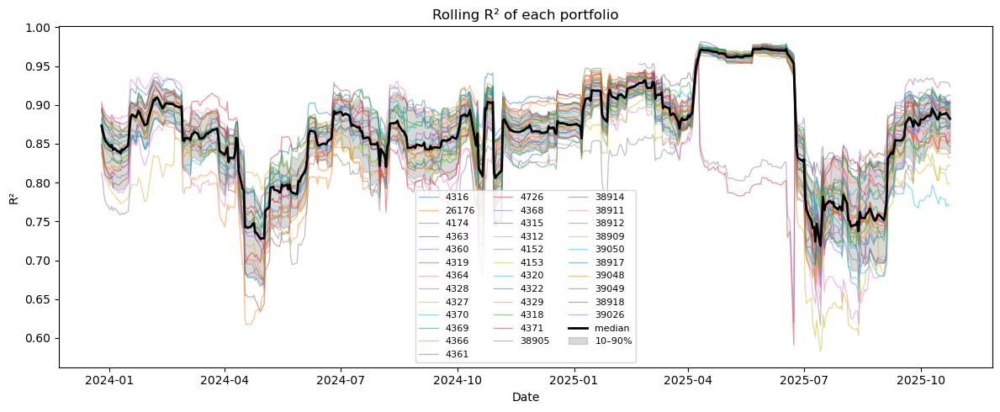

In [27]:
import matplotlib.pyplot as plt

# choose which panel set to use (percent-change, mix, etc.)
panels = rolling_beta_panels_pct  # or rolling_beta_panels_mix

# Build a combined R² DataFrame
r2_wide = _wide_from_panels(panels, "r2")

# Plot all R² lines (like your b1/b2/b3 plots)
fig, ax = plt.subplots(figsize=(12,5))
for code in r2_wide.columns:
    ax.plot(r2_wide.index, r2_wide[code], lw=0.9, alpha=0.5, label=str(code))

# Highlight median + band
median_r2 = r2_wide.median(axis=1)
ax.plot(median_r2.index, median_r2, lw=2.0, color="black", label="median")
ax.fill_between(
    median_r2.index,
    r2_wide.quantile(0.10, axis=1),
    r2_wide.quantile(0.90, axis=1),
    color="black", alpha=0.15, label="10–90%"
)

ax.set_title("Rolling R² of each portfolio")
ax.set_xlabel("Date")
ax.set_ylabel("R²")
ax.legend(ncol=3, fontsize=8)
plt.tight_layout()
plt.show()


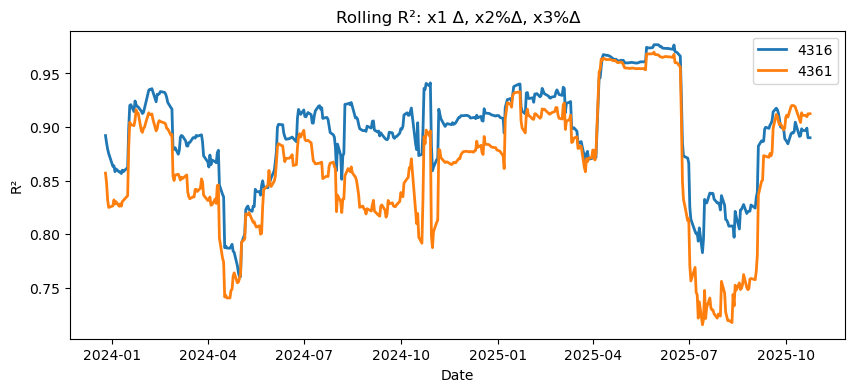

In [28]:
# highlight_codes = ["38918", "39026", "4361"]
highlight_codes = ["4316", "4361"]
fig, ax = plt.subplots(figsize=(10,4))
for code in highlight_codes:
    rb = panels[code]
    ax.plot(rb["Date"], rb["r2"], label=code, lw=2)
ax.set_title("Rolling R²: x1 Δ, x2%Δ, x3%Δ")
ax.set_xlabel("Date")
ax.set_ylabel("R²")
ax.legend(); plt.show()


In [29]:
# ================== Rolling MIX with stats (betas, t, p) + factor corrs ==================
from math import sqrt
from scipy.stats import t as tdist

def _rolling_stats(y, X):  # OLS with se, t, p, R2
    # X already includes intercept column
    n, k = X.shape
    XtX = X.T @ X
    XtX_inv = np.linalg.pinv(XtX)
    beta = XtX_inv @ (X.T @ y)
    yhat = X @ beta
    resid = y - yhat
    ss_res = float(resid.T @ resid)
    ss_tot = float(np.sum((y - y.mean())**2))
    r2 = 1.0 - ss_res/ss_tot if ss_tot > 0 else np.nan
    # variance of residuals and of betas
    df = max(n - k, 1)
    s2 = ss_res / df
    varb = s2 * XtX_inv
    se = np.sqrt(np.diag(varb))
    # t & p (two-sided) for non-intercept betas
    tvals = beta / np.where(se == 0, np.nan, se)
    pvals = 2.0 * (1.0 - tdist.cdf(np.abs(tvals), df=df))
    return beta, se, tvals, pvals, r2

def rolling_multifactor_mix_with_stats(df_full, win=ROLL_WIN, target_col="Portfolio_Return_1D"):
    d = design_multifactor_mix(df_full).dropna(subset=[target_col, "x1_mix","x2_mix","x3_mix"]).copy()
    d = d[d["Date"] >= START_DT].reset_index(drop=True)
    if len(d) < win:
        return pd.DataFrame()
    out = []
    for i in range(win, len(d)+1):
        sl = d.iloc[i-win:i]
        y = sl[target_col].to_numpy(float)
        Xn = sl[["x1_mix","x2_mix","x3_mix"]].to_numpy(float)
        X = np.column_stack([np.ones(len(sl)), Xn])
        beta, se, tvals, pvals, r2 = _rolling_stats(y, X)
        # factor rolling correlations & stds inside the same window
        corr = np.corrcoef(Xn.T)
        corr_x1x2 = corr[0,1]; corr_x1x3 = corr[0,2]; corr_x2x3 = corr[1,2]
        std_x1, std_x2, std_x3 = Xn.std(axis=0, ddof=1)
        out.append({
            "Date": sl["Date"].iloc[-1],
            "b0": beta[0], "b1": beta[1], "b2": beta[2], "b3": beta[3],
            "se_b1": se[1], "se_b2": se[2], "se_b3": se[3],
            "t_b1": tvals[1], "t_b2": tvals[2], "t_b3": tvals[3],
            "p_b1": pvals[1], "p_b2": pvals[2], "p_b3": pvals[3],
            "r2": r2,
            "corr_x1x2": corr_x1x2, "corr_x1x3": corr_x1x3, "corr_x2x3": corr_x2x3,
            "std_x1": std_x1, "std_x2": std_x2, "std_x3": std_x3
        })
    return pd.DataFrame(out).set_index("Date")

# R²(full) vs R²(drop x2) utilities (MIX spec)
def rolling_R2_mix(df_full, win=ROLL_WIN, target_col="Portfolio_Return_1D", use_cols=("x1_mix","x2_mix","x3_mix")):
    d = design_multifactor_mix(df_full).dropna(subset=[target_col, *use_cols]).copy()
    d = d[d["Date"] >= START_DT].reset_index(drop=True)
    if len(d) < win: 
        return pd.Series(dtype=float)
    pts = []
    for i in range(win, len(d)+1):
        sl = d.iloc[i-win:i]
        y = sl[target_col].to_numpy(float)
        X = np.column_stack([np.ones(len(sl)), sl[list(use_cols)].to_numpy(float)])
        beta, se, tvals, pvals, r2 = _rolling_stats(y, X)
        pts.append((sl["Date"].iloc[-1], r2))
    return pd.Series(dict(pts)).sort_index()

# ================== Choose a representative portfolio (near median cross-sec R²) ==================
# Compute latest R² (MIX) per code and pick closest to median
latest_r2_per_code = {}
for code, df in datasets_full.items():
    r2s = rolling_R2_mix(df)
    if len(r2s): 
        latest_r2_per_code[code] = float(r2s.iloc[-1])
if not latest_r2_per_code:
    raise RuntimeError("No R² series available.")
median_r2 = np.median(list(latest_r2_per_code.values()))
rep_code = min(latest_r2_per_code, key=lambda c: abs(latest_r2_per_code[c]-median_r2))
print(f"[Rep] Using portfolio {rep_code} (latest R² ~ {latest_r2_per_code[rep_code]:.3f}, cross-sec median ~ {median_r2:.3f})")

# ================== Build the diagnostic tables for the representative portfolio ==================
REP_START = pd.Timestamp("2025-06-20")   # red-window start (adjust if needed)
REP_END   = pd.Timestamp("2025-07-25")   # red-window end   (adjust if needed)

df_rep = datasets_full[rep_code]
panel_rep = rolling_multifactor_mix_with_stats(df_rep)

# R²(full) vs R²(drop x2) and partial R² of x2
r2_full = rolling_R2_mix(df_rep)
r2_dropx2 = rolling_R2_mix(df_rep, use_cols=("x1_mix","x3_mix"))
r2_cmp = pd.concat([r2_full.rename("R2_full"), r2_dropx2.rename("R2_drop_x2")], axis=1)
r2_cmp["dR2_x2"] = r2_cmp["R2_full"] - r2_cmp["R2_drop_x2"]

# Slice for the red window
panel_win = panel_rep.loc[(panel_rep.index>=REP_START) & (panel_rep.index<=REP_END)]
r2_cmp_win = r2_cmp.loc[(r2_cmp.index>=REP_START) & (r2_cmp.index<=REP_END)]

[Rep] Using portfolio 4319 (latest R² ~ 0.887, cross-sec median ~ 0.887)


In [30]:

# # ================== Export to Excel ==================
# xlsx_path = OUTPUT_DIR / f"diagnostics_{rep_code}.xlsx"
# with pd.ExcelWriter(xlsx_path, engine="xlsxwriter") as writer:
#     panel_rep.reset_index().to_excel(writer, sheet_name="rolling_betas_stats", index=False)
#     r2_cmp.reset_index().rename(columns={"index":"Date"}).to_excel(writer, sheet_name="R2_full_vs_dropx2", index=False)
#     # window summaries
#     panel_win.reset_index().to_excel(writer, sheet_name="window_stats_redbox", index=False)
#     r2_cmp_win.reset_index().rename(columns={"index":"Date"}).to_excel(writer, sheet_name="window_R2_redbox", index=False)

# print(f"[Excel] Wrote {xlsx_path}")


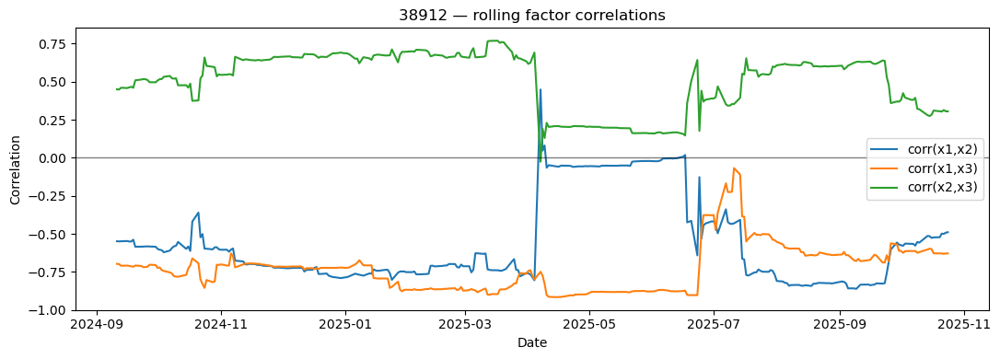

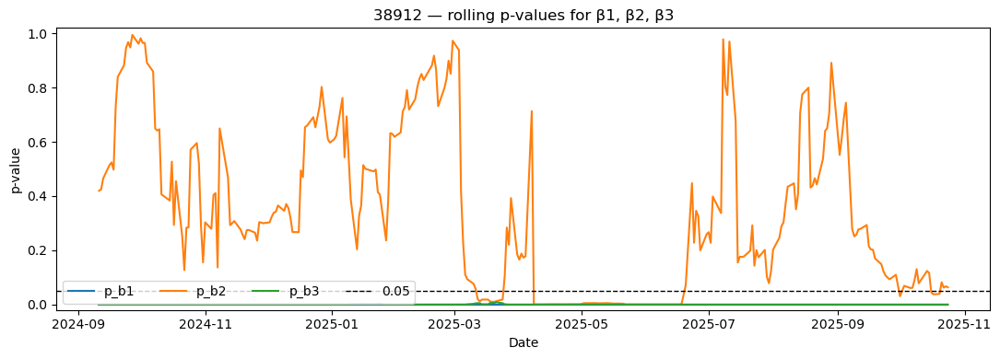

In [31]:

# --- Rolling MIX model with stats + correlation plots ------------------------
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import t as tdist  # for p-values

# If you already defined design_multifactor_mix in this notebook, we reuse it.
# (x1_mix = -OAD_{t-1} * Δ20Y, x2_mix = -DTS_{t-1} * %Δ(A+BBB)/2, x3_mix = -%Δ MF mix)

def _ols_with_stats(y, X):
    """
    Returns: beta (k,), se (k,), t (k,), p (k,), R2, n, dof
    where X already includes a column of ones.
    """
    n, k = X.shape
    beta = np.linalg.lstsq(X, y, rcond=None)[0]
    yhat = X @ beta
    resid = y - yhat
    dof = max(n - k, 1)
    rss = float(resid @ resid)
    tss = float(((y - y.mean()) @ (y - y.mean())))
    r2 = 1.0 - rss / tss if tss > 0 else np.nan

    XtX_inv = np.linalg.inv(X.T @ X)
    s2 = rss / dof
    var_beta = s2 * XtX_inv
    se = np.sqrt(np.clip(np.diag(var_beta), 0, np.inf))
    with np.errstate(divide='ignore', invalid='ignore'):
        tvals = beta / se
    # two-sided p-values
    pvals = 2 * tdist.sf(np.abs(tvals), dof)
    return beta, se, tvals, pvals, r2, n, dof

def rolling_multifactor_mix_with_stats(df_full, win=ROLL_WIN, target_col="Portfolio_Return_1D"):
    """
    Rolling OLS on (x1_mix, x2_mix, x3_mix) with window=win.
    Also computes rolling corr(x1,x2), corr(x1,x3), corr(x2,x3) and std of each x.
    Returns a DataFrame indexed by Date.
    """
    d = design_multifactor_mix(df_full).sort_values("Date")
    keep = ["Date", target_col, "x1_mix", "x2_mix", "x3_mix"]
    d = d[keep].dropna().reset_index(drop=True)
    d = d[d["Date"] >= START_DT].reset_index(drop=True)
    if len(d) < win:
        return pd.DataFrame(columns=["b1","b2","b3","p_b1","p_b2","p_b3","r2"])

    rows = []
    for i in range(win, len(d) + 1):
        sl = d.iloc[i - win:i].copy()
        y = sl[target_col].to_numpy(float)
        X = sl[["x1_mix","x2_mix","x3_mix"]].to_numpy(float)
        Xc = np.column_stack([np.ones(len(sl)), X])
        beta, se, tvals, pvals, r2, n, dof = _ols_with_stats(y, Xc)

        # rolling correlations + factor std (same window)
        c12 = np.corrcoef(sl["x1_mix"], sl["x2_mix"])[0,1]
        c13 = np.corrcoef(sl["x1_mix"], sl["x3_mix"])[0,1]
        c23 = np.corrcoef(sl["x2_mix"], sl["x3_mix"])[0,1]
        rows.append({
            "Date": sl["Date"].iloc[-1],
            "b0": beta[0], "b1": beta[1], "b2": beta[2], "b3": beta[3],
            "p_b1": pvals[1], "p_b2": pvals[2], "p_b3": pvals[3],
            "r2": r2, "n": n, "dof": dof,
            "corr_x1x2": c12, "corr_x1x3": c13, "corr_x2x3": c23,
            "std_x1": sl["x1_mix"].std(ddof=1),
            "std_x2": sl["x2_mix"].std(ddof=1),
            "std_x3": sl["x3_mix"].std(ddof=1),
        })
    out = pd.DataFrame(rows).set_index("Date").sort_index()
    return out

def plot_factor_correlations(panel, title=None):
    """Plot rolling corr(x1,x2), corr(x1,x3), corr(x2,x3)."""
    if panel.empty:
        print("No data to plot."); return
    fig, ax = plt.subplots(figsize=(11,4))
    ax.plot(panel.index, panel["corr_x1x2"], label="corr(x1,x2)")
    ax.plot(panel.index, panel["corr_x1x3"], label="corr(x1,x3)")
    ax.plot(panel.index, panel["corr_x2x3"], label="corr(x2,x3)")
    ax.axhline(0, lw=1, alpha=0.5, color="k")
    ax.set_ylabel("Correlation")
    ax.set_xlabel("Date")
    ax.set_title(title or "Rolling factor correlations")
    ax.legend()
    plt.tight_layout(); plt.show()

def plot_pvalues(panel, title=None):
    """Plot rolling p-values for b1, b2, b3 with a 0.05 reference line."""
    if panel.empty:
        print("No data to plot."); return
    fig, ax = plt.subplots(figsize=(11,4))
    ax.plot(panel.index, panel["p_b1"], label="p_b1")
    ax.plot(panel.index, panel["p_b2"], label="p_b2")
    ax.plot(panel.index, panel["p_b3"], label="p_b3")
    ax.axhline(0.05, color="k", lw=1, ls="--", label="0.05")
    ax.set_ylim(-0.02, 1.02)
    ax.set_ylabel("p-value")
    ax.set_xlabel("Date")
    ax.set_title(title or "Rolling p-values")
    ax.legend(ncol=4)
    plt.tight_layout(); plt.show()

# ---- Run for your email example portfolio (38912) ---------------------------
rep_code = "38912"  # change if you want a different portfolio
panel_38912 = rolling_multifactor_mix_with_stats(datasets_full[rep_code], win=ROLL_WIN)

plot_factor_correlations(panel_38912, title=f"{rep_code} — rolling factor correlations")
plot_pvalues(panel_38912, title=f"{rep_code} — rolling p-values for β1, β2, β3")


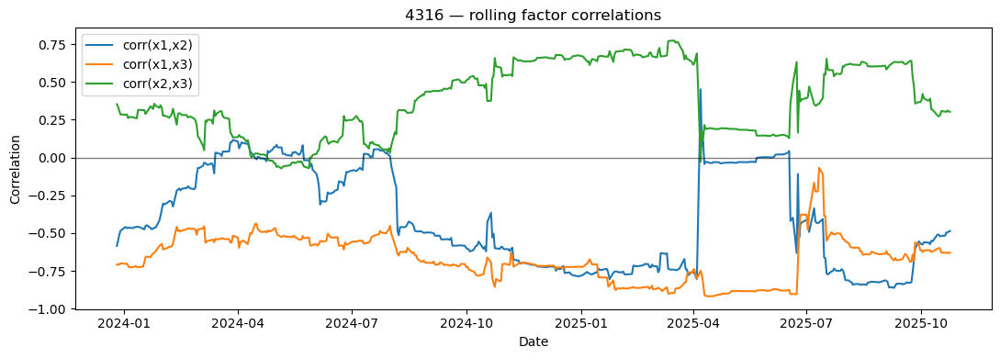

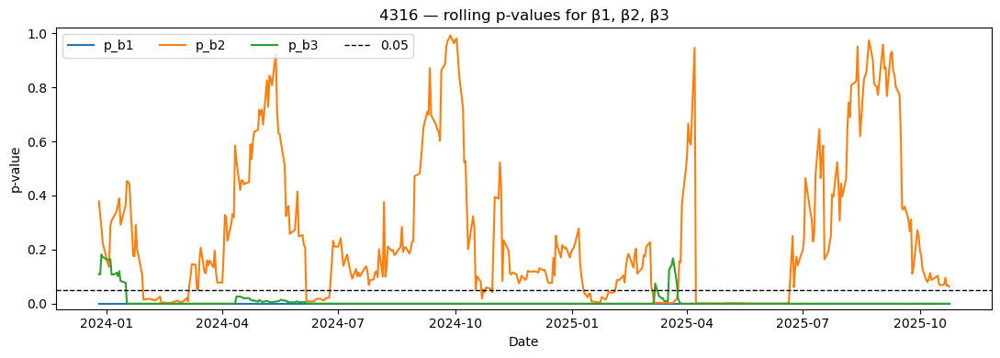

In [32]:
# ---- Run for your email example portfolio (38912) ---------------------------
rep_code = "4316"  # change if you want a different portfolio
panel_4316 = rolling_multifactor_mix_with_stats(datasets_full[rep_code], win=ROLL_WIN)

plot_factor_correlations(panel_4316, title=f"{rep_code} — rolling factor correlations")
plot_pvalues(panel_4316, title=f"{rep_code} — rolling p-values for β1, β2, β3")


[MIX deltas] built 35 / 35 delta panels


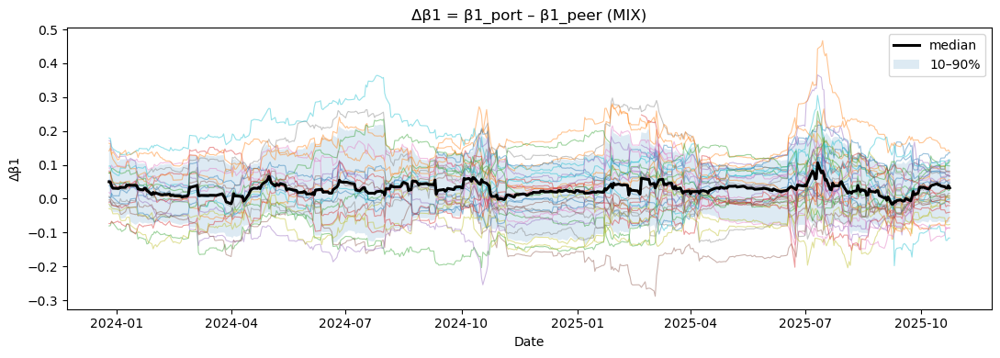

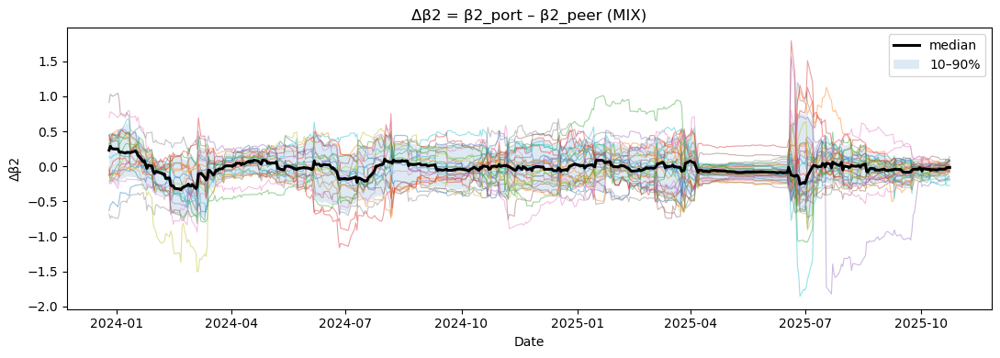

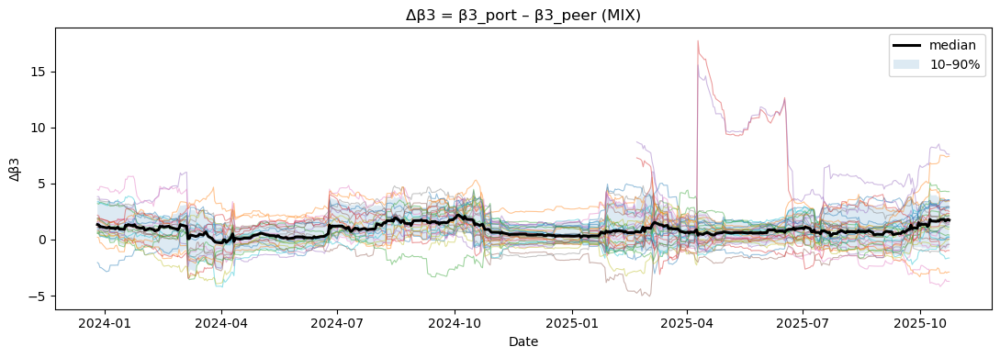

In [33]:
# ================================
# Portfolio – PeerGroup beta deltas (MIX model)
# ================================

def _beta_diff_one_code(code):
    """Align MIX betas for a portfolio and its peer-group, then compute deltas."""
    rp = rolling_beta_panels_mix.get(str(code))        # portfolio MIX betas
    rg = rolling_beta_panels_mix_pg.get(str(code))     # peer-group MIX betas (same code key)
    if rp is None or rg is None or rp.empty or rg.empty:
        return None
    m = (rp.merge(rg, on="Date", suffixes=("_p","_pg"))
           .sort_values("Date")
           .dropna(subset=["b1_p","b2_p","b3_p","b1_pg","b2_pg","b3_pg"]))
    m["db1"] = m["b1_p"] - m["b1_pg"]
    m["db2"] = m["b2_p"] - m["b2_pg"]
    m["db3"] = m["b3_p"] - m["b3_pg"]
    # (optional) R² difference
    if "r2_p" in m and "r2_pg" in m:
        m["dR2"] = m["r2_p"] - m["r2_pg"]
    return m[["Date","db1","db2","db3"] + (["dR2"] if "dR2" in m.columns else [])]

# Build per-code delta panels
beta_diff_panels_mix = {}
for code in datasets_full.keys():
    df_d = _beta_diff_one_code(code)
    if df_d is not None and len(df_d):
        beta_diff_panels_mix[str(code)] = df_d

print(f"[MIX deltas] built {len(beta_diff_panels_mix)} / {len(datasets_full)} delta panels")

# Wide matrices for Δβ1, Δβ2, Δβ3 across codes (reuse _wide_from_panels)
wide_db1_mix = _wide_from_panels(beta_diff_panels_mix, "db1")
wide_db2_mix = _wide_from_panels(beta_diff_panels_mix, "db2")
wide_db3_mix = _wide_from_panels(beta_diff_panels_mix, "db3")

# --------- Plots (cross-section: all codes) ---------
_plot_many_lines(wide_db1_mix, "Δβ1 = β1_port – β1_peer (MIX)", ylabel="Δβ1")
_plot_many_lines(wide_db2_mix, "Δβ2 = β2_port – β2_peer (MIX)", ylabel="Δβ2")
_plot_many_lines(wide_db3_mix, "Δβ3 = β3_port – β3_peer (MIX)", ylabel="Δβ3")

# --------- Plots (selected codes overlay) ----------
def plot_beta_diff_selected(codes, which=("db1","db2","db3")):
    codes = [str(c) for c in codes]
    labels = {"db1":"Δβ1 (rates)","db2":"Δβ2 (credit %Δ)","db3":"Δβ3 (MF %Δ)"}
    for col in which:
        fig, ax = plt.subplots(figsize=(10,3.6))
        for code in codes:
            d = beta_diff_panels_mix.get(code)
            if d is None: 
                continue
            ax.plot(d["Date"], d[col], lw=1.6, label=code)
        ax.axhline(0, lw=0.8, color="k", alpha=0.6)
        ax.set_title(f"{labels.get(col,col)} — portfolio minus peer group (MIX)")
        ax.set_xlabel("Date"); ax.set_ylabel(col)
        ax.legend(ncol=6, fontsize=8, frameon=False)
        plt.tight_layout(); plt.show()

# Example:
# plot_beta_diff_selected(["38918","39026","4361"])


In [34]:

# # --------- Export to CSV (optional) ----------
# _out = []
# for code, d in beta_diff_panels_mix.items():
#     tmp = d.copy()
#     tmp.insert(0, "Code", code)
#     _out.append(tmp)
# if _out:
#     deltas_all = pd.concat(_out, axis=0, ignore_index=True)
#     deltas_all.to_csv(OUTPUT_DIR / "beta_deltas_port_minus_peer_MIX.csv", index=False)
#     print(f"[save] {OUTPUT_DIR/'beta_deltas_port_minus_peer_MIX.csv'}")


[4F deltas] built 35 delta panels


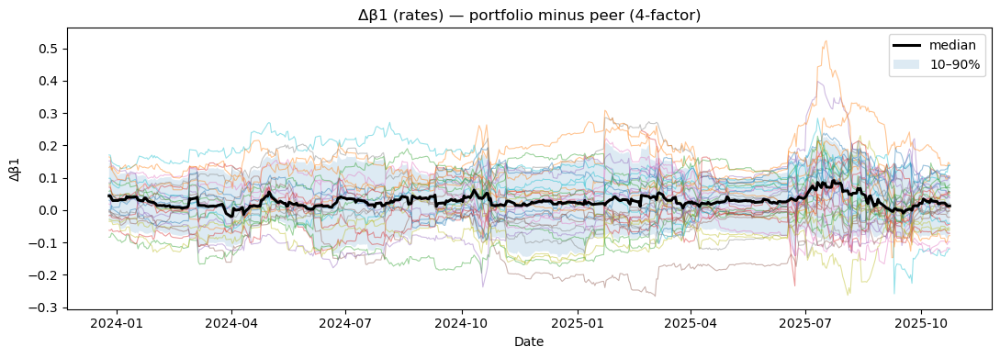

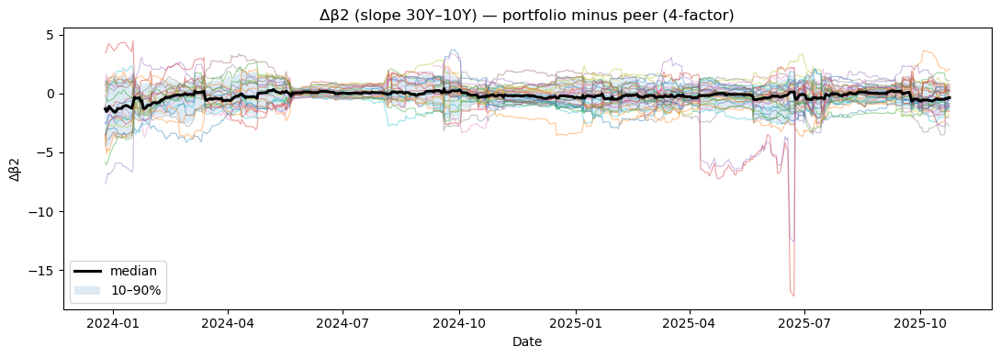

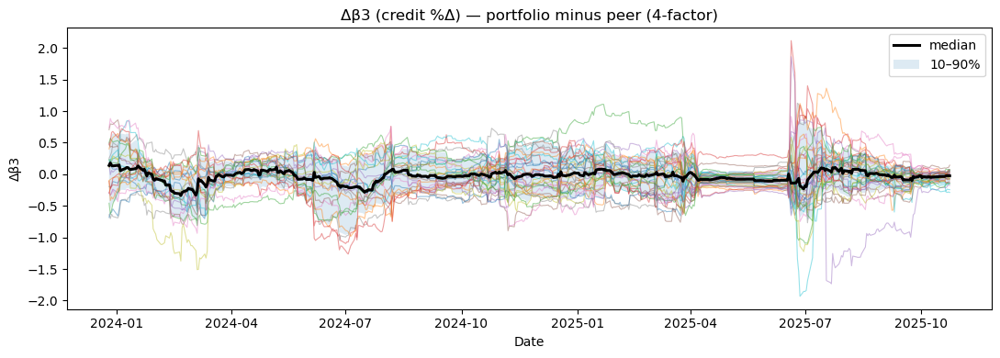

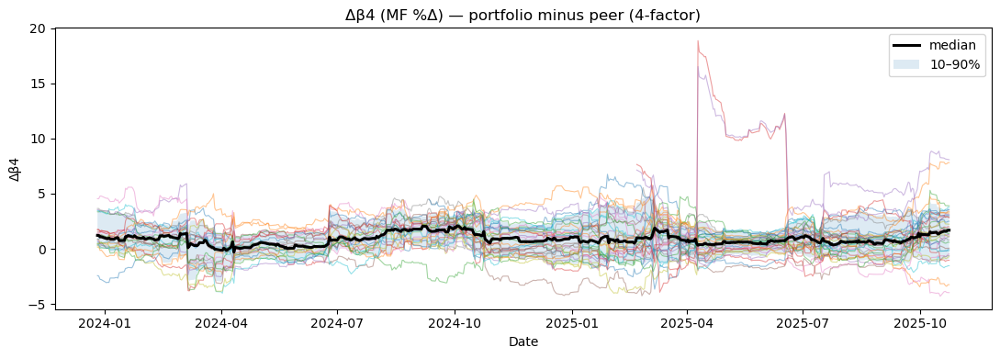

In [35]:
# =========================================
# Portfolio – PeerGroup beta deltas (4-factor model)
# =========================================

def _beta_diff_generic(port_panels, peer_panels, factor_cols):
    """Return {code: DataFrame(Date, d<factor>...)} for given factor columns."""
    out = {}
    for code, rp in port_panels.items():
        rg = peer_panels.get(str(code))
        if rp is None or rg is None or len(rp)==0 or len(rg)==0:
            continue
        m = (rp.merge(rg, on="Date", suffixes=("_p","_pg"))
               .sort_values("Date"))
        # ensure factors exist
        need = [f"{c}_p" for c in factor_cols] + [f"{c}_pg" for c in factor_cols]
        if not set(need).issubset(m.columns):
            continue
        for c in factor_cols:
            m[f"d{c}"] = m[f"{c}_p"] - m[f"{c}_pg"]
        if "r2_p" in m.columns and "r2_pg" in m.columns:
            m["dR2"] = m["r2_p"] - m["r2_pg"]
        out[str(code)] = m[["Date"] + [f"d{c}" for c in factor_cols] + (["dR2"] if "dR2" in m.columns else [])]
    return out

def _wide_from_delta_panels(delta_panels, dcol):
    mats = []
    for code, df in delta_panels.items():
        if dcol in df.columns and len(df):
            mats.append(df[["Date", dcol]].set_index("Date").rename(columns={dcol: code}))
    if not mats:
        return pd.DataFrame()
    return pd.concat(mats, axis=1).sort_index().dropna(how="all")

def plot_beta_diff_selected_4f(delta_panels_4f, codes, which=("db1","db2","db3","db4")):
    labels = {"db1":"Δβ1 (rates)","db2":"Δβ2 (slope 30Y–10Y)",
              "db3":"Δβ3 (credit %Δ)","db4":"Δβ4 (MF %Δ)"}
    codes = [str(c) for c in codes]
    for col in which:
        fig, ax = plt.subplots(figsize=(10,3.6))
        for code in codes:
            d = delta_panels_4f.get(code)
            if d is None or col not in d.columns: 
                continue
            ax.plot(d["Date"], d[col], lw=1.6, label=code)
        ax.axhline(0, lw=0.8, color="k", alpha=0.6)
        ax.set_title(f"{labels.get(col,col)} — portfolio minus peer group (4-factor)")
        ax.set_xlabel("Date"); ax.set_ylabel(col)
        ax.legend(ncol=6, fontsize=8, frameon=False)
        plt.tight_layout(); plt.show()

# ---- Build deltas for the 4-factor model ----
# Expect these dicts to exist (rename here if yours differ):
#   rolling_beta_panels_4f      -> portfolio betas (b1..b4, r2)
#   rolling_beta_panels_4f_pg   -> peer-group betas (b1..b4, r2)

try:
    factor_cols_4f = ("b1","b2","b3","b4")
    beta_diff_panels_4f = _beta_diff_generic(
        port_panels=rolling_beta_panels_4f,
        peer_panels=rolling_beta_panels_4f_pg,
        factor_cols=factor_cols_4f
    )
    print(f"[4F deltas] built {len(beta_diff_panels_4f)} delta panels")

    # Cross-section (all codes) wide matrices & plots
    wide_db1_4f = _wide_from_delta_panels(beta_diff_panels_4f, "db1")
    wide_db2_4f = _wide_from_delta_panels(beta_diff_panels_4f, "db2")
    wide_db3_4f = _wide_from_delta_panels(beta_diff_panels_4f, "db3")
    wide_db4_4f = _wide_from_delta_panels(beta_diff_panels_4f, "db4")

    _plot_many_lines(wide_db1_4f, "Δβ1 (rates) — portfolio minus peer (4-factor)", ylabel="Δβ1")
    _plot_many_lines(wide_db2_4f, "Δβ2 (slope 30Y–10Y) — portfolio minus peer (4-factor)", ylabel="Δβ2")
    _plot_many_lines(wide_db3_4f, "Δβ3 (credit %Δ) — portfolio minus peer (4-factor)", ylabel="Δβ3")
    _plot_many_lines(wide_db4_4f, "Δβ4 (MF %Δ) — portfolio minus peer (4-factor)", ylabel="Δβ4")

    # Example overlay for a few codes:
    # plot_beta_diff_selected_4f(beta_diff_panels_4f, ["38918","39026","4361"])

    # Optional CSV export
    # if beta_diff_panels_4f:
    #     _out = []
    #     for code, d in beta_diff_panels_4f.items():
    #         tmp = d.copy()
    #         tmp.insert(0, "Code", code)
    #         _out.append(tmp)
    #     deltas_4f_all = pd.concat(_out, axis=0, ignore_index=True)
    #     deltas_4f_all.to_csv(OUTPUT_DIR / "beta_deltas_port_minus_peer_4factor.csv", index=False)
    #     print(f"[save] {OUTPUT_DIR/'beta_deltas_port_minus_peer_4factor.csv'}")
except NameError as e:
    print("[4F deltas] Missing required rolling panels. Make sure you have built:")
    print("  rolling_beta_panels_4f       (portfolio 4-factor betas: b1..b4, r2)")
    print("  rolling_beta_panels_4f_pg    (peer-group 4-factor betas: b1..b4, r2)")
    print("Then rerun this cell.")


**Batas _2a**

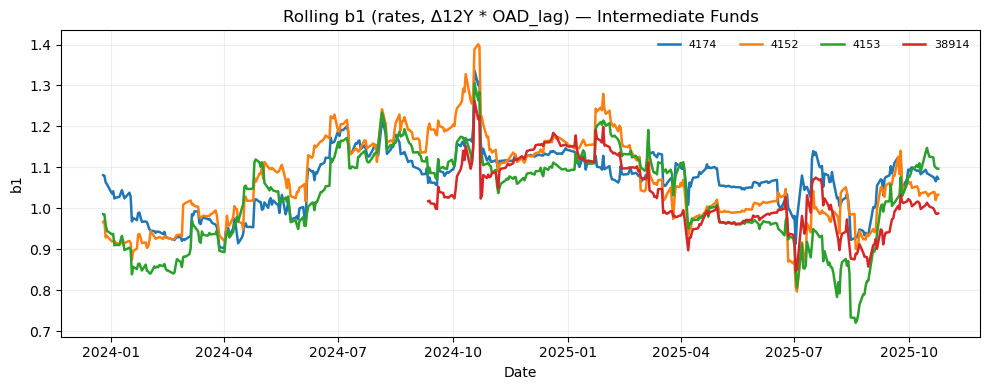

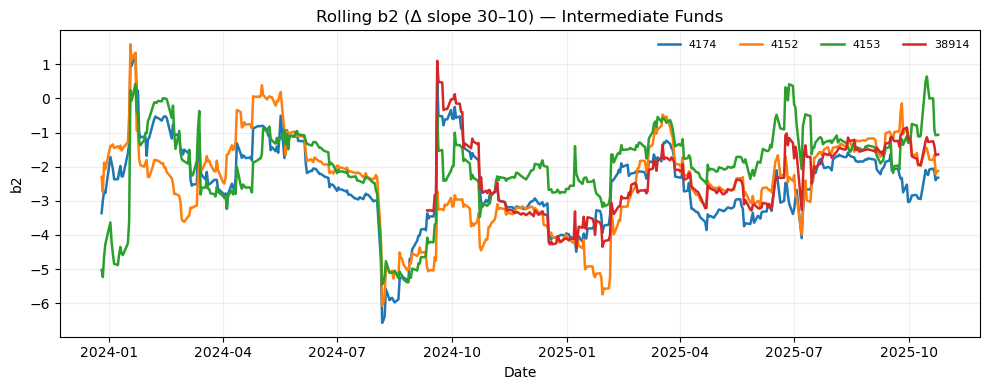

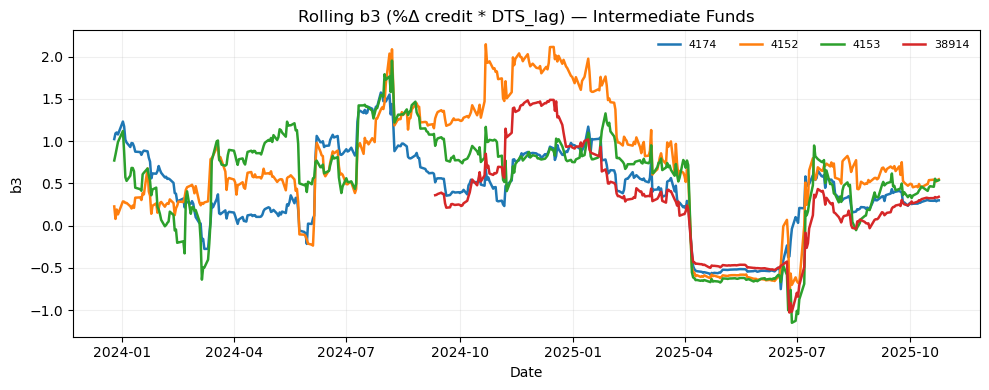

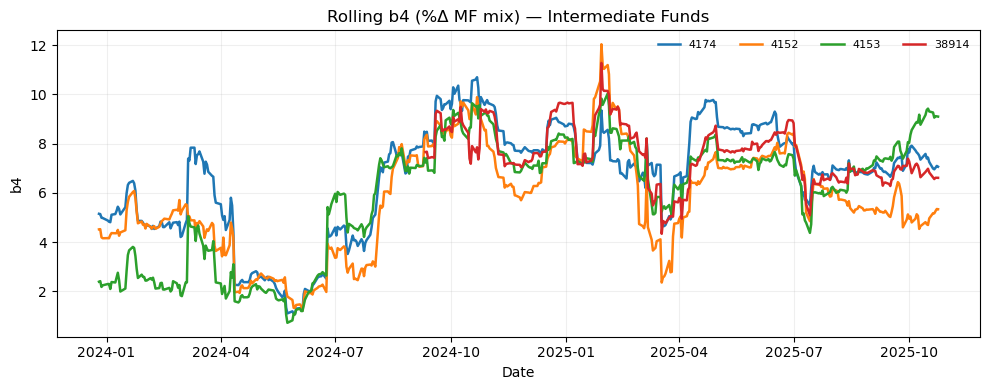

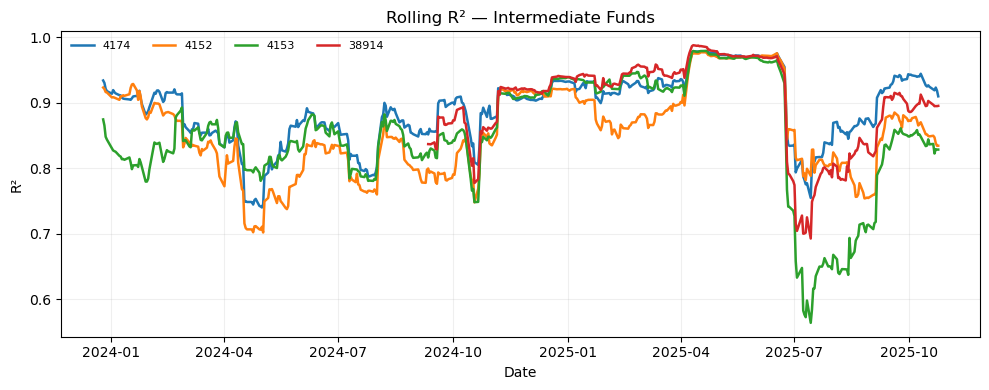

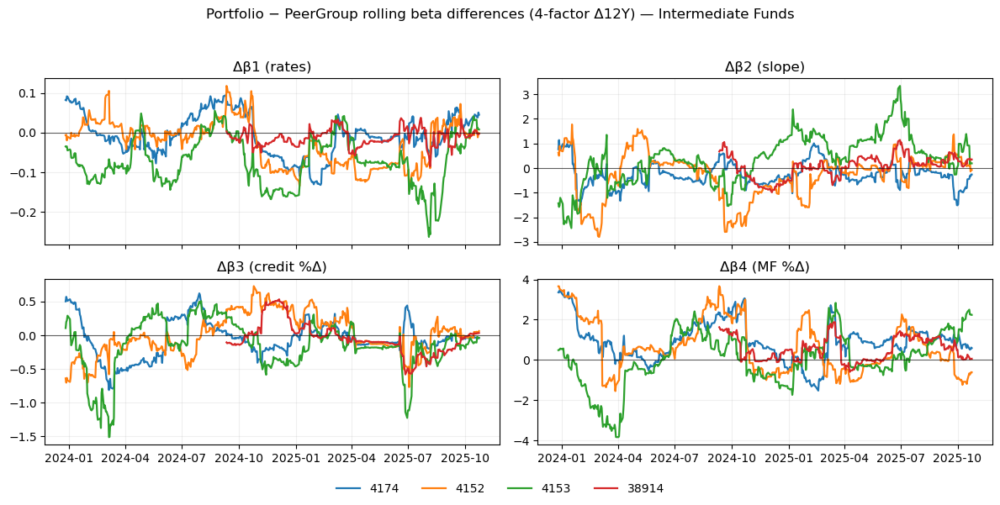

In [36]:

# ================================
# Selected-codes plots (4-factor Δ12Y spec)
# ================================
import matplotlib.pyplot as plt

SELECTED = ["4174", "4152", "4153", "38914"]  # portfolio codes (strings)

def _plot_selected_metric(panels, metric, title, ylabel=None):
    fig, ax = plt.subplots(figsize=(10, 4))
    any_line = False
    for code in SELECTED:
        df = panels.get(str(code))
        if df is None or df.empty or metric not in df.columns:
            continue
        ax.plot(df["Date"], df[metric], lw=1.8, label=code)
        any_line = True
    if not any_line:
        print(f"[plot] {title}: nothing to plot"); plt.close(fig); return
    ax.set_title(title)
    ax.set_xlabel("Date")
    if ylabel: ax.set_ylabel(ylabel)
    ax.legend(ncol=min(len(SELECTED), 4), fontsize=8, frameon=False)
    ax.grid(alpha=0.2)
    plt.tight_layout()
    plt.show()

# ---- 1) Rolling b1,b2,b3,b4,R² for the selected portfolios (portfolio-return model) ----
_plot_selected_metric(rolling_beta_panels_4f, "b1", "Rolling b1 (rates, Δ12Y * OAD_lag) — Intermediate Funds",  ylabel="b1")
_plot_selected_metric(rolling_beta_panels_4f, "b2", "Rolling b2 (Δ slope 30–10) — Intermediate Funds",          ylabel="b2")
_plot_selected_metric(rolling_beta_panels_4f, "b3", "Rolling b3 (%Δ credit * DTS_lag) — Intermediate Funds",    ylabel="b3")
_plot_selected_metric(rolling_beta_panels_4f, "b4", "Rolling b4 (%Δ MF mix) — Intermediate Funds",              ylabel="b4")
_plot_selected_metric(rolling_beta_panels_4f, "r2", "Rolling R² — Intermediate Funds",                          ylabel="R²")

# ---- 2) One plot (single figure) of portfolio minus peer-group beta differences for the selected codes ----
# Build Δβ panels on the fly using your 4F rolling dicts (same logic as script_2a.ipynb)
def _beta_diff_generic(port_panels, peer_panels, factor_cols, codes_subset):
    out = {}
    for code in codes_subset:
        rp = port_panels.get(str(code))
        rg = peer_panels.get(str(code))
        if rp is None or rg is None or rp.empty or rg.empty:
            continue
        m = (rp.merge(rg, on="Date", suffixes=("_p","_pg"))
               .sort_values("Date"))
        need = [f"{c}_p" for c in factor_cols] + [f"{c}_pg" for c in factor_cols]
        if not set(need).issubset(m.columns):
            continue
        for c in factor_cols:
            m[f"d{c}"] = m[f"{c}_p"] - m[f"{c}_pg"]
        out[str(code)] = m[["Date"] + [f"d{c}" for c in factor_cols]]
    return out

factor_cols_4f = ("b1","b2","b3","b4")
beta_diff_panels_sel = _beta_diff_generic(
    port_panels=rolling_beta_panels_4f,
    peer_panels=rolling_beta_panels_4f_pg,
    factor_cols=factor_cols_4f,
    codes_subset=SELECTED
)

# Single figure with 4 subplots: Δβ1..Δβ4
fig, axes = plt.subplots(2, 2, figsize=(12, 6), sharex=True)
axes = axes.ravel()
labels = [("db1","Δβ1 (rates)"), ("db2","Δβ2 (slope)"), ("db3","Δβ3 (credit %Δ)"), ("db4","Δβ4 (MF %Δ)")]

for ax, (dcol, dlabel) in zip(axes, labels):
    any_line = False
    for code, d in beta_diff_panels_sel.items():
        if dcol in d.columns and not d.empty:
            ax.plot(d["Date"], d[dcol], lw=1.6, label=code)
            any_line = True
    ax.axhline(0, lw=0.8, color="k", alpha=0.6)
    ax.set_title(dlabel)
    ax.grid(alpha=0.2)
    if not any_line:
        ax.text(0.5, 0.5, "no data", transform=ax.transAxes, ha="center", va="center", alpha=0.7)

# Legend once at the bottom
handles, leg_labels = axes[0].get_legend_handles_labels()
if handles:
    fig.legend(handles, leg_labels, loc="lower center", ncol=min(len(SELECTED), 6), frameon=False)
fig.suptitle("Portfolio − PeerGroup rolling beta differences (4-factor Δ12Y) — Intermediate Funds", y=0.98, fontsize=12)
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()



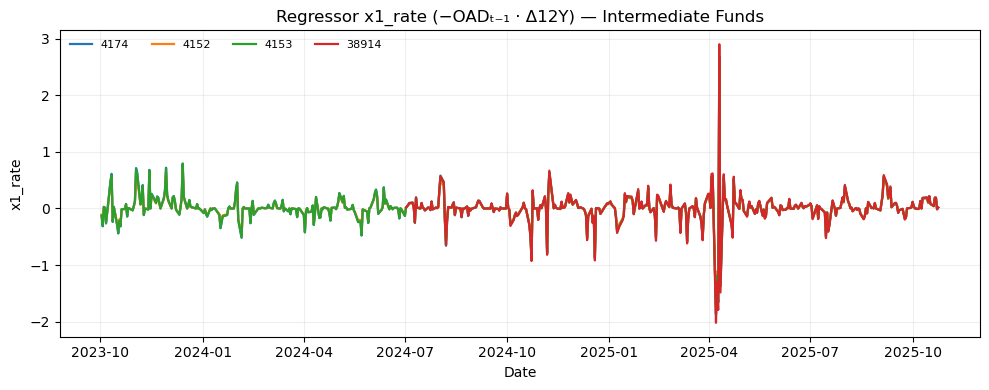

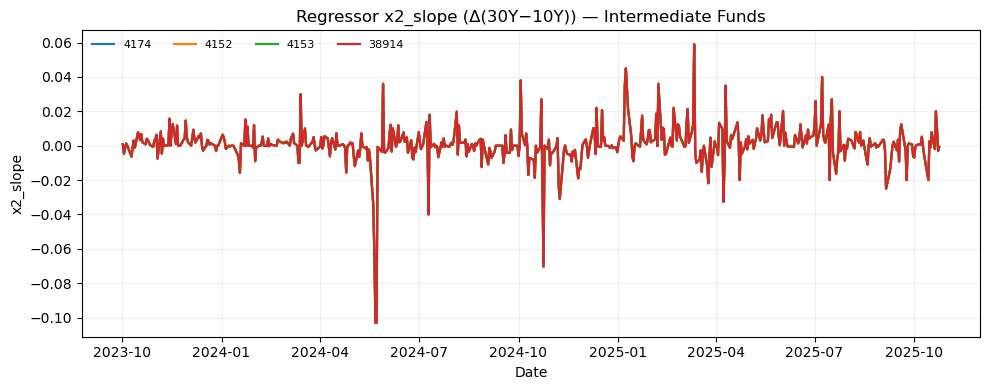

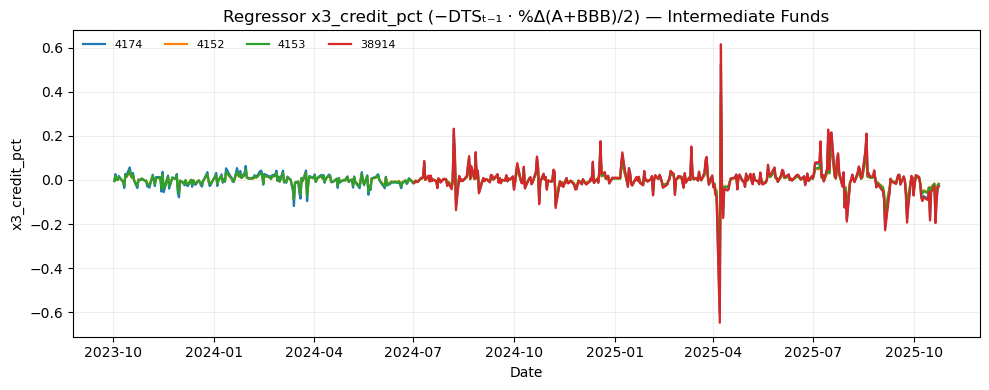

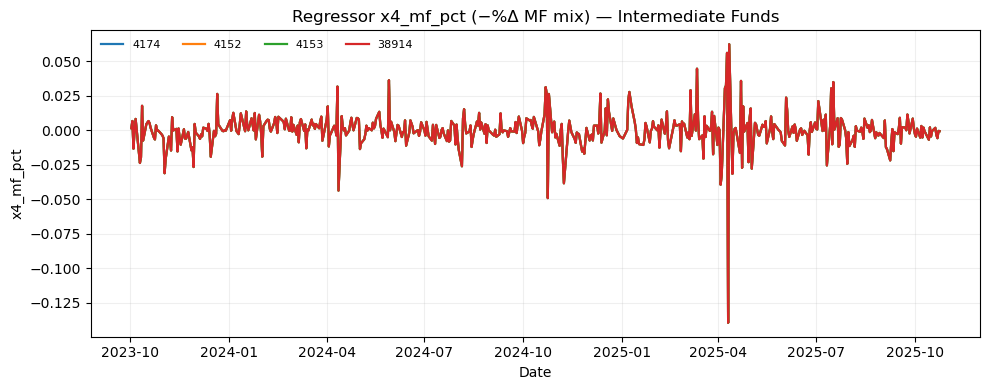

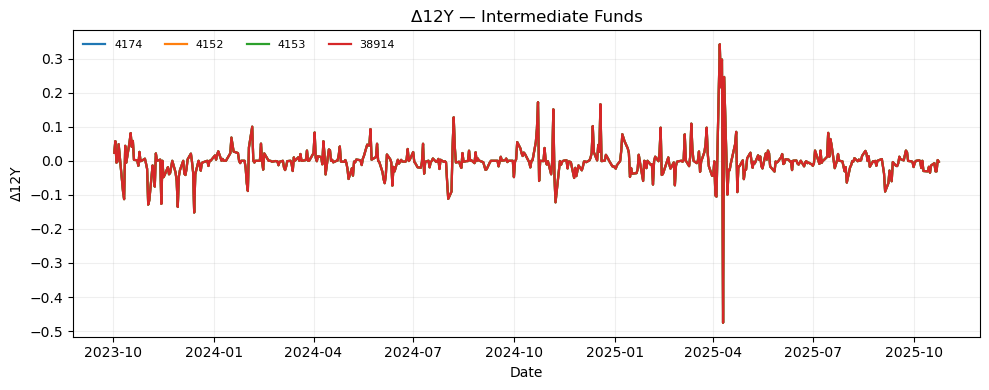

...

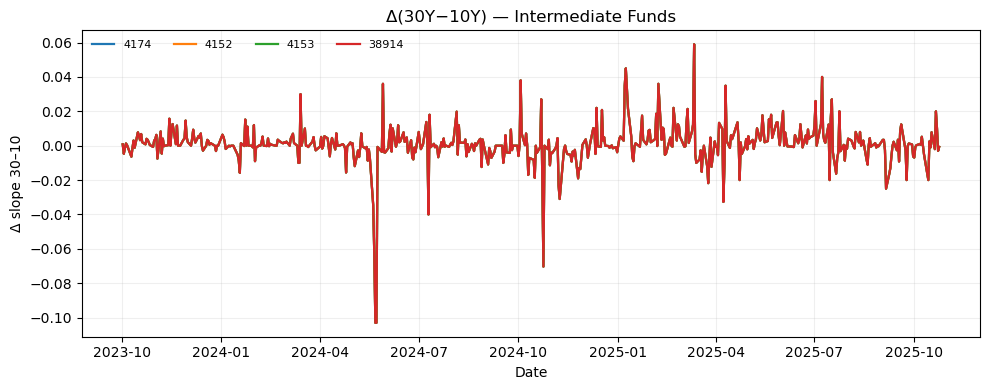

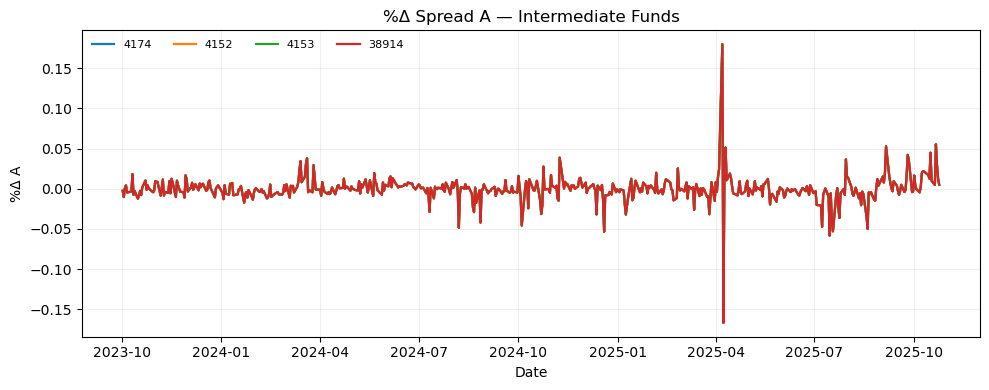

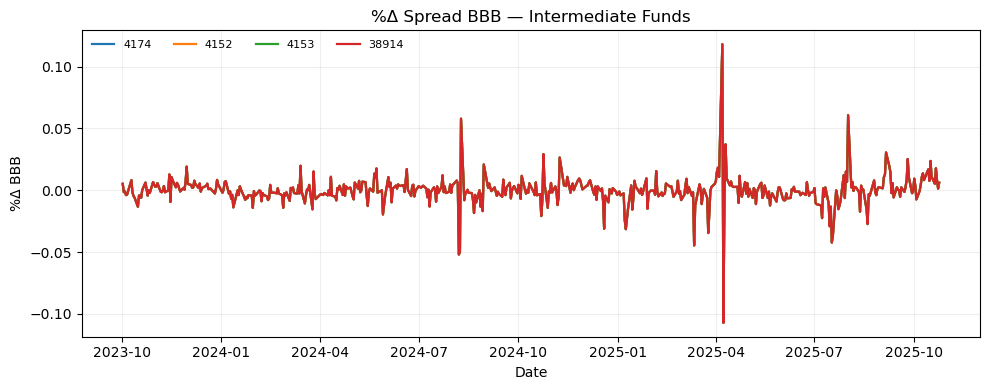

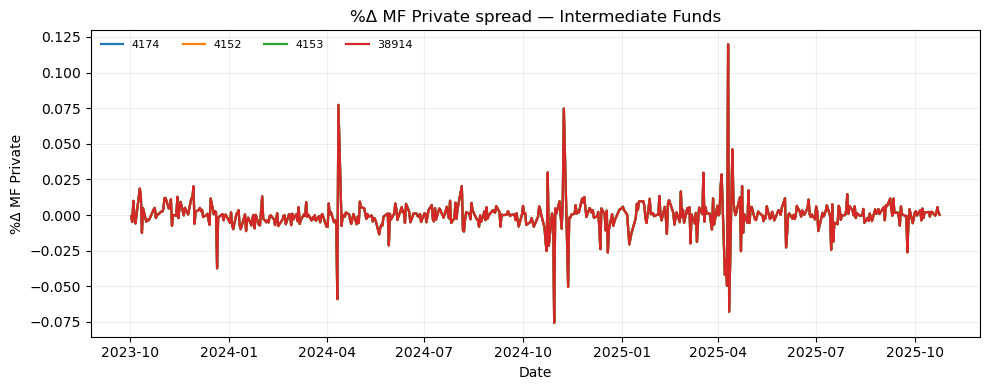

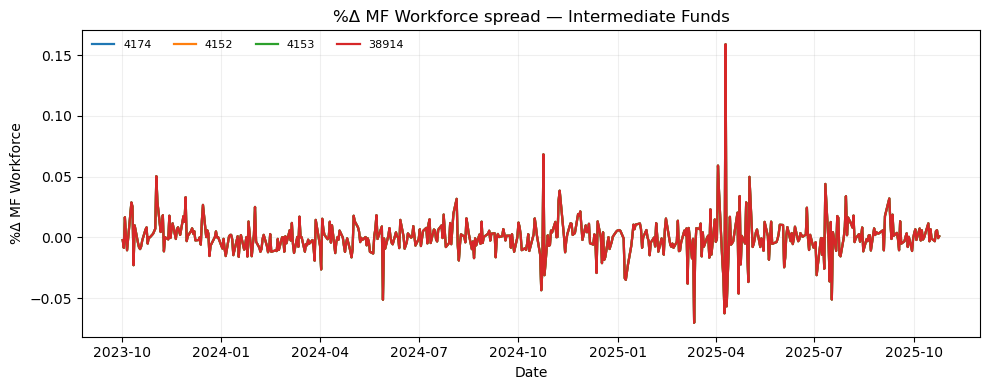

In [37]:
# ================================
# Add-on plots: regressors and raw factor moves (selected portfolios)
# ================================
import matplotlib.pyplot as plt

# Reuse SELECTED from above; if not defined, set it here
try:
    SELECTED
except NameError:
    SELECTED = ["4174", "4152", "4153", "38914"]

def _plot_selected_lines(get_df_fn, col, title, ylabel=None):
    fig, ax = plt.subplots(figsize=(10, 4))
    any_line = False
    for code in map(str, SELECTED):
        df = get_df_fn(code)
        if df is None or df.empty or col not in df.columns:
            continue
        ax.plot(df["Date"], df[col], lw=1.6, label=code)
        any_line = True
    if not any_line:
        print(f"[plot] {title}: nothing to plot"); plt.close(fig); return
    ax.set_title(title)
    ax.set_xlabel("Date")
    if ylabel: ax.set_ylabel(ylabel)
    ax.legend(ncol=min(len(SELECTED), 4), fontsize=8, frameon=False)
    ax.grid(alpha=0.2)
    plt.tight_layout(); plt.show()

# ---- Getters for data frames to plot ----

def _get_design_4f(code):
    """
    Return the 4F design DataFrame for a portfolio code by recomputing
    the regressors on its merged dataset.
    Requires design_multifactor_4f_mix() and datasets_full from script_2.ipynb.
    """
    dbase = datasets_full.get(str(code))
    if dbase is None or dbase.empty:
        return None
    d = design_multifactor_4f_mix(dbase.copy())
    # Normalize naming: if only x1_rate12 exists, expose it as x1_rate for plotting
    if "x1_rate" not in d.columns and "x1_rate12" in d.columns:
        d = d.rename(columns={"x1_rate12": "x1_rate"})
    return d

def _get_regressors_df(code):
    """
    Columns: Date, x1_rate, x2_slope, x3_credit_pct, x4_mf_pct
    """
    d = _get_design_4f(code)
    if d is None:
        return None
    keep = ["Date", "x1_rate", "x2_slope", "x3_credit_pct", "x4_mf_pct"]
    have = [c for c in keep if c in d.columns]
    if len(have) < 2:
        return None
    return d[have].dropna(subset=["Date"]).sort_values("Date")

def _get_factor_moves_df(code):
    """
    Underlying factor moves for plotting:
      d_CAAA12YR_BVLI, d_CAAA20YR_BVLI, d_Slope_30_10,
      pc_Spread_A, pc_Spread_BBB, pc_MF_Private_Spread, pc_MF_Workforce_Spread
    For %Δ columns, take from the design DF (which computes pc_* robustly).
    """
    dbase = datasets_full.get(str(code))
    if dbase is None or dbase.empty:
        return None
    dbase = dbase.sort_values("Date").copy()

    ddes = _get_design_4f(code)
    if ddes is None or ddes.empty:
        return None

    cols_from_base = [c for c in ["Date", "d_CAAA12YR_BVLI", "d_CAAA20YR_BVLI", "d_Slope_30_10"] if c in dbase.columns]
    cols_from_desn = [c for c in ["pc_Spread_A", "pc_Spread_BBB", "pc_MF_Private_Spread", "pc_MF_Workforce_Spread"] if c in ddes.columns]

    out = dbase[cols_from_base].merge(ddes[["Date"] + cols_from_desn], on="Date", how="inner")
    return out.dropna(subset=["Date"]).sort_values("Date")

# ---- Plots: regressors (x1..x4) across selected codes ----
_plot_selected_lines(_get_regressors_df, "x1_rate",        "Regressor x1_rate (−OADₜ₋₁ · Δ12Y) — Intermediate Funds", ylabel="x1_rate")
_plot_selected_lines(_get_regressors_df, "x2_slope",       "Regressor x2_slope (Δ(30Y−10Y)) — Intermediate Funds",     ylabel="x2_slope")
_plot_selected_lines(_get_regressors_df, "x3_credit_pct",  "Regressor x3_credit_pct (−DTSₜ₋₁ · %Δ(A+BBB)/2) — Intermediate Funds", ylabel="x3_credit_pct")
_plot_selected_lines(_get_regressors_df, "x4_mf_pct",      "Regressor x4_mf_pct (−%Δ MF mix) — Intermediate Funds",     ylabel="x4_mf_pct")

# ---- Plots: underlying factor moves across selected codes ----
_plot_selected_lines(_get_factor_moves_df, "d_CAAA12YR_BVLI",       "Δ12Y — Intermediate Funds",                 ylabel="Δ12Y")
_plot_selected_lines(_get_factor_moves_df, "d_CAAA20YR_BVLI",       "Δ20Y — Intermediate Funds",                 ylabel="Δ20Y")
_plot_selected_lines(_get_factor_moves_df, "d_Slope_30_10",         "Δ(30Y−10Y) — Intermediate Funds",           ylabel="Δ slope 30–10")
_plot_selected_lines(_get_factor_moves_df, "pc_Spread_A",           "%Δ Spread A — Intermediate Funds",          ylabel="%Δ A")
_plot_selected_lines(_get_factor_moves_df, "pc_Spread_BBB",         "%Δ Spread BBB — Intermediate Funds",        ylabel="%Δ BBB")
_plot_selected_lines(_get_factor_moves_df, "pc_MF_Private_Spread",  "%Δ MF Private spread — Intermediate Funds", ylabel="%Δ MF Private")
_plot_selected_lines(_get_factor_moves_df, "pc_MF_Workforce_Spread","%Δ MF Workforce spread — Intermediate Funds",ylabel="%Δ MF Workforce")


                        count      mean       std       min       max  \
d_CAAA12YR_BVLI         505.0 -0.001354  0.048333 -0.475600  0.342100   
d_CAAA20YR_BVLI         505.0 -0.000717  0.047808 -0.457400  0.335100   
d_Slope_30_10           505.0  0.000811  0.012303 -0.103000  0.059000   
pc_Spread_A             505.0 -0.000267  0.016917 -0.166718  0.179677   
pc_Spread_BBB           505.0 -0.000327  0.012186 -0.107172  0.118024   
pc_MF_Private_Spread    505.0 -0.000232  0.012211 -0.075632  0.119889   
pc_MF_Workforce_Spread  505.0 -0.000061  0.015563 -0.070384  0.158862   

                             q02       q05    median       q95       q98  
d_CAAA12YR_BVLI        -0.098808 -0.059200 -0.000900  0.056920  0.099868  
d_CAAA20YR_BVLI        -0.100564 -0.058960 -0.000900  0.057800  0.101920  
d_Slope_30_10          -0.023180 -0.012900  0.000200  0.017140  0.026920  
pc_Spread_A            -0.036221 -0.020085 -0.000398  0.018522  0.035583  
pc_Spread_BBB          -0.027090 -0.0143

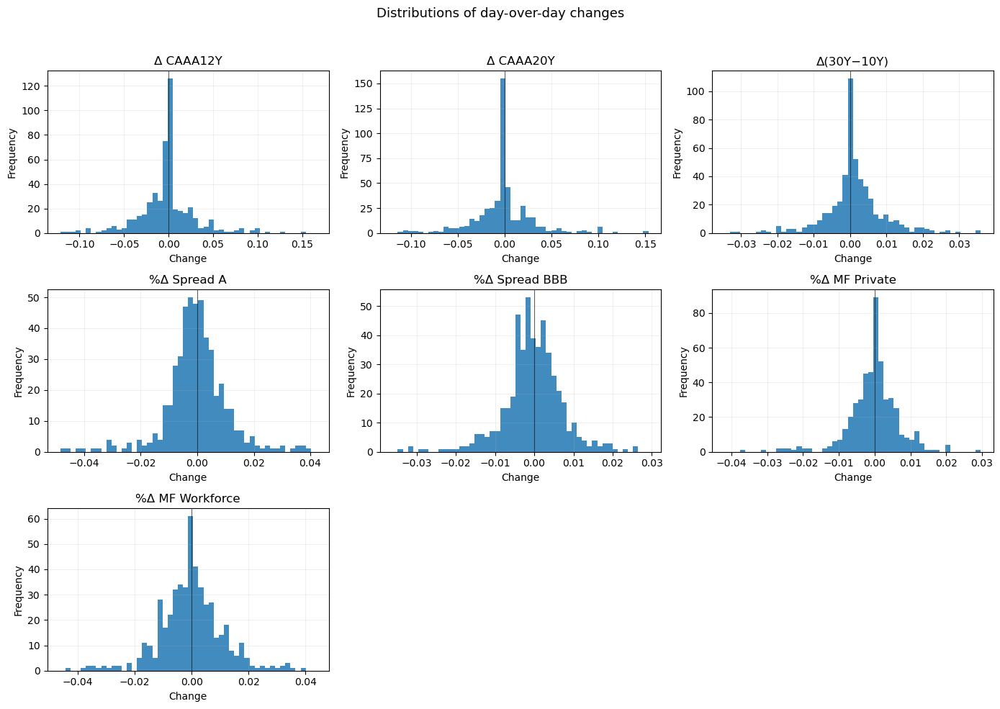

In [38]:
# ============================================
# Histograms for deltas & percent changes (global, not per-portfolio)
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

EPS = 1e-6
def pct_change_safe(curr: pd.Series, prev: pd.Series, eps: float = EPS) -> pd.Series:
    denom = prev.where(prev.abs() >= eps, eps)
    return (curr - prev) / denom

# 1) Build globally aligned frame of levels from curve & housing
need_curve   = ["Date", "CAAA12YR_BVLI", "CAAA20YR_BVLI", "Spread_A", "Spread_BBB"]
need_housing = ["Date", "MF_Private_Spread", "MF_Workforce_Spread"]

_curve = curve_sel[need_curve].merge(
    curve_sel[["Date", "Slope_30_10"]], on="Date", how="left"
)
factors_all = (
    _curve.merge(housing_spreads[need_housing], on="Date", how="inner")
          .dropna(subset=["Date"])
          .sort_values("Date")
          .reset_index(drop=True)
)

# Optional recent window (honors START_DT if present)
if "START_DT" in globals() and isinstance(START_DT, pd.Timestamp):
    factors_all = factors_all[factors_all["Date"] >= START_DT].reset_index(drop=True)

# 2) Compute requested *deltas*
delta_map = {
    "d_CAAA12YR_BVLI": factors_all["CAAA12YR_BVLI"].diff(),
    "d_CAAA20YR_BVLI": factors_all["CAAA20YR_BVLI"].diff(),
    "d_Slope_30_10":   factors_all["Slope_30_10"].diff(),
}

# 3) Compute requested *percent changes*
pc_map = {
    "pc_Spread_A":            pct_change_safe(factors_all["Spread_A"],            factors_all["Spread_A"].shift(1)),
    "pc_Spread_BBB":          pct_change_safe(factors_all["Spread_BBB"],          factors_all["Spread_BBB"].shift(1)),
    "pc_MF_Private_Spread":   pct_change_safe(factors_all["MF_Private_Spread"],   factors_all["MF_Private_Spread"].shift(1)),
    "pc_MF_Workforce_Spread": pct_change_safe(factors_all["MF_Workforce_Spread"], factors_all["MF_Workforce_Spread"].shift(1)),
}

# Assemble into one DataFrame (drop first NaN row introduced by lag/diff)
dist_df = pd.DataFrame({"Date": factors_all["Date"]})
for k, s in {**delta_map, **pc_map}.items():
    dist_df[k] = s
dist_df = dist_df.dropna().reset_index(drop=True)

# 4) Summary stats (printed to console)
order = [
    "d_CAAA12YR_BVLI",
    "d_CAAA20YR_BVLI",
    "d_Slope_30_10",
    "pc_Spread_A",
    "pc_Spread_BBB",
    "pc_MF_Private_Spread",
    "pc_MF_Workforce_Spread",
]
desc = dist_df[order].agg(["count", "mean", "std", "min", "max"]).T
q = dist_df[order].quantile([0.02, 0.05, 0.5, 0.95, 0.98]).T
summary = desc.join(q)
summary.columns = ["count","mean","std","min","max","q02","q05","median","q95","q98"]
print(summary.round(6))

# 5) Histograms (3×3 grid; last 2 panels blank)
rows, cols = 3, 3
fig, axes = plt.subplots(rows, cols, figsize=(14, 10))
axes = axes.ravel()

titles = {
    "d_CAAA12YR_BVLI":   "Δ CAAA12Y",
    "d_CAAA20YR_BVLI":   "Δ CAAA20Y",
    "d_Slope_30_10":     "Δ(30Y−10Y)",
    "pc_Spread_A":            "%Δ Spread A",
    "pc_Spread_BBB":          "%Δ Spread BBB",
    "pc_MF_Private_Spread":   "%Δ MF Private",
    "pc_MF_Workforce_Spread": "%Δ MF Workforce",
}

for i, col in enumerate(order):
    ax = axes[i]
    x = dist_df[col].to_numpy()
    # Robust x-limits so extreme tails don't dominate the view
    lo, hi = np.nanpercentile(x, [1, 99])
    # If lo==hi (degenerate), fall back to min/max
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        lo, hi = np.nanmin(x), np.nanmax(x)
    ax.hist(x, bins=50, alpha=0.85, range=(lo, hi))
    ax.axvline(0, lw=0.8, color="k", alpha=0.6)
    ax.set_title(titles[col])
    ax.set_xlabel("Change")
    ax.set_ylabel("Frequency")
    ax.grid(alpha=0.2)

# Hide unused cells
for j in range(len(order), rows*cols):
    axes[j].axis("off")

fig.suptitle("Distributions of day-over-day changes", y=0.98, fontsize=13)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


                        count    mean     std     min     max     q02     q05  \
pc_CAAA12YR_BVLI        515.0 -0.0003  0.0149 -0.1213  0.1116 -0.0315 -0.0190   
pc_CAAA20YR_BVLI        515.0 -0.0001  0.0125 -0.1015  0.0913 -0.0268 -0.0169   
pc_Slope_30_10          515.0  0.0008  0.0127 -0.1105  0.0597 -0.0248 -0.0129   
pc_Spread_A             515.0 -0.0003  0.0168 -0.1667  0.1797 -0.0359 -0.0197   
pc_Spread_BBB           515.0 -0.0004  0.0121 -0.1072  0.1180 -0.0265 -0.0143   
pc_MF_Private_Spread    515.0 -0.0002  0.0122 -0.0756  0.1199 -0.0253 -0.0126   
pc_MF_Workforce_Spread  515.0  0.0000  0.0156 -0.0704  0.1589 -0.0346 -0.0191   

                        median     q95     q98  
pc_CAAA12YR_BVLI       -0.0003  0.0184  0.0349  
pc_CAAA20YR_BVLI       -0.0002  0.0159  0.0315  
pc_Slope_30_10          0.0002  0.0155  0.0293  
pc_Spread_A            -0.0005  0.0184  0.0353  
pc_Spread_BBB          -0.0004  0.0127  0.0197  
pc_MF_Private_Spread    0.0002  0.0117  0.0194  
pc_MF_Wo

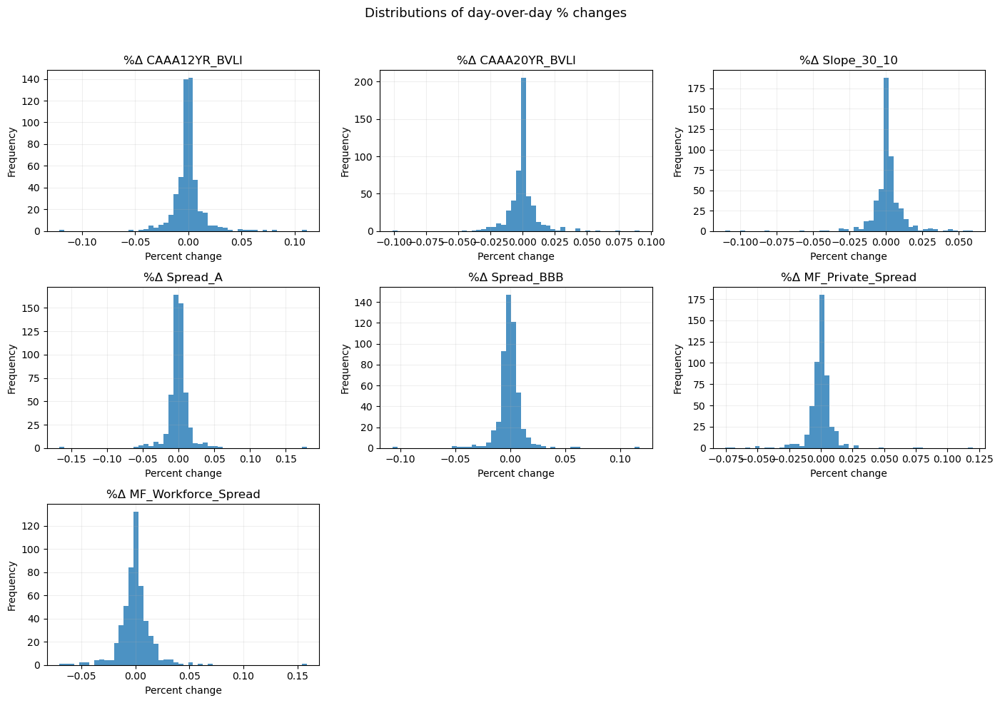

In [39]:
# ============================================
# %Δ distributions for key series (histograms)
# ============================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- helper (same EPS logic you use elsewhere) ---
EPS = 1e-6
def pct_change_safe(curr: pd.Series, prev: pd.Series, eps: float = EPS) -> pd.Series:
    denom = prev.where(prev.abs() >= eps, eps)
    return (curr - prev) / denom

# 1) Build a globally aligned frame of levels
need_curve   = ["Date", "CAAA12YR_BVLI", "CAAA20YR_BVLI", "Spread_A", "Spread_BBB"]
need_housing = ["Date", "MF_Private_Spread", "MF_Workforce_Spread"]

curve_part = curve_sel[need_curve].copy()
if "Slope_30_10" not in curve_sel.columns:
    # create slope if your script hasn't already
    curve_part = curve_part.merge(
        curve_sel[["Date", "Y30", "Y10"]], on="Date", how="left"
    )
    curve_part["Slope_30_10"] = curve_part["Y30"] - curve_part["Y10"]
    curve_part.drop(columns=["Y30", "Y10"], inplace=True)
else:
    curve_part = curve_part.merge(
        curve_sel[["Date", "Slope_30_10"]], on="Date", how="left"
    )

factors_all = (
    curve_part
    .merge(housing_spreads[need_housing], on="Date", how="inner")
    .dropna(subset=["Date"])
    .sort_values("Date")
    .reset_index(drop=True)
)

# 2) Compute %Δ for each requested series
series_list = [
    "CAAA12YR_BVLI",
    "CAAA20YR_BVLI",
    "Slope_30_10",
    "Spread_A",
    "Spread_BBB",
    "MF_Private_Spread",
    "MF_Workforce_Spread",
]

pct_cols = []
for col in series_list:
    lag = factors_all[col].shift(1)
    pcol = f"pc_{col}"
    factors_all[pcol] = pct_change_safe(factors_all[col], lag)
    pct_cols.append(pcol)

# Drop the first NaN row introduced by lag
factors_all = factors_all.dropna(subset=pct_cols).reset_index(drop=True)

# OPTIONAL: restrict to a recent window (uncomment if desired)
# factors_all = factors_all[factors_all["Date"] >= pd.Timestamp("2024-01-01")].reset_index(drop=True)

# 3) Quick summary stats
desc = factors_all[pct_cols].agg(
    ["count", "mean", "std", "min", "max"]
).T
qtiles = factors_all[pct_cols].quantile([0.02, 0.05, 0.5, 0.95, 0.98]).T
summary = desc.join(qtiles, how="left")
summary.columns = ["count", "mean", "std", "min", "max", "q02", "q05", "median", "q95", "q98"]
print(summary.round(4))

# 4) Histograms
n = len(pct_cols)
rows = 3
cols = 3  # 7 panels => 3x3 grid leaves 2 blanks
fig, axes = plt.subplots(rows, cols, figsize=(14, 10))
axes = axes.ravel()

for i, pcol in enumerate(pct_cols):
    ax = axes[i]
    ax.hist(factors_all[pcol].values, bins=50, alpha=0.8)
    ax.set_title(pcol.replace("pc_", "%Δ "))
    ax.set_xlabel("Percent change")
    ax.set_ylabel("Frequency")
    ax.grid(alpha=0.2)

# Hide any unused subplots
for j in range(i + 1, rows * cols):
    axes[j].axis("off")

fig.suptitle("Distributions of day-over-day % changes", y=0.98, fontsize=13)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [40]:
# ================================
# Counts below 2% and above 98%
# ================================
pct_df = factors_all[pct_cols].copy()

# Per-series cutoffs
q = pct_df.quantile([0.02, 0.98])
q02 = q.loc[0.02]
q98 = q.loc[0.98]

rows = []
for col in pct_cols:
    thresh_lo = q02[col]
    thresh_hi = q98[col]
    n_total   = pct_df[col].notna().sum()
    n_lo      = (pct_df[col] <  thresh_lo).sum()
    n_hi      = (pct_df[col] >  thresh_hi).sum()
    rows.append({
        "series": col.replace("pc_", "%Δ "),
        "q02": thresh_lo,
        "q98": thresh_hi,
        "n_total": n_total,
        "n_below_2pct": n_lo,
        "n_above_98pct": n_hi,
        "share_below_%": 100.0 * n_lo / n_total if n_total else float("nan"),
        "share_above_%": 100.0 * n_hi / n_total if n_total else float("nan"),
    })

extreme_counts = pd.DataFrame(rows)
print(extreme_counts.round(4))


                   series     q02     q98  n_total  n_below_2pct  \
0        %Δ CAAA12YR_BVLI -0.0315  0.0349      515            11   
1        %Δ CAAA20YR_BVLI -0.0268  0.0315      515            11   
2          %Δ Slope_30_10 -0.0248  0.0293      515            11   
3             %Δ Spread_A -0.0359  0.0353      515            11   
4           %Δ Spread_BBB -0.0265  0.0197      515            11   
5    %Δ MF_Private_Spread -0.0253  0.0194      515            11   
6  %Δ MF_Workforce_Spread -0.0346  0.0327      515            11   

   n_above_98pct  share_below_%  share_above_%  
0             11         2.1359         2.1359  
1             11         2.1359         2.1359  
2             11         2.1359         2.1359  
3             11         2.1359         2.1359  
4             11         2.1359         2.1359  
5             11         2.1359         2.1359  
6             11         2.1359         2.1359  


In [41]:
datasets_full


{'4316':           Date                        Portfolio_Name Portfolio_Code  \
 0   2023-09-29  Franklin_Federal_Tax_Free_Income_Adv           4316   
 1   2023-10-02  Franklin_Federal_Tax_Free_Income_Adv           4316   
 2   2023-10-03  Franklin_Federal_Tax_Free_Income_Adv           4316   
 3   2023-10-04  Franklin_Federal_Tax_Free_Income_Adv           4316   
 4   2023-10-05  Franklin_Federal_Tax_Free_Income_Adv           4316   
 ..         ...                                   ...            ...   
 511 2025-10-20  Franklin_Federal_Tax_Free_Income_Adv           4316   
 512 2025-10-21  Franklin_Federal_Tax_Free_Income_Adv           4316   
 513 2025-10-22  Franklin_Federal_Tax_Free_Income_Adv           4316   
 514 2025-10-23  Franklin_Federal_Tax_Free_Income_Adv           4316   
 515 2025-10-24  Franklin_Federal_Tax_Free_Income_Adv           4316   
 
                PeerGroup_Name       OAD   DTS  CAAA20YR_BVLI     Y10  \
 0    US OE Muni National Long  8.017248  5.94       

In [42]:
import pandas as pd

df_full = datasets_full.get("4174")

# target dates
date_strs = [
    "2024-10-28", "2024-10-29", "2024-10-30", "2024-10-31",
    "2024-11-01", "2024-11-04", "2024-11-05", "2024-11-06",
    "2024-11-07", "2024-11-08", "2024-11-12", "2024-11-13",
    "2024-11-14", "2024-11-15"
]

# build design frame
d = design_multifactor_4f_mix(df_full).sort_values("Date").reset_index(drop=True)

d.head()

,Date,Portfolio_Name,Portfolio_Code,PeerGroup_Name,OAD,DTS,CAAA20YR_BVLI,Y10,CAAA12YR_BVLI,Y30,...,pc_Spread_A,pc_Spread_BBB,pc_MF_Private_Spread,pc_MF_Workforce_Spread,pc_credit_mix,pc_mf_mix,x1_rate,x2_slope,x3_credit_pct,x4_mf_pct
0,2023-09-29,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,5.471483,4.39,4.1268,3.4239,3.6162,4.3584,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-10-02,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,5.468975,4.40,4.1505,3.4474,3.6399,4.3827,...,-0.002558,0.005154,-0.000883,-0.002274,0.001298,-0.001579,-0.129674,0.0008,-0.005698,0.001579
2,2023-10-03,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,5.468631,4.37,4.2053,3.5065,3.6976,4.4371,...,-0.010339,-0.001524,-0.004843,-0.008710,-0.005932,-0.006777,-0.315560,-0.0047,0.026099,0.006777
3,2023-10-04,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,5.443549,4.41,4.1985,3.5016,3.6922,4.4307,...,0.000699,-0.000968,0.009968,0.016540,-0.000134,0.013254,0.029531,-0.0015,0.000587,-0.013254
4,2023-10-05,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,5.449802,4.39,4.1974,3.4994,3.6902,4.4298,...,0.004149,-0.003951,0.000256,0.000346,0.000099,0.000301,0.010887,0.0013,-0.000437,-0.000301


In [43]:
# make Date a normalized datetime (no time component)
d["Date"] = pd.to_datetime(d["Date"]).dt.normalize()

# convert your list of strings to the same type
target_dates = pd.to_datetime(date_strs).normalize()

# ---- diagnostics: see what’s in d ----
print("Date range in design frame:", d["Date"].min(), "->", d["Date"].max())

available_dates = pd.Index(d["Date"].unique()).sort_values()
missing = pd.Index(target_dates).difference(available_dates)

print("Number of requested dates found:", d["Date"].isin(target_dates).sum())
print("Requested but missing from design frame:\n", missing.tolist())

# ---- actual result (only intersection of dates) ----
mask = d["Date"].isin(target_dates)

result = d.loc[
    mask,
    ["Date", "x1_rate", "x2_slope", "x3_credit_pct", "x4_mf_pct", "pc_mf_mix", "pc_MF_Private_Spread", "pc_MF_Workforce_Spread"]
]

result


Date range in design frame: 2023-09-29 00:00:00 -> 2025-10-24 00:00:00
Number of requested dates found: 14
Requested but missing from design frame:
 []


,Date,x1_rate,x2_slope,x3_credit_pct,x4_mf_pct,pc_mf_mix,pc_MF_Private_Spread,pc_MF_Workforce_Spread
269,2024-10-28,0.005276,-0.0020,0.026833,-0.001384,0.001384,0.001123,0.001644
270,2024-10-29,-0.198314,0.0035,0.002448,0.004895,-0.004895,-0.002742,-0.007049
271,2024-10-30,0.002635,-0.0114,0.013213,0.006398,-0.041015,-0.075632,-0.006398
272,2024-10-31,0.057855,-0.0040,-0.039582,-0.005110,0.005110,0.004649,0.005572
273,2024-11-01,0.005351,-0.0044,-0.003602,-0.002508,0.002508,0.001027,0.003989
274,2024-11-04,0.211420,-0.0016,-0.007253,-0.011153,0.011153,0.009643,0.012664
275,2024-11-05,-0.000000,0.0000,-0.006004,-0.000084,0.000084,0.000123,0.000045
276,2024-11-06,-0.794437,0.0044,0.042879,0.004691,-0.004691,-0.009657,0.000276
277,2024-11-07,0.238816,-0.0233,0.036517,-0.020295,0.020295,0.010283,0.030307
278,2024-11-08,0.643751,-0.0310,-0.116540,-0.038332,0.056538,0.074745,0.038332


In [44]:
aa = design_multifactor_4f_mix(df_full)

In [45]:
aa

,Date,Portfolio_Name,Portfolio_Code,PeerGroup_Name,OAD,DTS,CAAA20YR_BVLI,Y10,CAAA12YR_BVLI,Y30,...,pc_Spread_A,pc_Spread_BBB,pc_MF_Private_Spread,pc_MF_Workforce_Spread,pc_credit_mix,pc_mf_mix,x1_rate,x2_slope,x3_credit_pct,x4_mf_pct
0,2023-09-29,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,5.471483,4.39,4.1268,3.4239,3.6162,4.3584,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-10-02,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,5.468975,4.40,4.1505,3.4474,3.6399,4.3827,...,-0.002558,0.005154,-0.000883,-0.002274,0.001298,-0.001579,-0.129674,0.0008,-0.005698,0.001579
2,2023-10-03,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,5.468631,4.37,4.2053,3.5065,3.6976,4.4371,...,-0.010339,-0.001524,-0.004843,-0.008710,-0.005932,-0.006777,-0.315560,-0.0047,0.026099,0.006777
3,2023-10-04,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,5.443549,4.41,4.1985,3.5016,3.6922,4.4307,...,0.000699,-0.000968,0.009968,0.016540,-0.000134,0.013254,0.029531,-0.0015,0.000587,-0.013254
4,2023-10-05,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,5.449802,4.39,4.1974,3.4994,3.6902,4.4298,...,0.004149,-0.003951,0.000256,0.000346,0.000099,0.000301,0.010887,0.0013,-0.000437,-0.000301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
511,2025-10-20,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,6.223768,4.90,3.8122,2.7548,3.0098,4.0708,...,0.004691,0.005242,-0.000448,-0.003232,0.004966,-0.001840,0.043831,-0.0020,-0.024533,0.001840
512,2025-10-21,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,6.188731,4.80,3.8012,2.7238,2.9788,4.0598,...,0.055455,0.017778,0.001499,0.005103,0.036617,0.003301,0.192937,0.0200,-0.179421,-0.003301
513,2025-10-22,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,6.168495,4.80,3.7802,2.6928,2.9478,4.0388,...,0.028975,0.008020,0.005564,0.005789,0.018497,0.005676,0.191851,0.0100,-0.088787,-0.005676
514,2025-10-23,Franklin_Federal_Interm-Term_T_F_Inc_Adv,4174,US OE Muni National Interm,6.184529,4.82,3.7815,2.6963,2.9500,4.0393,...,0.012636,0.001319,0.001532,-0.000708,0.006977,0.000412,-0.013571,-0.0030,-0.033492,-0.000412


In [46]:
# ================================
# Export rolling 4F stats (betas, p-values, R²) + factor snapshots to Excel
# ================================
import math
import numpy as np
import pandas as pd
from pathlib import Path

def _ols_stats(Y, X):
    """Return dict with coef, se, t, p, r2 for y ~ [1, X]."""
    n = len(Y)
    k = X.shape[1]
    if n <= k + 2:
        res = {"coef": np.full(k+1, np.nan), "se": np.full(k+1, np.nan),
               "t": np.full(k+1, np.nan), "p": np.full(k+1, np.nan), "r2": np.nan}
        return res
    Xmat = np.column_stack([np.ones(n), X])
    coef, _, _, _ = np.linalg.lstsq(Xmat, Y, rcond=None)
    yhat = Xmat @ coef
    resid = Y - yhat
    ss_res = float(np.sum(resid**2))
    ss_tot = float(np.sum((Y - Y.mean())**2))
    dof = max(n - (k+1), 1)
    r2 = 1.0 - ss_res/ss_tot if ss_tot > 0 else np.nan
    sigma2 = ss_res / dof
    XtX_inv = np.linalg.inv(Xmat.T @ Xmat)
    se = np.sqrt(np.clip(np.diag(XtX_inv) * sigma2, 0, np.inf))
    tvals = np.where(se > 0, coef / se, np.nan)
    # p-values: try Student-t, else normal approx
    try:
        from scipy.stats import t as student_t
        pvals = 2.0 * student_t.sf(np.abs(tvals), df=dof)
    except Exception:
        pvals = 2.0 * 0.5 * np.vectorize(math.erfc)(np.abs(tvals)/math.sqrt(2.0))
    return {"coef": coef, "se": se, "t": tvals, "p": pvals, "r2": r2}

def _detect_x1_name(d):
    """Allow either x1_rate (preferred) or x1_rate12 (fallback)."""
    if "x1_rate" in d.columns: return "x1_rate"
    if "x1_rate12" in d.columns: return "x1_rate12"
    raise KeyError("Neither 'x1_rate' nor 'x1_rate12' found in design frame.")

def _design_4f(df_full):
    """Build the 4F design and choose the X list in the same way as your rolling_4f functions."""
    d = design_multifactor_4f_mix(df_full).sort_values("Date").reset_index(drop=True)
    x1 = _detect_x1_name(d)                          # '-OAD_lag1 * Δ12Y' or '-OAD_lag1 * Δ20Y'
    Xcols = [x1, "x2_slope", "x3_credit_pct", "x4_mf_pct"]
    keep = ["Date", "Portfolio_Return_1D", "PeerGroup_Return_1D",
            "OAD", "OAD_lag1" if "OAD_lag1" in d else None,
            "DTS", "DTS_lag1" if "DTS_lag1" in d else None,
            "d_Slope_30_10",
            "pc_credit_mix", "pc_MF_Private_Spread", "pc_MF_Workforce_Spread",
            "CAAA12YR_BVLI" if "CAAA12YR_BVLI" in d else None,
            "d_CAAA12YR_BVLI" if "d_CAAA12YR_BVLI" in d else None,
            "CAAA20YR_BVLI" if "CAAA20YR_BVLI" in d else None,
            "d_CAAA20YR_BVLI" if "d_CAAA20YR_BVLI" in d else None] + Xcols
    keep = [c for c in keep if c is not None and c in d.columns]
    d = d[keep]
    # enforce date filter & dropna on the needed columns per target when we roll
    d = d[d["Date"] >= START_DT].reset_index(drop=True)
    return d, Xcols

def _rolling_4f_with_stats(df_full, target="portfolio", win=ROLL_WIN):
    """Return per-window coefficients, p-values, R² and factor snapshots at window end."""
    d, Xcols = _design_4f(df_full)
    ycol = "Portfolio_Return_1D" if target == "portfolio" else "PeerGroup_Return_1D"
    needed = ["Date", ycol] + Xcols
    d = d.dropna(subset=needed).reset_index(drop=True)
    if len(d) < win:
        return pd.DataFrame(columns=["Date","b0","b1","b2","b3","b4","p_b0","p_b1","p_b2","p_b3","p_b4","r2","n"])
    rows = []
    # factor snapshot columns (at window end)
    # snapshot_cols = [c for c in d.columns if c not in [ycol] and c != "Date"]
    snapshot_cols = [c for c in d.columns
                 if c not in ["Date", "Portfolio_Return_1D", "PeerGroup_Return_1D"]]  # exclude both
    
    target_label = ycol

    for i in range(win, len(d)+1):
        sl = d.iloc[i-win:i]
        Y = sl[ycol].to_numpy(float)
        X = sl[Xcols].to_numpy(float)
        stats = _ols_stats(Y, X)
        coef = stats["coef"]; pvals = stats["p"]; r2 = stats["r2"]
        row = {
            "Date": sl["Date"].iloc[-1],
            "b0": coef[0], "b1": coef[1], "b2": coef[2], "b3": coef[3], "b4": coef[4],
            "p_b0": pvals[0], "p_b1": pvals[1], "p_b2": pvals[2], "p_b3": pvals[3], "p_b4": pvals[4],
            "r2": r2, "n": len(sl)
        }
        # attach the window-end factor snapshot and the actual regressors (X)
        last = sl.iloc[-1]
        for c in snapshot_cols:
            row[c] = last[c]
        row[target_label] = last[ycol]
        rows.append(row)
    return pd.DataFrame(rows)

# ---------- Build & save ----------
out_path = OUTPUT_DIR / "rolling_4F_selected_with_pvalues.xlsx"
with pd.ExcelWriter(out_path, engine="xlsxwriter") as writer:
    for code in SELECTED:
        scode = str(code)
        df_full = datasets_full.get(scode)
        if df_full is None or df_full.empty:
            # create an empty sheet so you notice the miss
            pd.DataFrame({"msg":[f"no data for code {scode}"]}).to_excel(writer, index=False, sheet_name=f"{scode}_EMPTY")
            continue

        # Portfolio & Peer rolling stats with factor snapshots
        port_df = _rolling_4f_with_stats(df_full, target="portfolio", win=ROLL_WIN)
        peer_df = _rolling_4f_with_stats(df_full, target="peer",       win=ROLL_WIN)

        # Delta sheet (coef deltas only: portfolio minus peer)
        if not port_df.empty and not peer_df.empty:
            deltas = (port_df[["Date","b0","b1","b2","b3","b4","r2"]]
                      .merge(peer_df[["Date","b0","b1","b2","b3","b4","r2"]],
                             on="Date", suffixes=("_p","_pg")))
            for c in ["b0","b1","b2","b3","b4","r2"]:
                deltas[f"d{c}"] = deltas[f"{c}_p"] - deltas[f"{c}_pg"]
        else:
            deltas = pd.DataFrame()

        # Write sheets (truncate sheet names if necessary)
        (port_df.sort_values("Date")
               .to_excel(writer, index=False, sheet_name=(f"{scode}_port")[:31]))
        (peer_df.sort_values("Date")
               .to_excel(writer, index=False, sheet_name=(f"{scode}_peer")[:31]))
        (deltas.sort_values("Date")
               .to_excel(writer, index=False, sheet_name=(f"{scode}_deltas")[:31]))

print(f"[save] {out_path}")


[save] output_datasets\rolling_4F_selected_with_pvalues.xlsx


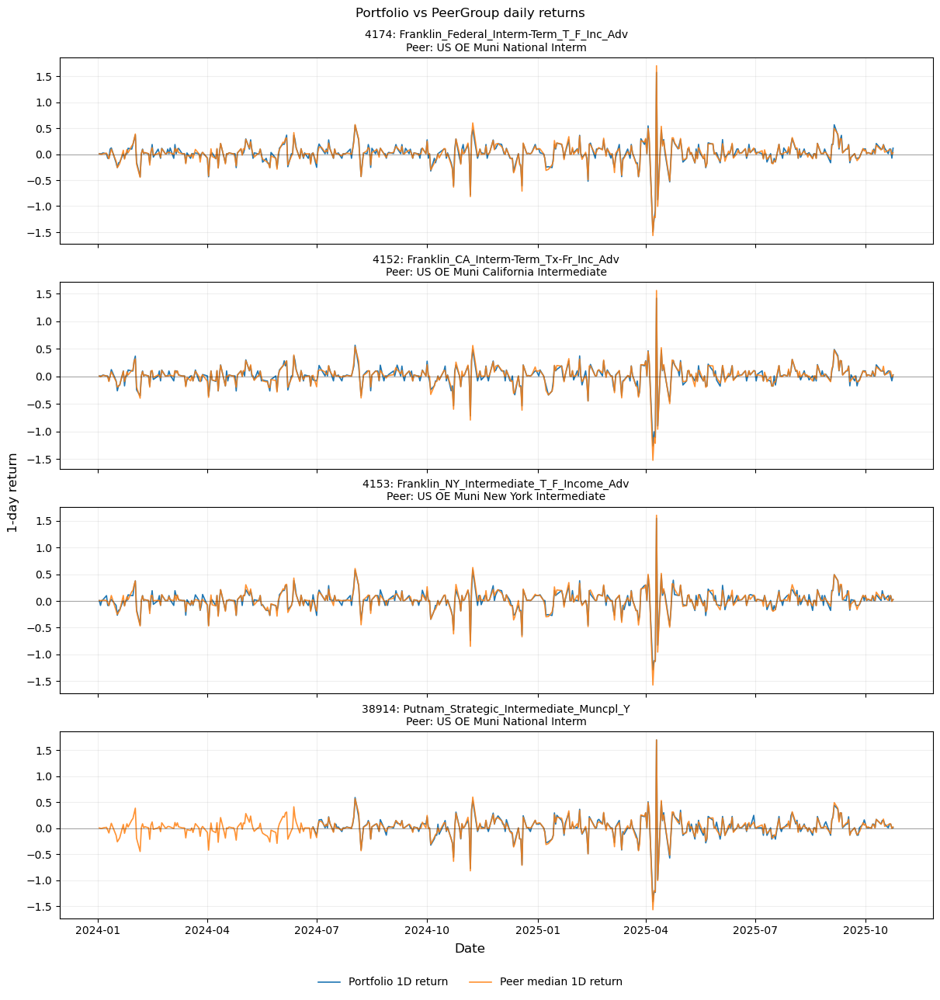

In [ ]:
def _plot_port_vs_peer(datasets_by_code, codes, start_dt=START):
    n = len(codes)
    if n == 0:
        print("[plot] no codes to plot")
        return

    rows = n
    fig, axes = plt.subplots(rows, 1, figsize=(12, 3*rows), sharex=True,
                             constrained_layout=True)

    if rows == 1:
        axes = [axes]

    for i, code in enumerate(codes):
        ax = axes[i]
        df = datasets_by_code.get(code)

        if df is None or df.empty:
            ax.text(0.5, 0.5, f"{code}: no data", transform=ax.transAxes,
                    ha="center", va="center")
            ax.set_axis_off()
            continue

        use = (df[["Date","Portfolio_Name","PeerGroup_Name",
                   "Portfolio_Return_1D","PeerGroup_Return_1D"]]
               .dropna(subset=["Date"])
               .sort_values("Date"))
        use = use[use["Date"] >= start_dt].reset_index(drop=True)

        if use.empty:
            ax.text(0.5, 0.5, f"{code}: no data after {start_dt.date()}",
                    transform=ax.transAxes, ha="center", va="center")
            ax.set_axis_off()
            continue

        pname = str(use["Portfolio_Name"].iloc[0])
        gname = str(use["PeerGroup_Name"].iloc[0])

        ax.plot(use["Date"], use["Portfolio_Return_1D"], lw=1.2,
                label="Portfolio 1D return")
        ax.plot(use["Date"], use["PeerGroup_Return_1D"], lw=1.2, alpha=0.85,
                label="Peer median 1D return")

        ax.axhline(0, lw=0.8, color="k", alpha=0.3)
        ax.grid(alpha=0.2)
        ax.set_title(f"{code}: {pname}\nPeer: {gname}", fontsize=10)

    # Label axes once
    fig.suptitle("Portfolio vs PeerGroup daily returns", y=1.02)
    fig.supxlabel("Date")
    fig.supylabel("1-day return")

    # One shared legend
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper center", ncol=2, frameon=False,
               bbox_to_anchor=(0.5, -0.01))

    plt.show()

_plot_port_vs_peer(datasets_full, SEL, start_dt=START)

In [47]:
# # ---------- Save wide panels to Excel + Parquet ----------
# excel_path = OUTPUT_DIR / "rolling_panels.xlsx"
# with pd.ExcelWriter(excel_path, engine="xlsxwriter") as writer:
#     # Level betas and diagnostics
#     wide_b1.to_excel(writer, sheet_name="Lvl_b1")
#     wide_b2.to_excel(writer, sheet_name="Lvl_b2")
#     wide_b3.to_excel(writer, sheet_name="Lvl_b3")
#     wide_r2.to_excel(writer, sheet_name="Lvl_r2")
#     rollstd_b1.to_excel(writer, sheet_name="Lvl_sigma_b1")
#     rollstd_b2.to_excel(writer, sheet_name="Lvl_sigma_b2")
#     rollstd_b3.to_excel(writer, sheet_name="Lvl_sigma_b3")

#     # Percent-change betas and diagnostics
#     wide_b1_pct.to_excel(writer, sheet_name="%Chg_b1")
#     wide_b2_pct.to_excel(writer, sheet_name="%Chg_b2")
#     wide_b3_pct.to_excel(writer, sheet_name="%Chg_b3")
#     wide_r2_pct.to_excel(writer, sheet_name="%Chg_r2")
#     # If you computed %Δ rolling stds:
#     try:
#         rollstd_b1_pct.to_excel(writer, sheet_name="%Chg_sigma_b1")
#         rollstd_b2_pct.to_excel(writer, sheet_name="%Chg_sigma_b2")
#         rollstd_b3_pct.to_excel(writer, sheet_name="%Chg_sigma_b3")
#     except NameError:
#         pass

# print(f"✓ Wrote {excel_path}")